<a href="https://colab.research.google.com/github/Charliebond125/MEGNet/blob/main/Optimised_MeanAcc_F1_AUC_KFoldCV_Modelling_Pipeline.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!git clone https://github.com/vlawhern/arl-eegmodels.git

Cloning into 'arl-eegmodels'...
remote: Enumerating objects: 112, done.
remote: Counting objects: 100% (6/6), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 112 (delta 1), reused 4 (delta 1), pack-reused 106
Receiving objects: 100% (112/112), 80.61 KiB | 20.15 MiB/s, done.
Resolving deltas: 100% (48/48), done.


In [ ]:
!pip install mne

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 55.4 MB/s eta 0:00:00


In [ ]:
import numpy as np
import pandas as pd
import mne
from mne import read_epochs
from mne import pick_types, Epochs
from mne.channels import read_layout
from sklearn.preprocessing import OneHotEncoder
from sklearn.utils import shuffle
from sklearn.metrics import roc_auc_score, accuracy_score, f1_score

from tensorflow.keras import utils as np_utils
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras import backend as K
K.set_image_data_format('channels_last')

# tools for plotting confusion matrices
from matplotlib import pyplot as plt
import tensorflow as tf

import sys, os

sys.path.append('/content/arl-eegmodels')

from EEGModels import EEGNet, ShallowConvNet, DeepConvNet

# Initialize a DataFrame to store the results
results_df = pd.DataFrame(columns=['Event Pair', 'AUC Score', 'kl', 'd'])

In [ ]:
# Function to preprocess the data for a specific event pair
def preprocess_data(event_pair_function, epochs_data):
    epochs_data_selected = event_pair_function(epochs_data)

    # Select only gradiometer channels
    grad_channels = mne.pick_types(epochs_data_selected.info, meg='grad')
    grad_channel_names = [epochs_data_selected.ch_names[ch] for ch in grad_channels]
    epochs_data_selected = epochs_data_selected.pick_channels(grad_channel_names)

    return epochs_data_selected

# Function to train and evaluate the model for a specific event pair
def train_and_evaluate_model(X_train, y_train, X_test, y_test, kl_values, d_values, n_epochs):
    # Initialize variables to store the highest AUC score and corresponding kl value
    highest_auc_score = 0
    best_kl = None
    best_d = None



    # Iterate over the kl and d values
    print('------------------------------------------------------------------------')
    print(f'Training for fold {fold_no} ...')
    for kl in kl_values:
        for d in d_values:
            print()
            print("Current kl:", kl)
            print("Current d:", d)
            print()

            # Configure the EEGNet model
            model = EEGNet(nb_classes=y_train.shape[1], Chans=X_train.shape[1], Samples=X_train.shape[2], dropoutRate=d, kernLength=kl)

            # Compile the model
            model.compile(loss='categorical_crossentropy', optimizer="adam", metrics=['accuracy'])

            # Set a valid path for model checkpoints
            checkpointer = ModelCheckpoint(filepath='/tmp/checkpoint.h5', verbose=1, save_best_only=True)

            # Class weights
            class_weights = {0: 1, 1: 1}

            # Fit the model to the training data
            history = model.fit(X_train, y_train, batch_size=16, epochs=n_epochs, verbose=2,
                                validation_split=0.1, callbacks=[checkpointer, EarlyStopping(patience=10)])

            # Access the accuracy values from the history object
            train_accuracy = history.history['accuracy']
            val_accuracy = history.history['val_accuracy']

            # Plot the training and validation accuracy
            epochs = range(1, len(train_accuracy) + 1)
            plt.plot(epochs, train_accuracy, 'b', label='Training Accuracy')
            plt.plot(epochs, val_accuracy, 'g', label='Validation Accuracy')
            plt.title('Training and Validation Accuracy')
            plt.xlabel('Epochs')
            plt.ylabel('Accuracy')
            plt.legend()
            plt.show()

            print('\n# Evaluate on test data')
            results = model.evaluate(X_test, y_test, batch_size=1)
            print('Test loss, Test accuracy:', results)

            # Evaluate the model on the test data
            y_pred = model.predict(X_test)
            auc_score = roc_auc_score(y_test, y_pred)

            # Print the AUC accuracy score
            print('AUC Accuracy Score:', auc_score)


            # Check if the current AUC score is higher than the highest recorded score
            if auc_score > highest_auc_score:
                highest_auc_score = auc_score
                best_kl = kl
                best_d = d

            # Reset the Keras session to clear the model
            K.clear_session()

            print()
            print('=' * 100)
            print('=' * 100)
            print()

    # Print the event pair, highest AUC score, kl value, and d value
    print("Highest AUC Score:", highest_auc_score)
    print("Best kl value:", best_kl)
    print("Best d value:", best_d)

    return highest_auc_score, best_kl, best_d

# Your provided functions for each event pair
def hands_vs_feet(epochs_data):
    event_dict = [
        "hand_imagery",
        "feet_imagery"
    ]

    return epochs_data[event_dict]


def hands_vs_word(epochs_data):
    event_dict = [
        "hand_imagery",
        "word_imagery"
    ]

    return epochs_data[event_dict]

def hands_vs_sub(epochs_data):
    event_dict = [
        "hand_imagery",
        "subtraction_imagery"
    ]


    return epochs_data[event_dict]

def feet_vs_word(epochs_data):
    event_dict = [
        "feet_imagery",
        "word_imagery"
    ]

    return epochs_data[event_dict]

def feet_vs_sub(epochs_data):
    event_dict = [
        "feet_imagery",
        "subtraction_imagery"
    ]

    return epochs_data[event_dict]

def word_vs_sub(epochs_data):
    event_dict = [
        "word_imagery",
        "subtraction_imagery"
    ]

    return epochs_data[event_dict]

def min_max_scaler(epoch_data):
    # scales data to -1, 1
    max_abs = np.max(np.abs(epoch_data))
    processed_data = epoch_data / max_abs
    return processed_data

def mne_standard_scaler(epoch_data):
    # Different from sklearn standardscaler
    # Works via channel to channel

    from mne.decoding import Scaler
    scaler = Scaler(scalings="mean")
    scaled_data = scaler.fit_transform(epoch_data)
    return scaled_data

def z_score_scaler(epoch_data):
    # scales by removing mean and unit standard deviation
    mean = np.mean(epoch_data)
    std = np.std(epoch_data)
    processed_data = (epoch_data - mean) / std
    return processed_data

<h1> Using Nested KFold CV for entire epoched dataset with combined runs. <h1>

In [ ]:
# Subject 3

n_epochs = 300

out_f_name = '/content/drive/MyDrive/Maxwell Filtered Data/Combined Run data' +'acc_EEGNet' + '_epochs_' + str(n_epochs) + '_filtered_' + 'sub_3.npy'
print(out_f_name)

# (loading dataset)
print("Loading epoched data...")
epoched_data = mne.read_epochs('/content/drive/MyDrive/Maxwell Filtered Data/Combined Run data/Sub_3_combined_runs_epochs-epo.fif', preload=True)
print(f"Epoched data successfully loaded {epoched_data}")

/content/drive/MyDrive/Maxwell Filtered Data/Combined Run dataacc_EEGNet_epochs_300_filtered_sub_3.npy
Loading epoched data...
Reading /content/drive/MyDrive/Maxwell Filtered Data/Combined Run data/Sub_3_combined_runs_epochs-epo.fif ...
    Read a total of 4 projection items:
        ECG-planar--0.200-0.400-PCA-01 (1 x 204) active
        ECG-axial--0.200-0.400-PCA-01 (1 x 102) active
        EOG-planar--0.200-0.200-PCA-01 (1 x 204) active
        EOG-axial--0.200-0.200-PCA-01 (1 x 102) active
    Found the data of interest:
        t =    2000.00 ...    6000.00 ms
        0 CTF compensation matrices available
Not setting metadata
400 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 4)
4 projection items activated
Epoched data successfully loaded <EpochsFIF |  400 events (all good), 2 – 6 s, baseline -0.2 – 0 s (baseline period was cropped after baseline correction), ~1.98 GB, data loaded,
 'hand_imagery': 100
 'feet_imagery': 100
 'sub

In [ ]:
event_id = {'hand_imagery': 4, 'feet_imagery': 8, 'subtraction_imagery': 16, 'word_imagery': 32}
event_pairs = [('hand_imagery', 'word_imagery'), ('hand_imagery', 'subtraction_imagery'),
               ('feet_imagery', 'word_imagery'), ('feet_imagery', 'subtraction_imagery')]

nsub = 1

# Motor vs Mental activity
event_pair_1 = [hands_vs_word]
event_pair_2 = [hands_vs_sub]
event_pair_3 = [feet_vs_word]
event_pair_4 = [feet_vs_sub]
event_pair_5 = [hands_vs_feet]
event_pair_6 = [word_vs_sub]

event_pairs_dict = {
    'hand vs word': hands_vs_word,
    'hand vs sub': hands_vs_sub,
    'feet vs word': feet_vs_word,
    'feet vs sub': feet_vs_sub,
    'hand vs feet': hands_vs_feet,
    'word vs sub': word_vs_sub
}

Select an event pair:
1. hand vs word
2. hand vs sub
3. feet vs word
4. feet vs sub
5. hand vs feet
6. word vs sub
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Removing projector <Projection | ECG-axial--0.200-0.400-PCA-01, active : True, n_channels : 102, exp. var : 89.40%>
Removing projector <Projection | EOG-axial--0.200-0.200-PCA-01, active : True, n_channels : 102, exp. var : 53.88%>

Current kl: 8
Current d: 0.1

>Train: 0=180, 1=180, Test: 0=20, 1=20
Fold: 1
------------------------------------------------------------------------
Training for fold 1 ...

Current kl: 8
Current d: 0.1

Epoch 1/300

Epoch 1: val_loss improved from inf to 0.69270, saving model to /tmp/checkpoint.h5
11/11 - 3s - loss: 0.7236 - accuracy: 0.4444 - val_loss: 0.6927 - val_accuracy: 0.5000 - 3s/epoch - 301ms/step
Epoch 2/300

Epoch 2: val_loss improved from 0.69270 to 0.68474, saving model to /tmp/checkpoint.h5
11/11 - 1s - loss: 0.5973 - accuracy: 0.7469 - val_loss: 0.6

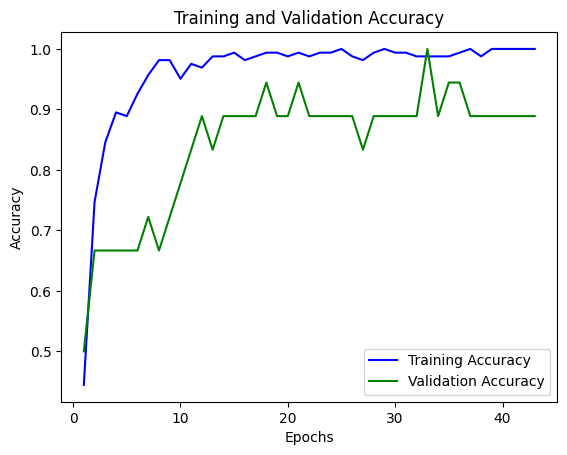


# Evaluate on test data
20/20 [==============================] - 0s 3ms/step - loss: 0.1202 - accuracy: 0.9500
Score for fold 1: loss of 0.12017283588647842; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 105ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.948849104859335
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.120
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.885%
------------------------------------------------------------------------
Average scores for all folds:
> Loss: 0.12017283588647842
> Accuracy: 94.9999988079071 (+- 0.0)
> AUC: 1.0
> F1: 0.948849104859335
------------------------------------------------------------------------
Event Pair: hand vs sub
Highest AUC Score: 1.0
Highest F1 Score: 0.948849104859335
Highest Accuracy Score: 0.95
Best kl

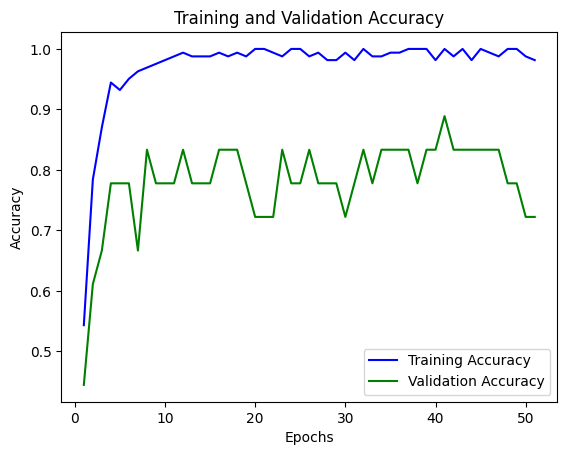


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.2939 - accuracy: 0.9500
Score for fold 2: loss of 0.29386842250823975; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 108ms/step
AUC Accuracy Score Per Fold: 0.9880952380952381
F1 Score Per Fold:  0.9430199430199431
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.120
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.294
>          - Accuracy: 95.000%
>          - AUC 98.810%
>          - F1: 94.302%
------------------------------------------------------------------------
Average scores for all folds:
> Loss: 0.20702062919735909
> Accuracy: 94.9999988079071 (+- 0.0)
> AUC: 0.9940476190476191
> F1: 0.

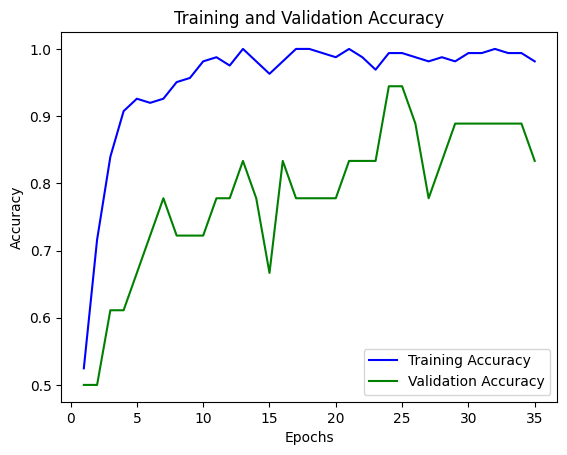


# Evaluate on test data
20/20 [==============================] - 0s 3ms/step - loss: 0.6004 - accuracy: 0.8500
Score for fold 3: loss of 0.6004387736320496; accuracy of 85.00000238418579%
1/1 [==============================] - 0s 108ms/step
AUC Accuracy Score Per Fold: 0.7912087912087913
F1 Score Per Fold:  0.829059829059829
Accuracy Per Fold:  0.85
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.120
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.294
>          - Accuracy: 95.000%
>          - AUC 98.810%
>          - F1: 94.302%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.600
>          - Accuracy: 85.000%
>          - AUC 79.121%
>          - F1: 82.906%
---------------------------

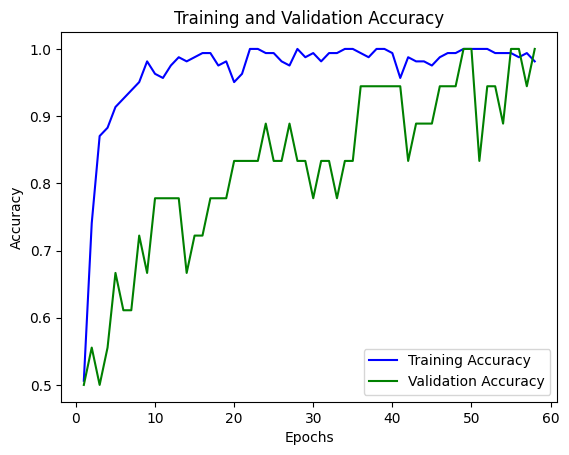


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.2431 - accuracy: 0.8500
Score for fold 4: loss of 0.24314065277576447; accuracy of 85.00000238418579%
1/1 [==============================] - 0s 125ms/step
AUC Accuracy Score Per Fold: 0.9880952380952381
F1 Score Per Fold:  0.8400000000000001
Accuracy Per Fold:  0.85
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.120
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.294
>          - Accuracy: 95.000%
>          - AUC 98.810%
>          - F1: 94.302%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.600
>          - Accuracy: 85.000%
>          - AUC 79.121%
>          - F1: 82.906%
-------------------------

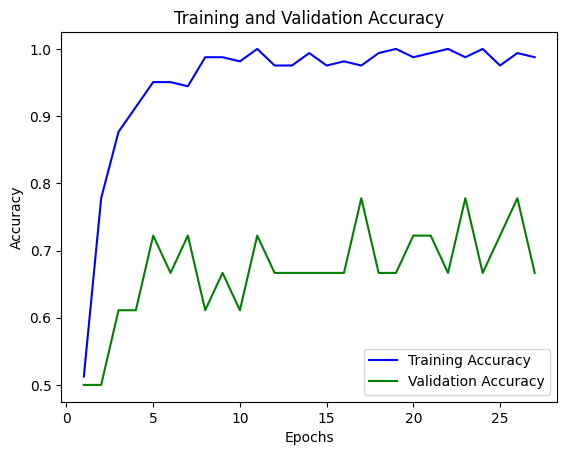


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.2412 - accuracy: 0.9500
Score for fold 5: loss of 0.2411637008190155; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 112ms/step
AUC Accuracy Score Per Fold: 0.9780219780219781
F1 Score Per Fold:  0.9466666666666668
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.120
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.294
>          - Accuracy: 95.000%
>          - AUC 98.810%
>          - F1: 94.302%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.600
>          - Accuracy: 85.000%
>          - AUC 79.121%
>          - F1: 82.906%
---------------------------

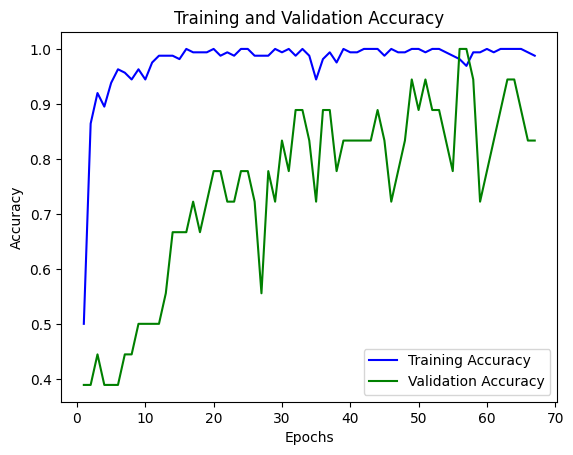


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.2331 - accuracy: 0.9000
Score for fold 6: loss of 0.23307189345359802; accuracy of 89.99999761581421%
1/1 [==============================] - 0s 112ms/step
AUC Accuracy Score Per Fold: 0.956043956043956
F1 Score Per Fold:  0.8901098901098901
Accuracy Per Fold:  0.9
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.120
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.294
>          - Accuracy: 95.000%
>          - AUC 98.810%
>          - F1: 94.302%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.600
>          - Accuracy: 85.000%
>          - AUC 79.121%
>          - F1: 82.906%
---------------------------

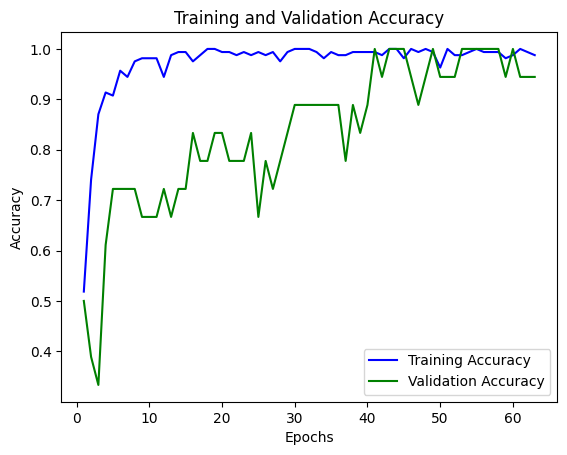


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1200 - accuracy: 0.9000
Score for fold 7: loss of 0.12001433223485947; accuracy of 89.99999761581421%
1/1 [==============================] - 0s 106ms/step
AUC Accuracy Score Per Fold: 0.989010989010989
F1 Score Per Fold:  0.8901098901098901
Accuracy Per Fold:  0.9
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.120
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.294
>          - Accuracy: 95.000%
>          - AUC 98.810%
>          - F1: 94.302%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.600
>          - Accuracy: 85.000%
>          - AUC 79.121%
>          - F1: 82.906%
---------------------------

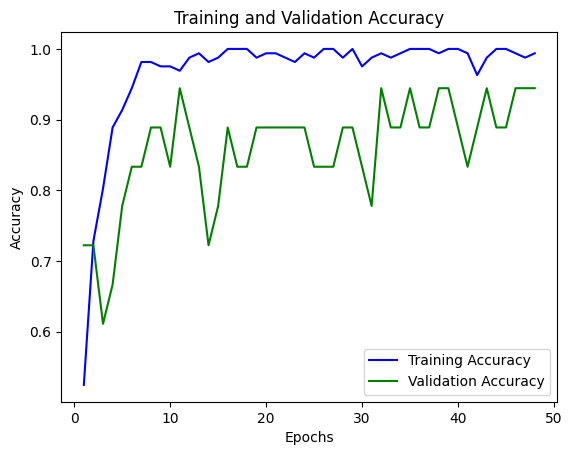


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.5882 - accuracy: 0.8000
Score for fold 8: loss of 0.5881918668746948; accuracy of 80.0000011920929%
1/1 [==============================] - 0s 112ms/step
AUC Accuracy Score Per Fold: 0.8484848484848484
F1 Score Per Fold:  0.7916666666666666
Accuracy Per Fold:  0.8
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.120
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.294
>          - Accuracy: 95.000%
>          - AUC 98.810%
>          - F1: 94.302%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.600
>          - Accuracy: 85.000%
>          - AUC 79.121%
>          - F1: 82.906%
----------------------------

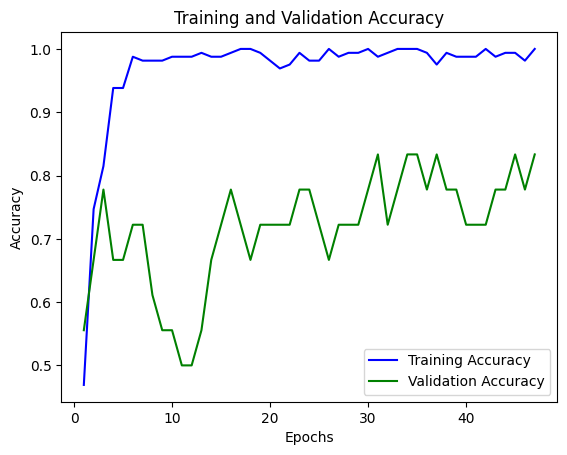


# Evaluate on test data
20/20 [==============================] - 0s 3ms/step - loss: 0.4859 - accuracy: 0.8000
Score for fold 9: loss of 0.4858611226081848; accuracy of 80.0000011920929%
1/1 [==============================] - 0s 102ms/step
AUC Accuracy Score Per Fold: 0.9404761904761905
F1 Score Per Fold:  0.7916666666666665
Accuracy Per Fold:  0.8
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.120
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.294
>          - Accuracy: 95.000%
>          - AUC 98.810%
>          - F1: 94.302%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.600
>          - Accuracy: 85.000%
>          - AUC 79.121%
>          - F1: 82.906%
----------------------------

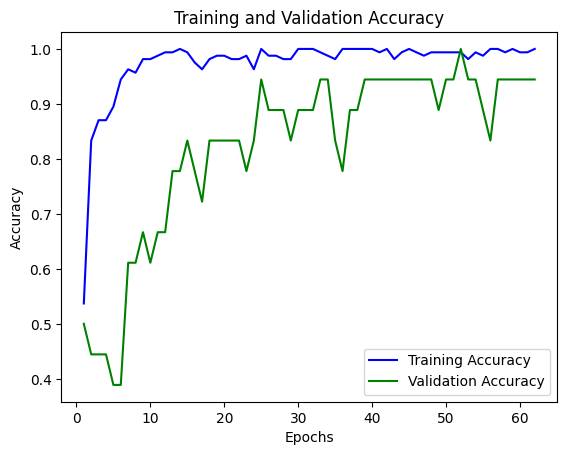


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.2810 - accuracy: 0.8500
Score for fold 10: loss of 0.2810366749763489; accuracy of 85.00000238418579%
1/1 [==============================] - 0s 111ms/step
AUC Accuracy Score Per Fold: 0.9340659340659341
F1 Score Per Fold:  0.8465473145780051
Accuracy Per Fold:  0.85
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.120
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.294
>          - Accuracy: 95.000%
>          - AUC 98.810%
>          - F1: 94.302%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.600
>          - Accuracy: 85.000%
>          - AUC 79.121%
>          - F1: 82.906%
-------------------------

<ipython-input-15-56b6b828fbcc>:250: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'Fold Number': list(range(1, fold_counter)),


    Event Pair  Highest AUC Score  Highest Accuracy  Highest F1 Score  \
0  hand vs sub                1.0              0.95          0.948849   

  Average ROC AUC Average Accuracy Average F1 Score kl    d  \
0             NaN              NaN              NaN  8  0.1   

                       Fold Number  \
0  [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]   

                                    10-Fold Accuracy  \
0  [0.95, 0.95, 0.85, 0.85, 0.95, 0.9, 0.9, 0.8, ...   

                                    10-Fold F1 Score  \
0  [0.948849104859335, 0.9430199430199431, 0.8290...   

                               10-Fold ROC AUC Score  Mean 10-Fold Accuracy  \
0  [1.0, 0.9880952380952381, 0.7912087912087913, ...                   0.88   

   Mean 10-Fold F1 Score  Mean 10-Fold ROC AUC Score  
0                0.87177                     0.94135  

Current kl: 8
Current d: 0.2

>Train: 0=180, 1=180, Test: 0=20, 1=20
Fold: 1
------------------------------------------------------------------------
Tra

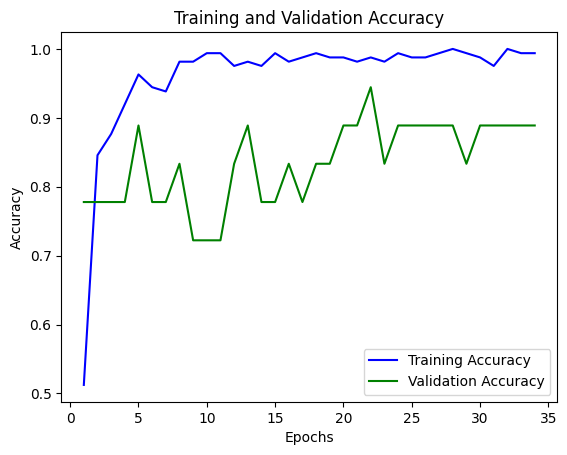


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.2149 - accuracy: 0.8500
Score for fold 1: loss of 0.2149159014225006; accuracy of 85.00000238418579%
1/1 [==============================] - 0s 109ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.849624060150376
Accuracy Per Fold:  0.85
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.215
>          - Accuracy: 85.000%
>          - AUC 100.000%
>          - F1: 84.962%
------------------------------------------------------------------------
Average scores for all folds:
> Loss: 0.2149159014225006
> Accuracy: 85.00000238418579 (+- 0.0)
> AUC: 1.0
> F1: 0.849624060150376
------------------------------------------------------------------------
Event Pair: hand vs sub
Highest AUC Score: 1.0
Highest F1 Score: 0.948849104859335
Highest Accuracy Score: 0.95
Best kl

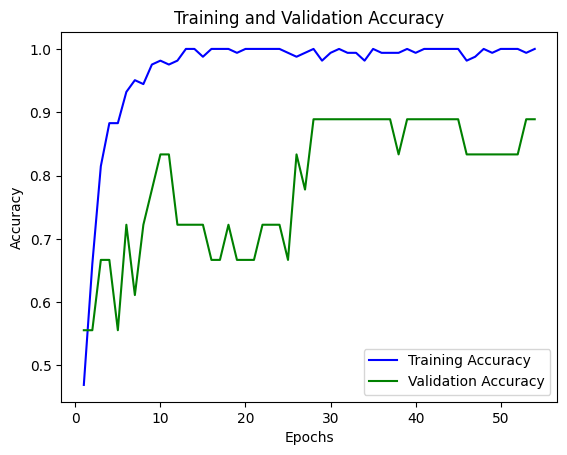


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0618 - accuracy: 1.0000
Score for fold 2: loss of 0.06184465438127518; accuracy of 100.0%
1/1 [==============================] - 0s 112ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.215
>          - Accuracy: 85.000%
>          - AUC 100.000%
>          - F1: 84.962%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.062
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
Average scores for all folds:
> Loss: 0.1383802779018879
> Accuracy: 92.5000011920929 (+- 7.4999988079071045)
> AUC: 1.0
> F1: 0.924812030075188
------------------------

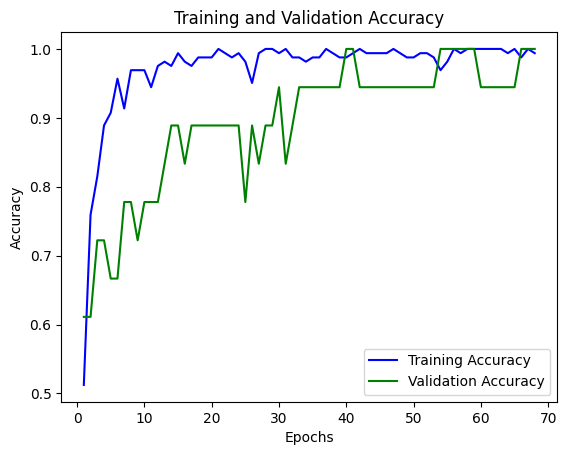


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.2988 - accuracy: 0.9000
Score for fold 3: loss of 0.29881352186203003; accuracy of 89.99999761581421%
1/1 [==============================] - 0s 112ms/step
AUC Accuracy Score Per Fold: 0.9340659340659341
F1 Score Per Fold:  0.8901098901098901
Accuracy Per Fold:  0.9
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.215
>          - Accuracy: 85.000%
>          - AUC 100.000%
>          - F1: 84.962%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.062
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.299
>          - Accuracy: 90.000%
>          - AUC 93.407%
>          - F1: 89.011%
-----------------------

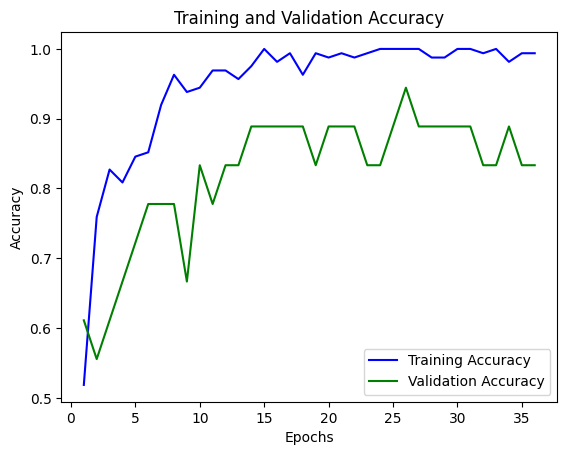


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.2634 - accuracy: 0.8500
Score for fold 4: loss of 0.26344555616378784; accuracy of 85.00000238418579%
1/1 [==============================] - 0s 114ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.8400000000000001
Accuracy Per Fold:  0.85
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.215
>          - Accuracy: 85.000%
>          - AUC 100.000%
>          - F1: 84.962%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.062
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.299
>          - Accuracy: 90.000%
>          - AUC 93.407%
>          - F1: 89.011%
-------------------------------------

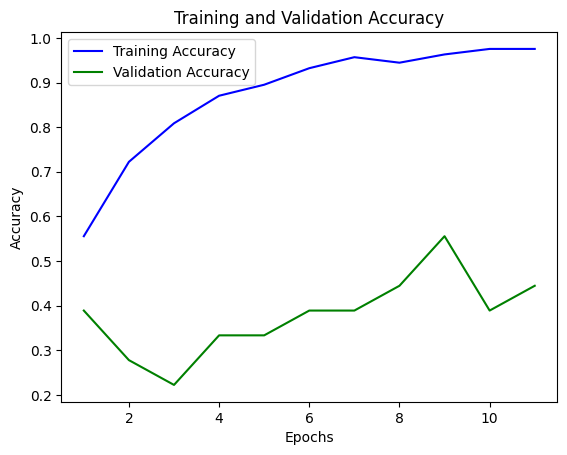


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.5814 - accuracy: 0.7500
Score for fold 5: loss of 0.5813795328140259; accuracy of 75.0%
1/1 [==============================] - 0s 120ms/step
AUC Accuracy Score Per Fold: 0.8021978021978022
F1 Score Per Fold:  0.7333333333333334
Accuracy Per Fold:  0.75
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.215
>          - Accuracy: 85.000%
>          - AUC 100.000%
>          - F1: 84.962%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.062
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.299
>          - Accuracy: 90.000%
>          - AUC 93.407%
>          - F1: 89.011%
------------------------------------

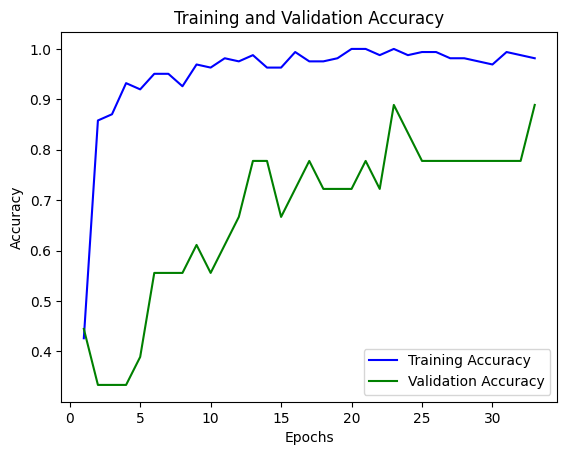


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.3294 - accuracy: 0.8500
Score for fold 6: loss of 0.32944345474243164; accuracy of 85.00000238418579%
1/1 [==============================] - 0s 106ms/step
AUC Accuracy Score Per Fold: 0.956043956043956
F1 Score Per Fold:  0.8399999999999999
Accuracy Per Fold:  0.85
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.215
>          - Accuracy: 85.000%
>          - AUC 100.000%
>          - F1: 84.962%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.062
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.299
>          - Accuracy: 90.000%
>          - AUC 93.407%
>          - F1: 89.011%
-----------------------

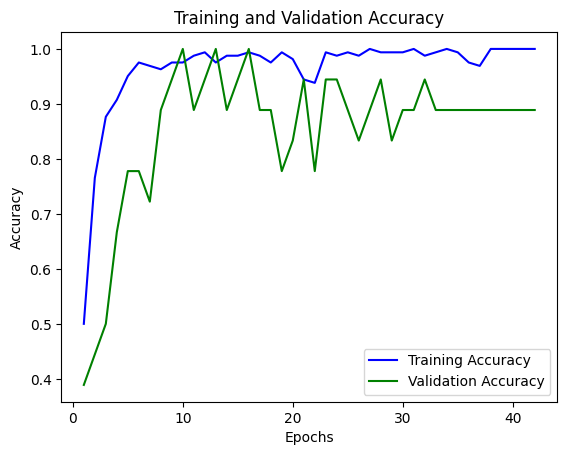


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1866 - accuracy: 0.9500
Score for fold 7: loss of 0.18658842146396637; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 110ms/step
AUC Accuracy Score Per Fold: 0.989010989010989
F1 Score Per Fold:  0.9430199430199431
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.215
>          - Accuracy: 85.000%
>          - AUC 100.000%
>          - F1: 84.962%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.062
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.299
>          - Accuracy: 90.000%
>          - AUC 93.407%
>          - F1: 89.011%
------------------------

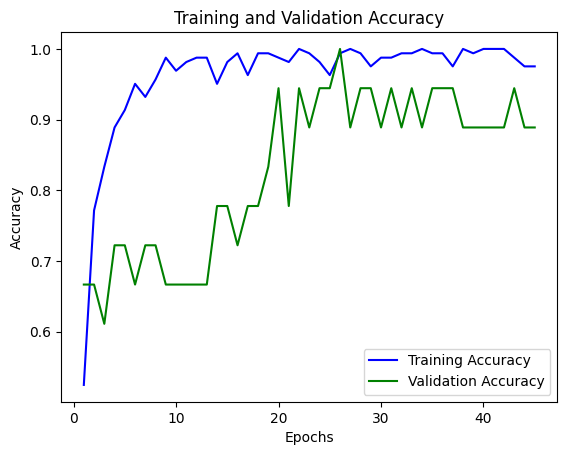


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.5807 - accuracy: 0.8000
Score for fold 8: loss of 0.5806944370269775; accuracy of 80.0000011920929%
1/1 [==============================] - 0s 107ms/step
AUC Accuracy Score Per Fold: 0.808080808080808
F1 Score Per Fold:  0.7916666666666666
Accuracy Per Fold:  0.8
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.215
>          - Accuracy: 85.000%
>          - AUC 100.000%
>          - F1: 84.962%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.062
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.299
>          - Accuracy: 90.000%
>          - AUC 93.407%
>          - F1: 89.011%
--------------------------

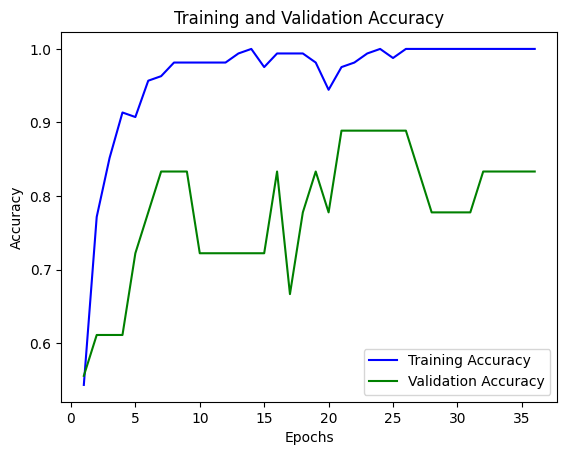


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.2537 - accuracy: 0.9000
Score for fold 9: loss of 0.2536925673484802; accuracy of 89.99999761581421%
1/1 [==============================] - 0s 115ms/step
AUC Accuracy Score Per Fold: 0.9523809523809523
F1 Score Per Fold:  0.8809523809523809
Accuracy Per Fold:  0.9
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.215
>          - Accuracy: 85.000%
>          - AUC 100.000%
>          - F1: 84.962%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.062
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.299
>          - Accuracy: 90.000%
>          - AUC 93.407%
>          - F1: 89.011%
------------------------

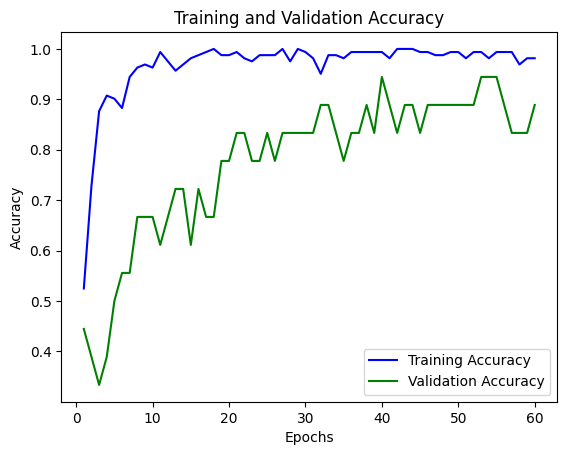


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.2295 - accuracy: 0.8500
Score for fold 10: loss of 0.2295105755329132; accuracy of 85.00000238418579%
1/1 [==============================] - 0s 114ms/step
AUC Accuracy Score Per Fold: 0.967032967032967
F1 Score Per Fold:  0.8399999999999999
Accuracy Per Fold:  0.85
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.215
>          - Accuracy: 85.000%
>          - AUC 100.000%
>          - F1: 84.962%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.062
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.299
>          - Accuracy: 90.000%
>          - AUC 93.407%
>          - F1: 89.011%
-----------------------

<ipython-input-15-56b6b828fbcc>:250: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'Fold Number': list(range(1, fold_counter)),


    Event Pair  Highest AUC Score  Highest Accuracy  Highest F1 Score  \
0  hand vs sub                1.0              0.95          0.948849   
1  hand vs sub                1.0              1.00          1.000000   

  Average ROC AUC Average Accuracy Average F1 Score kl    d  \
0             NaN              NaN              NaN  8  0.1   
1             NaN              NaN              NaN  8  0.1   

                       Fold Number  \
0  [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]   
1  [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]   

                                    10-Fold Accuracy  \
0  [0.95, 0.95, 0.85, 0.85, 0.95, 0.9, 0.9, 0.8, ...   
1  [0.85, 1.0, 0.9, 0.85, 0.75, 0.85, 0.95, 0.8, ...   

                                    10-Fold F1 Score  \
0  [0.948849104859335, 0.9430199430199431, 0.8290...   
1  [0.849624060150376, 1.0, 0.8901098901098901, 0...   

                               10-Fold ROC AUC Score  Mean 10-Fold Accuracy  \
0  [1.0, 0.9880952380952381, 0.7912087912087913, ...      

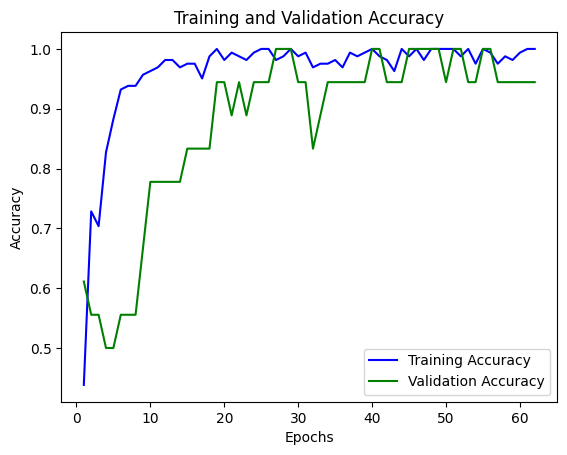


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1664 - accuracy: 0.9500
Score for fold 1: loss of 0.16636432707309723; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 114ms/step
AUC Accuracy Score Per Fold: 0.9791666666666666
F1 Score Per Fold:  0.948849104859335
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.166
>          - Accuracy: 95.000%
>          - AUC 97.917%
>          - F1: 94.885%
------------------------------------------------------------------------
Average scores for all folds:
> Loss: 0.16636432707309723
> Accuracy: 94.9999988079071 (+- 0.0)
> AUC: 0.9791666666666666
> F1: 0.948849104859335
------------------------------------------------------------------------
Event Pair: hand vs sub
Highest AUC Score: 1.0
Highest F1 Score: 1.0
Highest Accuracy Scor

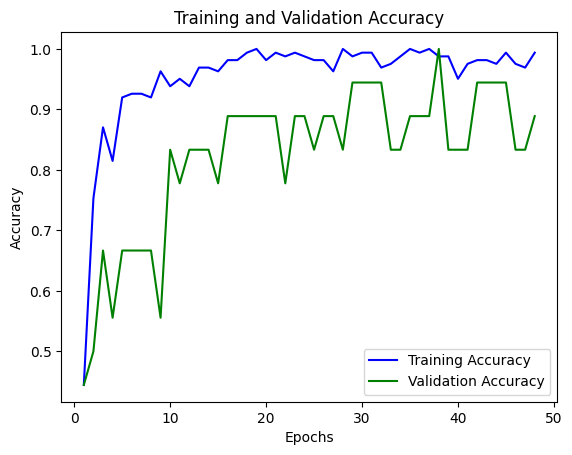


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1062 - accuracy: 1.0000
Score for fold 2: loss of 0.10618659108877182; accuracy of 100.0%
1/1 [==============================] - 0s 107ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.166
>          - Accuracy: 95.000%
>          - AUC 97.917%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.106
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
Average scores for all folds:
> Loss: 0.13627545908093452
> Accuracy: 97.49999940395355 (+- 2.5000005960464478)
> AUC: 0.9895833333333333
> F1: 0.9744245524296675
-------

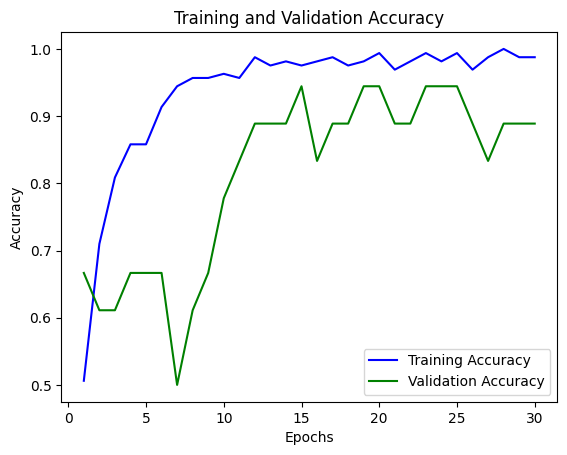


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.3836 - accuracy: 0.7500
Score for fold 3: loss of 0.3836044669151306; accuracy of 75.0%
1/1 [==============================] - 0s 112ms/step
AUC Accuracy Score Per Fold: 0.9230769230769231
F1 Score Per Fold:  0.7333333333333334
Accuracy Per Fold:  0.75
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.166
>          - Accuracy: 95.000%
>          - AUC 97.917%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.106
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.384
>          - Accuracy: 75.000%
>          - AUC 92.308%
>          - F1: 73.333%
-------------------------------------

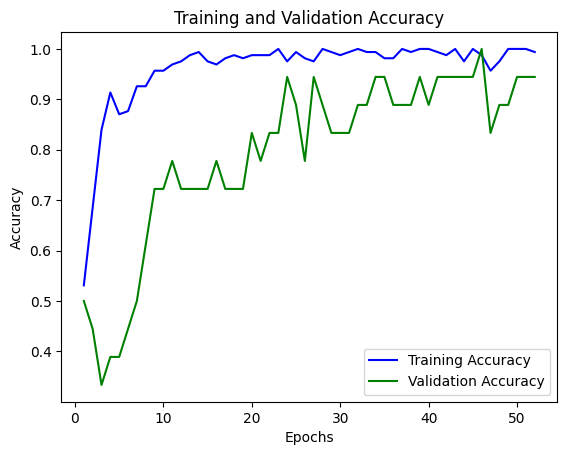


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0851 - accuracy: 0.9500
Score for fold 4: loss of 0.08511751890182495; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 111ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.9430199430199431
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.166
>          - Accuracy: 95.000%
>          - AUC 97.917%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.106
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.384
>          - Accuracy: 75.000%
>          - AUC 92.308%
>          - F1: 73.333%
---------------------------------------

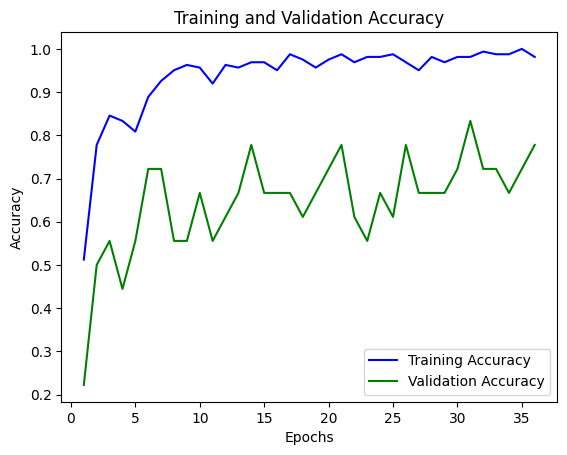


# Evaluate on test data
20/20 [==============================] - 0s 5ms/step - loss: 0.1975 - accuracy: 0.9500
Score for fold 5: loss of 0.19753780961036682; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 123ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.9466666666666668
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.166
>          - Accuracy: 95.000%
>          - AUC 97.917%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.106
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.384
>          - Accuracy: 75.000%
>          - AUC 92.308%
>          - F1: 73.333%
---------------------------------------

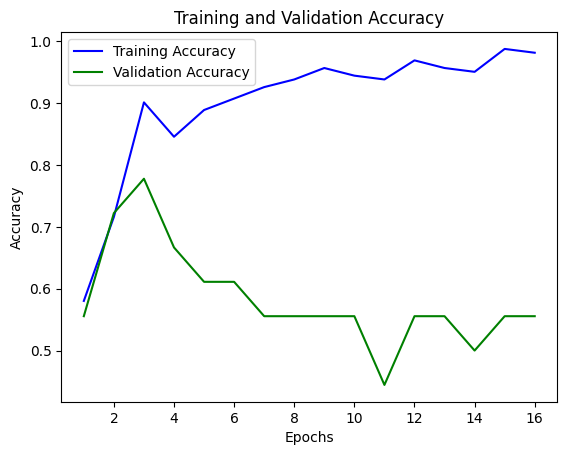


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.8944 - accuracy: 0.4000
Score for fold 6: loss of 0.8944370150566101; accuracy of 40.00000059604645%
1/1 [==============================] - 0s 105ms/step
AUC Accuracy Score Per Fold: 0.8901098901098901
F1 Score Per Fold:  0.34065934065934067
Accuracy Per Fold:  0.4
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.166
>          - Accuracy: 95.000%
>          - AUC 97.917%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.106
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.384
>          - Accuracy: 75.000%
>          - AUC 92.308%
>          - F1: 73.333%
------------------------

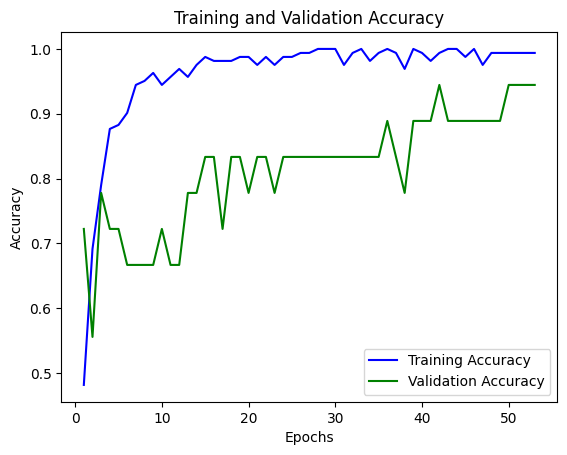


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1338 - accuracy: 0.9500
Score for fold 7: loss of 0.1338174045085907; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 115ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.9430199430199431
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.166
>          - Accuracy: 95.000%
>          - AUC 97.917%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.106
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.384
>          - Accuracy: 75.000%
>          - AUC 92.308%
>          - F1: 73.333%
----------------------------------------

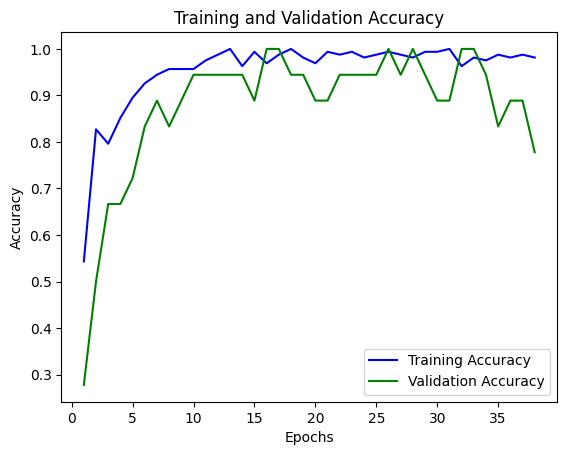


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.3853 - accuracy: 0.8000
Score for fold 8: loss of 0.3853141665458679; accuracy of 80.0000011920929%
1/1 [==============================] - 0s 124ms/step
AUC Accuracy Score Per Fold: 0.9090909090909092
F1 Score Per Fold:  0.7916666666666666
Accuracy Per Fold:  0.8
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.166
>          - Accuracy: 95.000%
>          - AUC 97.917%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.106
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.384
>          - Accuracy: 75.000%
>          - AUC 92.308%
>          - F1: 73.333%
--------------------------

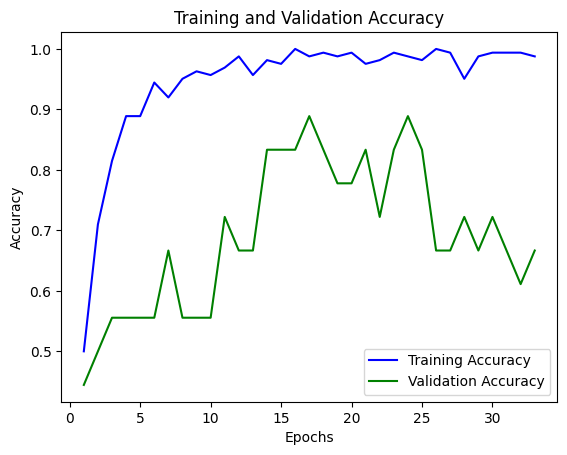


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.6866 - accuracy: 0.7000
Score for fold 9: loss of 0.6865989565849304; accuracy of 69.9999988079071%
1/1 [==============================] - 0s 113ms/step
AUC Accuracy Score Per Fold: 0.9880952380952381
F1 Score Per Fold:  0.696969696969697
Accuracy Per Fold:  0.7
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.166
>          - Accuracy: 95.000%
>          - AUC 97.917%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.106
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.384
>          - Accuracy: 75.000%
>          - AUC 92.308%
>          - F1: 73.333%
---------------------------

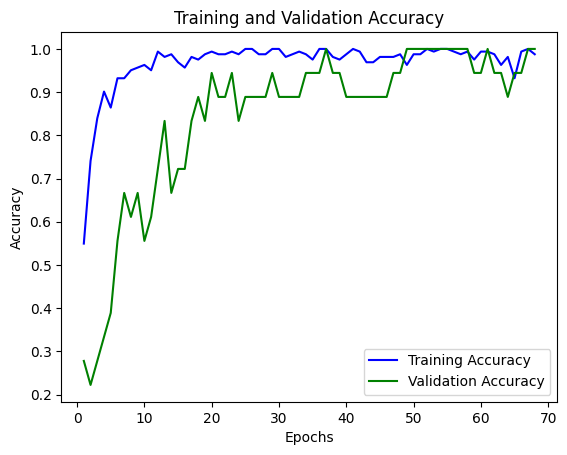


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1886 - accuracy: 0.9000
Score for fold 10: loss of 0.18864013254642487; accuracy of 89.99999761581421%
1/1 [==============================] - 0s 107ms/step
AUC Accuracy Score Per Fold: 0.9780219780219781
F1 Score Per Fold:  0.8809523809523809
Accuracy Per Fold:  0.9
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.166
>          - Accuracy: 95.000%
>          - AUC 97.917%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.106
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.384
>          - Accuracy: 75.000%
>          - AUC 92.308%
>          - F1: 73.333%
-----------------------

<ipython-input-15-56b6b828fbcc>:250: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'Fold Number': list(range(1, fold_counter)),


    Event Pair  Highest AUC Score  Highest Accuracy  Highest F1 Score  \
0  hand vs sub                1.0              0.95          0.948849   
1  hand vs sub                1.0              1.00          1.000000   
2  hand vs sub                1.0              1.00          1.000000   

  Average ROC AUC Average Accuracy Average F1 Score kl    d  \
0             NaN              NaN              NaN  8  0.1   
1             NaN              NaN              NaN  8  0.1   
2             NaN              NaN              NaN  8  0.1   

                       Fold Number  \
0  [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]   
1  [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]   
2  [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]   

                                    10-Fold Accuracy  \
0  [0.95, 0.95, 0.85, 0.85, 0.95, 0.9, 0.9, 0.8, ...   
1  [0.85, 1.0, 0.9, 0.85, 0.75, 0.85, 0.95, 0.8, ...   
2  [0.95, 1.0, 0.75, 0.95, 0.95, 0.4, 0.95, 0.8, ...   

                                    10-Fold F1 Score  \
0  [0.94884910485933

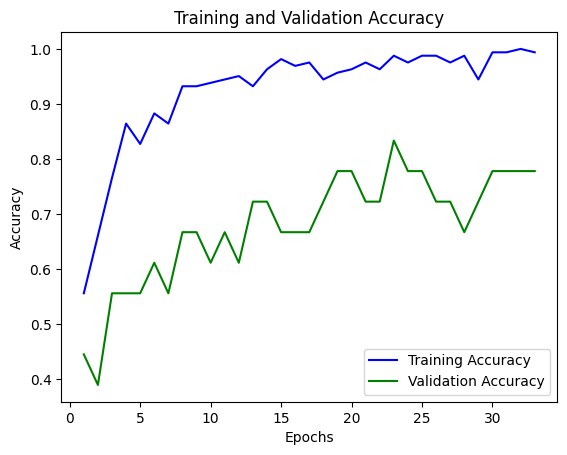


# Evaluate on test data
20/20 [==============================] - 0s 3ms/step - loss: 0.2426 - accuracy: 0.9000
Score for fold 1: loss of 0.2426389902830124; accuracy of 89.99999761581421%
1/1 [==============================] - 0s 115ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.898989898989899
Accuracy Per Fold:  0.9
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.243
>          - Accuracy: 90.000%
>          - AUC 100.000%
>          - F1: 89.899%
------------------------------------------------------------------------
Average scores for all folds:
> Loss: 0.2426389902830124
> Accuracy: 89.99999761581421 (+- 0.0)
> AUC: 1.0
> F1: 0.898989898989899
------------------------------------------------------------------------
Event Pair: hand vs sub
Highest AUC Score: 1.0
Highest F1 Score: 1.0
Highest Accuracy Score: 1.0
Best kl value: 8
Best d

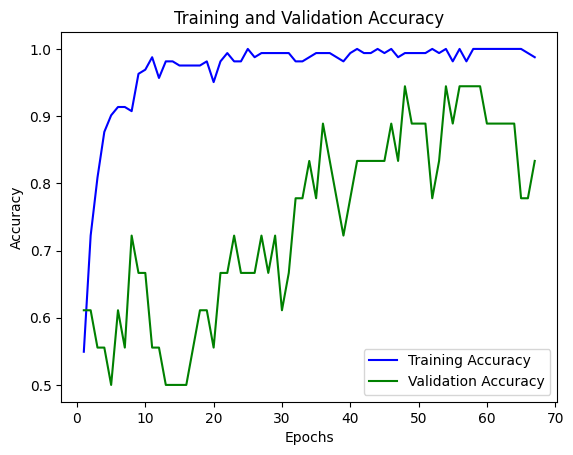


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1521 - accuracy: 0.9000
Score for fold 2: loss of 0.15213149785995483; accuracy of 89.99999761581421%
1/1 [==============================] - 0s 101ms/step
AUC Accuracy Score Per Fold: 0.9880952380952381
F1 Score Per Fold:  0.8901098901098901
Accuracy Per Fold:  0.9
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.243
>          - Accuracy: 90.000%
>          - AUC 100.000%
>          - F1: 89.899%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.152
>          - Accuracy: 90.000%
>          - AUC 98.810%
>          - F1: 89.011%
------------------------------------------------------------------------
Average scores for all folds:
> Loss: 0.1973852440714836
> Accuracy: 89.99999761581421 (+- 0.0)
> AUC: 0.9940476190476191
> F1: 0.

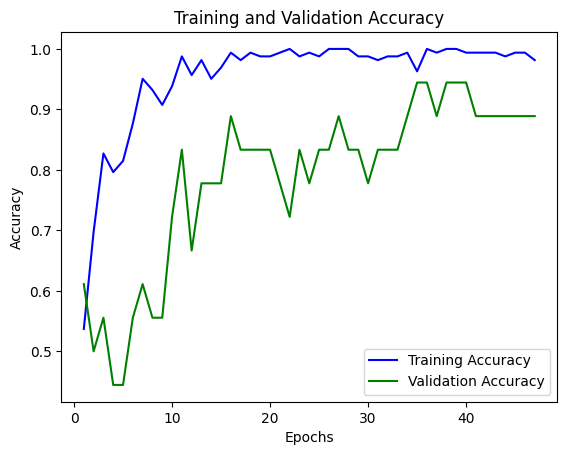


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.3889 - accuracy: 0.7500
Score for fold 3: loss of 0.38893967866897583; accuracy of 75.0%
1/1 [==============================] - 0s 108ms/step
AUC Accuracy Score Per Fold: 0.8901098901098901
F1 Score Per Fold:  0.715099715099715
Accuracy Per Fold:  0.75
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.243
>          - Accuracy: 90.000%
>          - AUC 100.000%
>          - F1: 89.899%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.152
>          - Accuracy: 90.000%
>          - AUC 98.810%
>          - F1: 89.011%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.389
>          - Accuracy: 75.000%
>          - AUC 89.011%
>          - F1: 71.510%
---------------------------------------

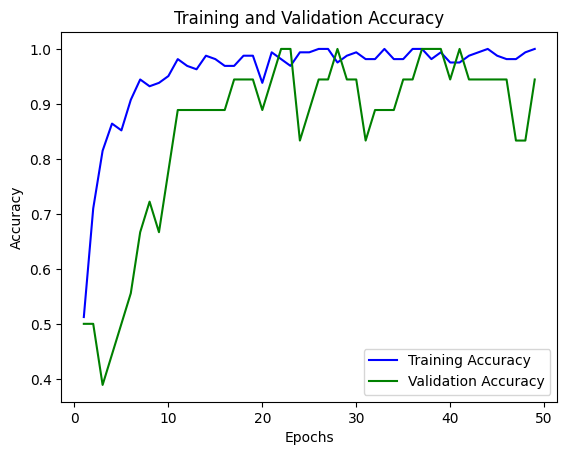


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.2484 - accuracy: 0.8500
Score for fold 4: loss of 0.24837954342365265; accuracy of 85.00000238418579%
1/1 [==============================] - 0s 117ms/step
AUC Accuracy Score Per Fold: 0.9880952380952381
F1 Score Per Fold:  0.8400000000000001
Accuracy Per Fold:  0.85
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.243
>          - Accuracy: 90.000%
>          - AUC 100.000%
>          - F1: 89.899%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.152
>          - Accuracy: 90.000%
>          - AUC 98.810%
>          - F1: 89.011%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.389
>          - Accuracy: 75.000%
>          - AUC 89.011%
>          - F1: 71.510%
-------------------------

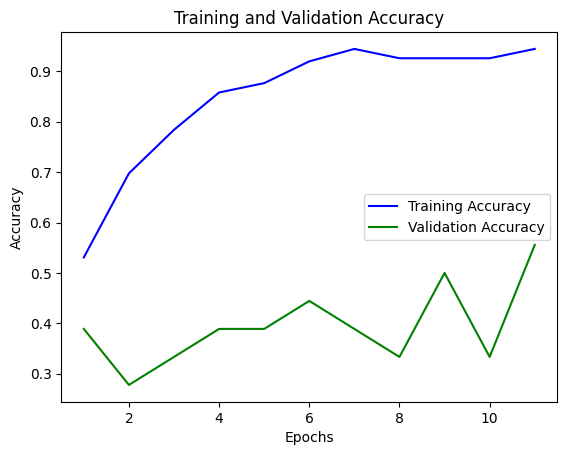


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.5624 - accuracy: 0.7000
Score for fold 5: loss of 0.5624348521232605; accuracy of 69.9999988079071%
1/1 [==============================] - 0s 111ms/step
AUC Accuracy Score Per Fold: 0.7692307692307692
F1 Score Per Fold:  0.6703296703296704
Accuracy Per Fold:  0.7
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.243
>          - Accuracy: 90.000%
>          - AUC 100.000%
>          - F1: 89.899%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.152
>          - Accuracy: 90.000%
>          - AUC 98.810%
>          - F1: 89.011%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.389
>          - Accuracy: 75.000%
>          - AUC 89.011%
>          - F1: 71.510%
----------------------------

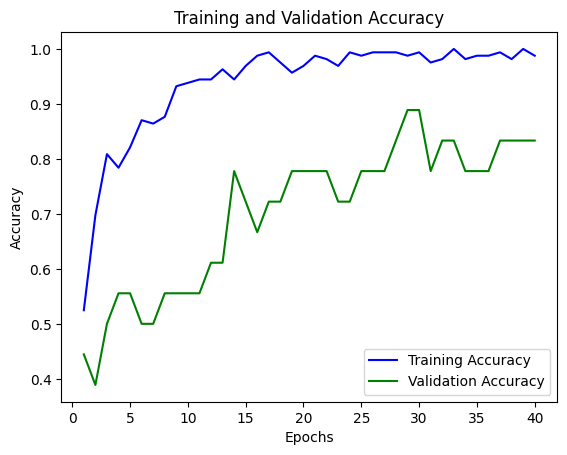


# Evaluate on test data
20/20 [==============================] - 0s 5ms/step - loss: 0.2629 - accuracy: 0.9000
Score for fold 6: loss of 0.26292216777801514; accuracy of 89.99999761581421%
1/1 [==============================] - 0s 109ms/step
AUC Accuracy Score Per Fold: 0.9670329670329669
F1 Score Per Fold:  0.8901098901098901
Accuracy Per Fold:  0.9
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.243
>          - Accuracy: 90.000%
>          - AUC 100.000%
>          - F1: 89.899%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.152
>          - Accuracy: 90.000%
>          - AUC 98.810%
>          - F1: 89.011%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.389
>          - Accuracy: 75.000%
>          - AUC 89.011%
>          - F1: 71.510%
--------------------------

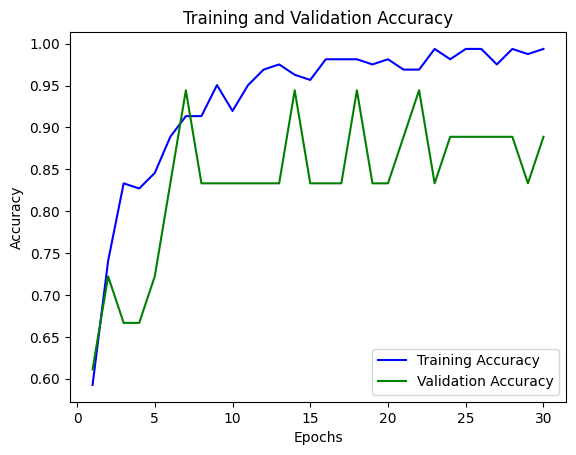


# Evaluate on test data
20/20 [==============================] - 0s 5ms/step - loss: 0.2096 - accuracy: 0.9000
Score for fold 7: loss of 0.20963788032531738; accuracy of 89.99999761581421%
1/1 [==============================] - 0s 115ms/step
AUC Accuracy Score Per Fold: 0.9780219780219781
F1 Score Per Fold:  0.8901098901098901
Accuracy Per Fold:  0.9
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.243
>          - Accuracy: 90.000%
>          - AUC 100.000%
>          - F1: 89.899%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.152
>          - Accuracy: 90.000%
>          - AUC 98.810%
>          - F1: 89.011%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.389
>          - Accuracy: 75.000%
>          - AUC 89.011%
>          - F1: 71.510%
--------------------------

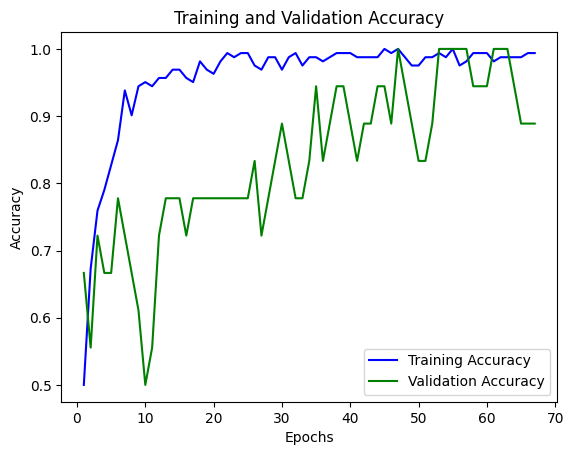


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.2139 - accuracy: 0.8500
Score for fold 8: loss of 0.21390536427497864; accuracy of 85.00000238418579%
1/1 [==============================] - 0s 108ms/step
AUC Accuracy Score Per Fold: 0.9696969696969697
F1 Score Per Fold:  0.8465473145780051
Accuracy Per Fold:  0.85
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.243
>          - Accuracy: 90.000%
>          - AUC 100.000%
>          - F1: 89.899%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.152
>          - Accuracy: 90.000%
>          - AUC 98.810%
>          - F1: 89.011%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.389
>          - Accuracy: 75.000%
>          - AUC 89.011%
>          - F1: 71.510%
-------------------------

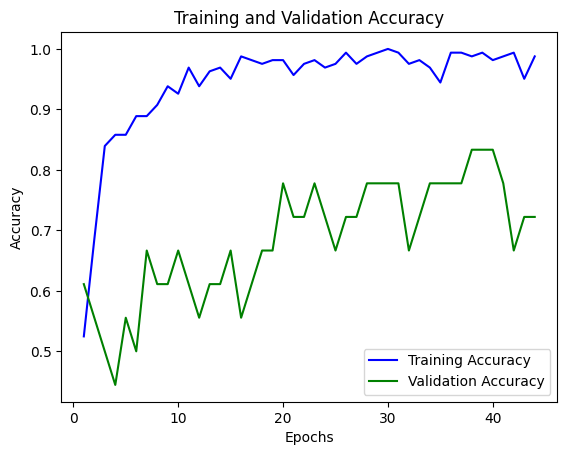


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.4871 - accuracy: 0.6500
Score for fold 9: loss of 0.487090528011322; accuracy of 64.99999761581421%
1/1 [==============================] - 0s 102ms/step
AUC Accuracy Score Per Fold: 0.9880952380952381
F1 Score Per Fold:  0.6491228070175439
Accuracy Per Fold:  0.65
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.243
>          - Accuracy: 90.000%
>          - AUC 100.000%
>          - F1: 89.899%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.152
>          - Accuracy: 90.000%
>          - AUC 98.810%
>          - F1: 89.011%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.389
>          - Accuracy: 75.000%
>          - AUC 89.011%
>          - F1: 71.510%
---------------------------

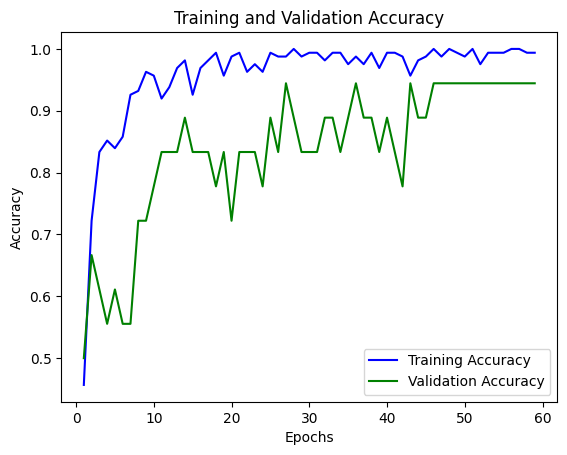


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.2707 - accuracy: 0.9000
Score for fold 10: loss of 0.27073898911476135; accuracy of 89.99999761581421%
1/1 [==============================] - 0s 106ms/step
AUC Accuracy Score Per Fold: 0.956043956043956
F1 Score Per Fold:  0.8958333333333334
Accuracy Per Fold:  0.9
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.243
>          - Accuracy: 90.000%
>          - AUC 100.000%
>          - F1: 89.899%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.152
>          - Accuracy: 90.000%
>          - AUC 98.810%
>          - F1: 89.011%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.389
>          - Accuracy: 75.000%
>          - AUC 89.011%
>          - F1: 71.510%
--------------------------

<ipython-input-15-56b6b828fbcc>:250: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'Fold Number': list(range(1, fold_counter)),


    Event Pair  Highest AUC Score  Highest Accuracy  Highest F1 Score  \
0  hand vs sub                1.0              0.95          0.948849   
1  hand vs sub                1.0              1.00          1.000000   
2  hand vs sub                1.0              1.00          1.000000   
3  hand vs sub                1.0              1.00          1.000000   

  Average ROC AUC Average Accuracy Average F1 Score kl    d  \
0             NaN              NaN              NaN  8  0.1   
1             NaN              NaN              NaN  8  0.1   
2             NaN              NaN              NaN  8  0.1   
3             NaN              NaN              NaN  8  0.1   

                       Fold Number  \
0  [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]   
1  [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]   
2  [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]   
3  [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]   

                                    10-Fold Accuracy  \
0  [0.95, 0.95, 0.85, 0.85, 0.95, 0.9, 0.9, 0.8, ...   
1  [0.85, 1.0, 

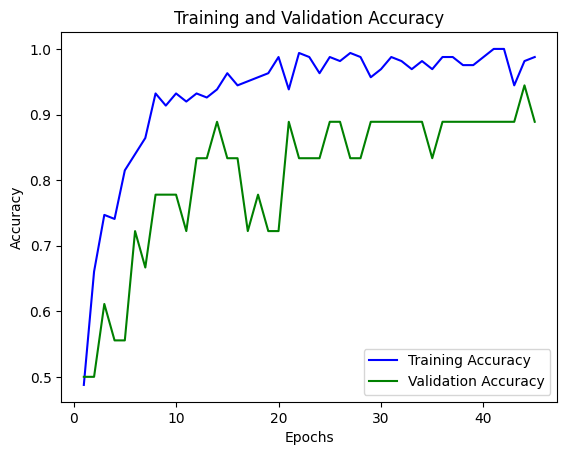


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1553 - accuracy: 0.9500
Score for fold 1: loss of 0.15525096654891968; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 100ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.948849104859335
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.155
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.885%
------------------------------------------------------------------------
Average scores for all folds:
> Loss: 0.15525096654891968
> Accuracy: 94.9999988079071 (+- 0.0)
> AUC: 1.0
> F1: 0.948849104859335
------------------------------------------------------------------------
Event Pair: hand vs sub
Highest AUC Score: 1.0
Highest F1 Score: 1.0
Highest Accuracy Score: 1.0
Best kl value: 8
Best 

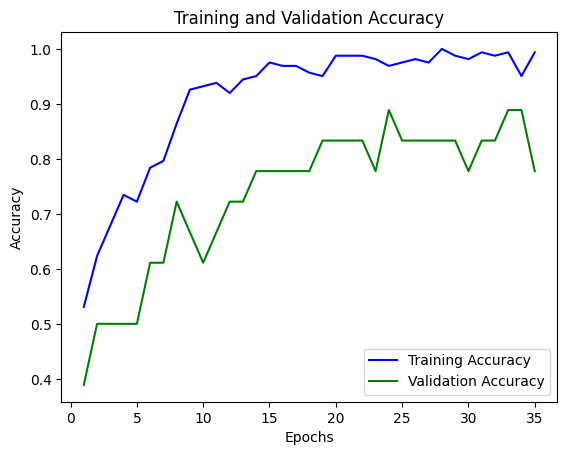


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1486 - accuracy: 0.9500
Score for fold 2: loss of 0.1485747992992401; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 111ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.9430199430199431
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.155
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.149
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.302%
------------------------------------------------------------------------
Average scores for all folds:
> Loss: 0.1519128829240799
> Accuracy: 94.9999988079071 (+- 0.0)
> AUC: 1.0
> F1: 0.9459345239396391
--------------

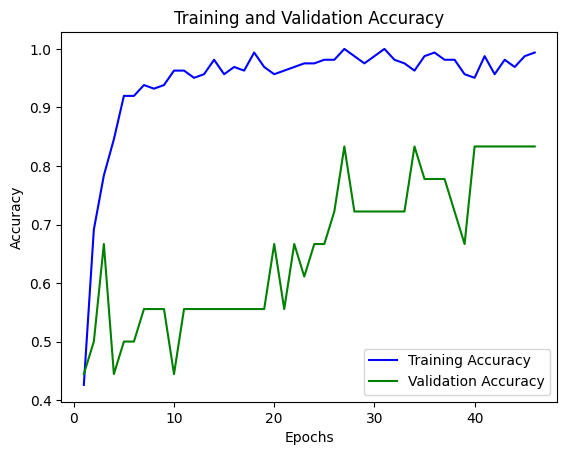


# Evaluate on test data
20/20 [==============================] - 0s 3ms/step - loss: 0.6125 - accuracy: 0.7500
Score for fold 3: loss of 0.612544596195221; accuracy of 75.0%
1/1 [==============================] - 0s 121ms/step
AUC Accuracy Score Per Fold: 0.8901098901098901
F1 Score Per Fold:  0.7493734335839599
Accuracy Per Fold:  0.75
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.155
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.149
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.302%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.613
>          - Accuracy: 75.000%
>          - AUC 89.011%
>          - F1: 74.937%
---------------------------------------

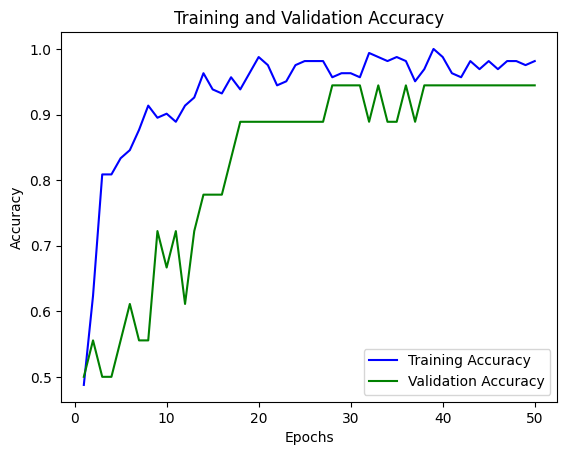


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0992 - accuracy: 1.0000
Score for fold 4: loss of 0.09919796884059906; accuracy of 100.0%
1/1 [==============================] - 0s 107ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.155
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.149
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.302%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.613
>          - Accuracy: 75.000%
>          - AUC 89.011%
>          - F1: 74.937%
-------------------------------------------------------------------

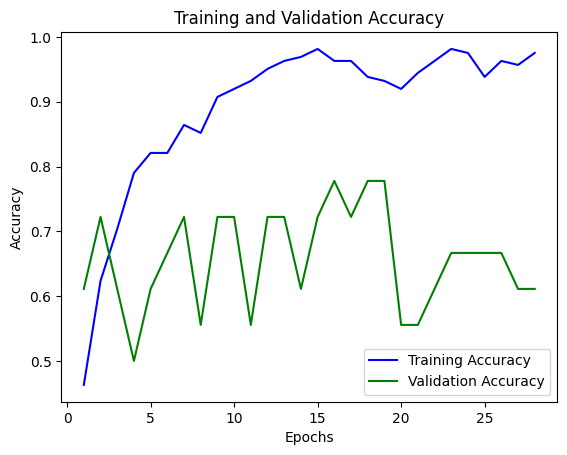


# Evaluate on test data
20/20 [==============================] - 0s 3ms/step - loss: 0.2428 - accuracy: 0.9000
Score for fold 5: loss of 0.2427564412355423; accuracy of 89.99999761581421%
1/1 [==============================] - 0s 106ms/step
AUC Accuracy Score Per Fold: 0.9560439560439561
F1 Score Per Fold:  0.8958333333333334
Accuracy Per Fold:  0.9
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.155
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.149
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.302%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.613
>          - Accuracy: 75.000%
>          - AUC 89.011%
>          - F1: 74.937%
--------------------------

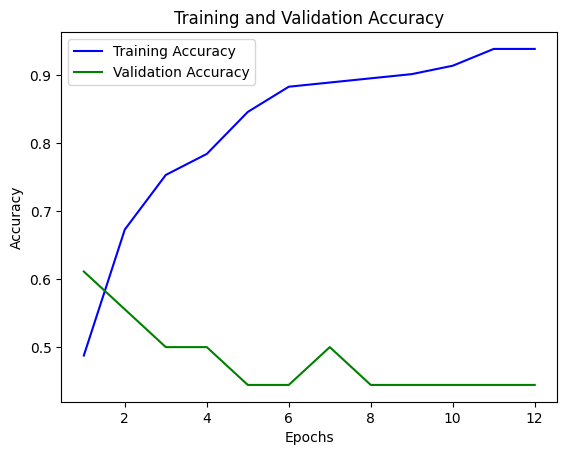


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.5380 - accuracy: 0.6500
Score for fold 6: loss of 0.5379743576049805; accuracy of 64.99999761581421%
1/1 [==============================] - 0s 102ms/step
AUC Accuracy Score Per Fold: 0.8131868131868132
F1 Score Per Fold:  0.6266666666666666
Accuracy Per Fold:  0.65
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.155
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.149
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.302%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.613
>          - Accuracy: 75.000%
>          - AUC 89.011%
>          - F1: 74.937%
-------------------------

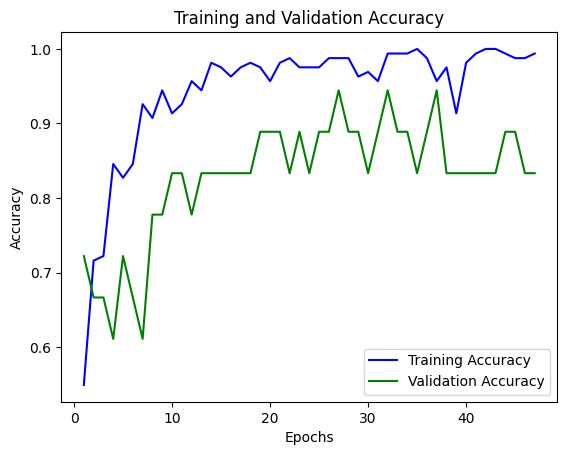


# Evaluate on test data
20/20 [==============================] - 0s 3ms/step - loss: 0.1560 - accuracy: 0.9500
Score for fold 7: loss of 0.15597966313362122; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 109ms/step
AUC Accuracy Score Per Fold: 0.9780219780219781
F1 Score Per Fold:  0.9430199430199431
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.155
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.149
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.302%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.613
>          - Accuracy: 75.000%
>          - AUC 89.011%
>          - F1: 74.937%
-------------------------

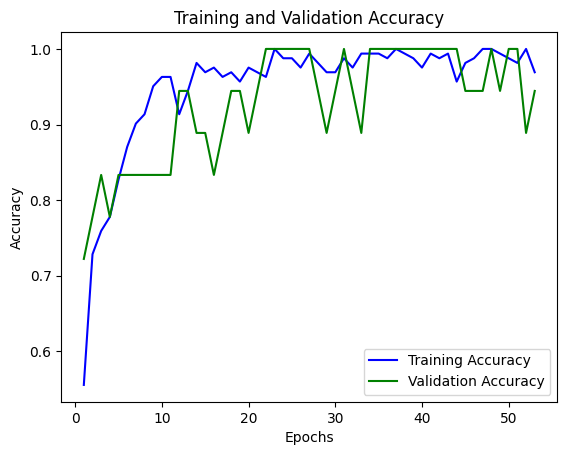


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.3234 - accuracy: 0.8500
Score for fold 8: loss of 0.32341495156288147; accuracy of 85.00000238418579%
1/1 [==============================] - 0s 102ms/step
AUC Accuracy Score Per Fold: 0.9494949494949495
F1 Score Per Fold:  0.8465473145780051
Accuracy Per Fold:  0.85
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.155
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.149
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.302%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.613
>          - Accuracy: 75.000%
>          - AUC 89.011%
>          - F1: 74.937%
------------------------

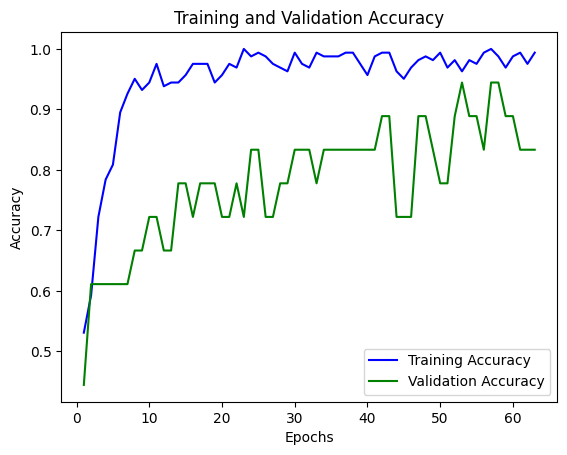


# Evaluate on test data
20/20 [==============================] - 0s 5ms/step - loss: 0.4278 - accuracy: 0.7500
Score for fold 9: loss of 0.4278453290462494; accuracy of 75.0%
1/1 [==============================] - 0s 137ms/step
AUC Accuracy Score Per Fold: 0.9761904761904763
F1 Score Per Fold:  0.7442455242966752
Accuracy Per Fold:  0.75
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.155
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.149
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.302%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.613
>          - Accuracy: 75.000%
>          - AUC 89.011%
>          - F1: 74.937%
--------------------------------------

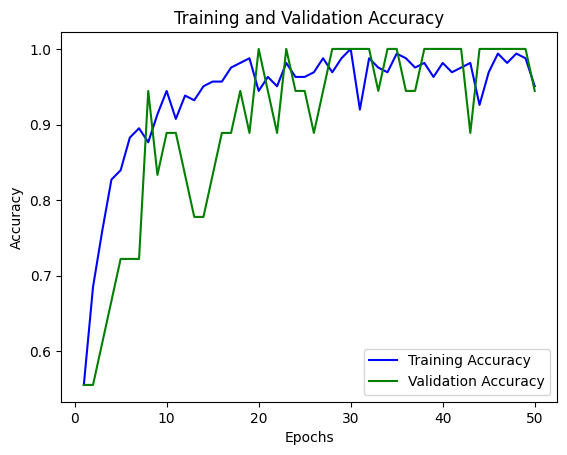


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.3522 - accuracy: 0.8000
Score for fold 10: loss of 0.35217610001564026; accuracy of 80.0000011920929%
1/1 [==============================] - 0s 115ms/step
AUC Accuracy Score Per Fold: 0.901098901098901
F1 Score Per Fold:  0.7916666666666666
Accuracy Per Fold:  0.8
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.155
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.149
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.302%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.613
>          - Accuracy: 75.000%
>          - AUC 89.011%
>          - F1: 74.937%
--------------------------

<ipython-input-15-56b6b828fbcc>:250: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'Fold Number': list(range(1, fold_counter)),


    Event Pair  Highest AUC Score  Highest Accuracy  Highest F1 Score  \
0  hand vs sub                1.0              0.95          0.948849   
1  hand vs sub                1.0              1.00          1.000000   
2  hand vs sub                1.0              1.00          1.000000   
3  hand vs sub                1.0              1.00          1.000000   
4  hand vs sub                1.0              1.00          1.000000   

  Average ROC AUC Average Accuracy Average F1 Score kl    d  \
0             NaN              NaN              NaN  8  0.1   
1             NaN              NaN              NaN  8  0.1   
2             NaN              NaN              NaN  8  0.1   
3             NaN              NaN              NaN  8  0.1   
4             NaN              NaN              NaN  8  0.1   

                       Fold Number  \
0  [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]   
1  [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]   
2  [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]   
3  [1, 2, 3, 4, 5, 6, 7, 8, 9,

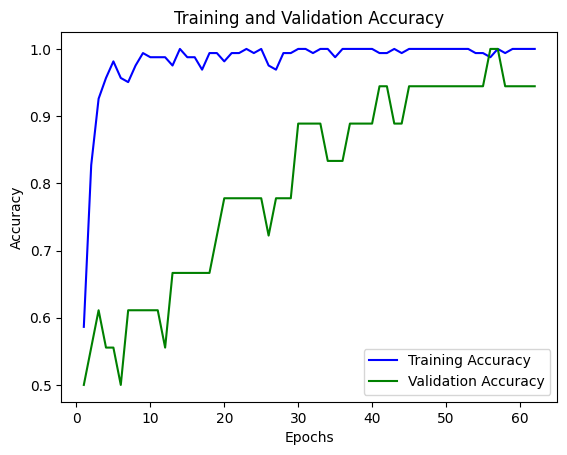


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0715 - accuracy: 0.9500
Score for fold 1: loss of 0.07145169377326965; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 217ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.948849104859335
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.071
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.885%
------------------------------------------------------------------------
Average scores for all folds:
> Loss: 0.07145169377326965
> Accuracy: 94.9999988079071 (+- 0.0)
> AUC: 1.0
> F1: 0.948849104859335
------------------------------------------------------------------------
Event Pair: hand vs sub
Highest AUC Score: 1.0
Highest F1 Score: 1.0
Highest Accuracy Score: 1.0
Best kl value: 8
Best 

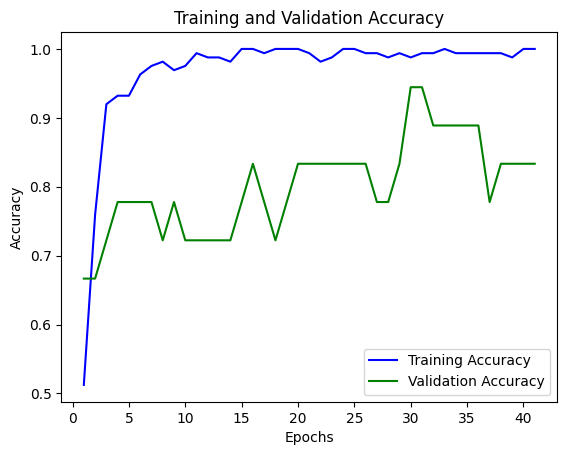


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1030 - accuracy: 1.0000
Score for fold 2: loss of 0.10304971039295197; accuracy of 100.0%
1/1 [==============================] - 0s 108ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.071
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.103
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
Average scores for all folds:
> Loss: 0.08725070208311081
> Accuracy: 97.49999940395355 (+- 2.5000005960464478)
> AUC: 1.0
> F1: 0.9744245524296675
---------------------

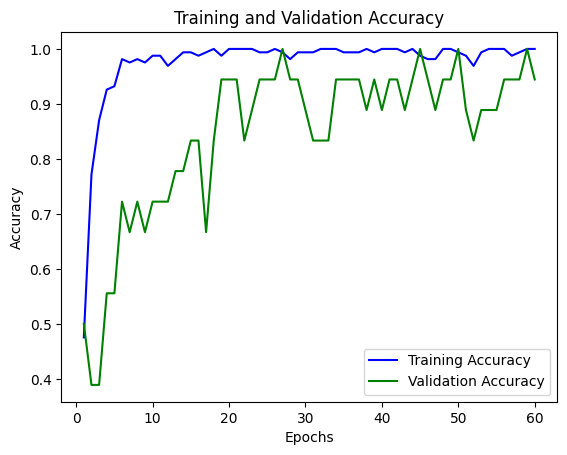


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1717 - accuracy: 0.9000
Score for fold 3: loss of 0.17173916101455688; accuracy of 89.99999761581421%
1/1 [==============================] - 0s 110ms/step
AUC Accuracy Score Per Fold: 0.989010989010989
F1 Score Per Fold:  0.8901098901098901
Accuracy Per Fold:  0.9
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.071
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.103
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.172
>          - Accuracy: 90.000%
>          - AUC 98.901%
>          - F1: 89.011%
------------------------

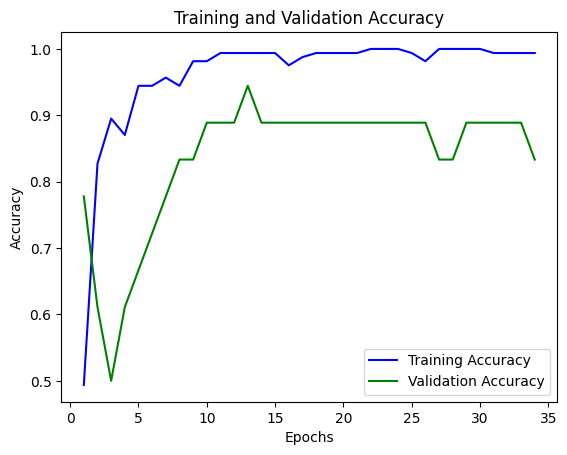


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.2142 - accuracy: 0.9000
Score for fold 4: loss of 0.21419966220855713; accuracy of 89.99999761581421%
1/1 [==============================] - 0s 108ms/step
AUC Accuracy Score Per Fold: 0.9880952380952381
F1 Score Per Fold:  0.8901098901098901
Accuracy Per Fold:  0.9
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.071
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.103
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.172
>          - Accuracy: 90.000%
>          - AUC 98.901%
>          - F1: 89.011%
-----------------------

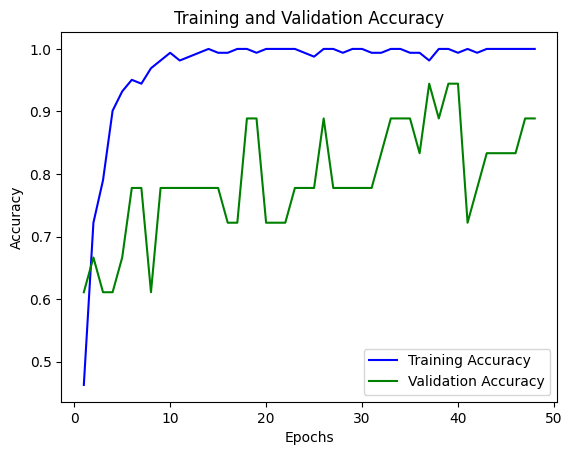


# Evaluate on test data
20/20 [==============================] - 0s 5ms/step - loss: 0.1803 - accuracy: 0.9500
Score for fold 5: loss of 0.180315300822258; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 108ms/step
AUC Accuracy Score Per Fold: 0.9780219780219781
F1 Score Per Fold:  0.9466666666666668
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.071
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.103
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.172
>          - Accuracy: 90.000%
>          - AUC 98.901%
>          - F1: 89.011%
-------------------------

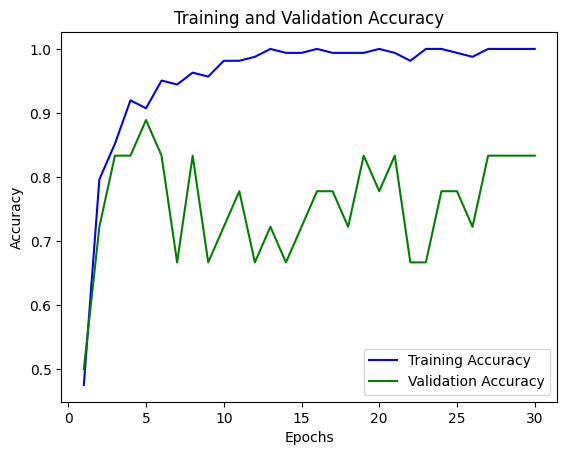


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1919 - accuracy: 0.9000
Score for fold 6: loss of 0.19186371564865112; accuracy of 89.99999761581421%
1/1 [==============================] - 0s 116ms/step
AUC Accuracy Score Per Fold: 0.9780219780219781
F1 Score Per Fold:  0.8901098901098901
Accuracy Per Fold:  0.9
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.071
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.103
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.172
>          - Accuracy: 90.000%
>          - AUC 98.901%
>          - F1: 89.011%
-----------------------

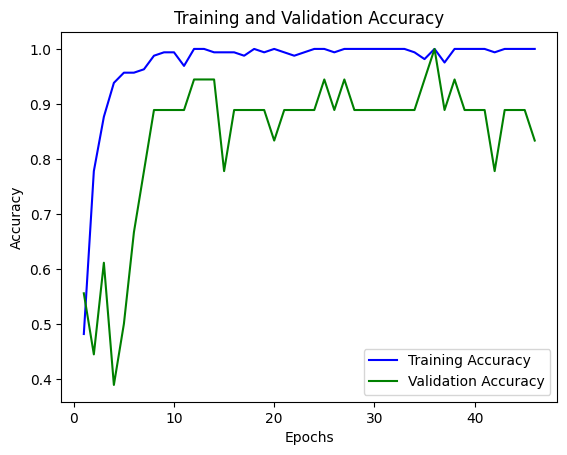


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.2030 - accuracy: 0.9500
Score for fold 7: loss of 0.2030140906572342; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 118ms/step
AUC Accuracy Score Per Fold: 0.956043956043956
F1 Score Per Fold:  0.9430199430199431
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.071
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.103
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.172
>          - Accuracy: 90.000%
>          - AUC 98.901%
>          - F1: 89.011%
-------------------------

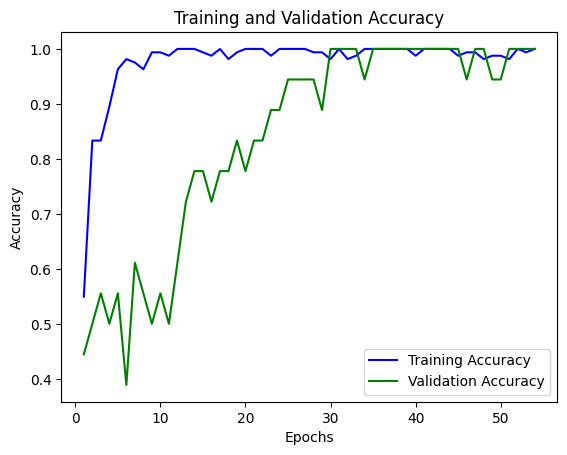


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1851 - accuracy: 0.9500
Score for fold 8: loss of 0.18509168922901154; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 113ms/step
AUC Accuracy Score Per Fold: 0.9898989898989898
F1 Score Per Fold:  0.948849104859335
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.071
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.103
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.172
>          - Accuracy: 90.000%
>          - AUC 98.901%
>          - F1: 89.011%
------------------------

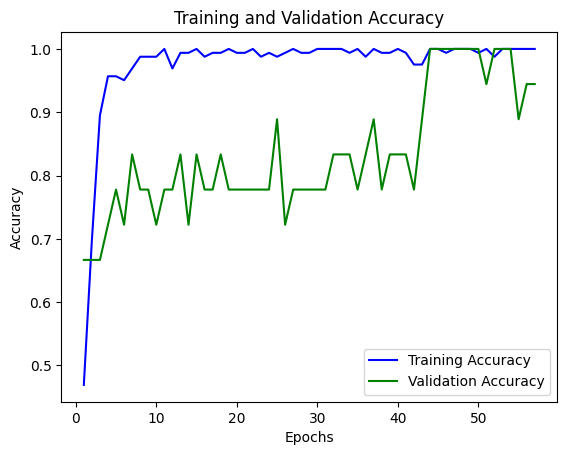


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1250 - accuracy: 0.9500
Score for fold 9: loss of 0.12504413723945618; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 106ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.9430199430199431
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.071
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.103
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.172
>          - Accuracy: 90.000%
>          - AUC 98.901%
>          - F1: 89.011%
--------------------------------------

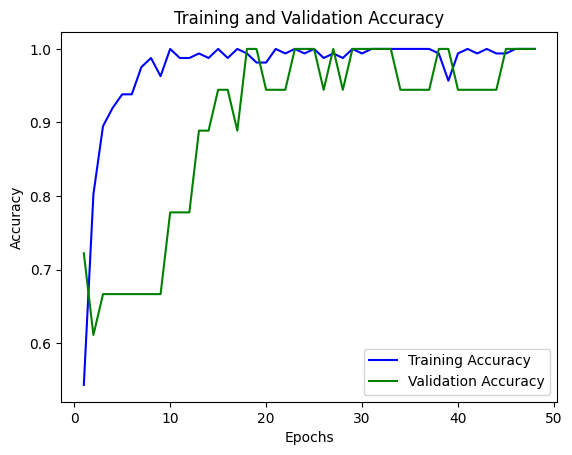


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0836 - accuracy: 1.0000
Score for fold 10: loss of 0.08362136036157608; accuracy of 100.0%
1/1 [==============================] - 0s 105ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.071
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.103
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.172
>          - Accuracy: 90.000%
>          - AUC 98.901%
>          - F1: 89.011%
----------------------------------------------------------------

<ipython-input-15-56b6b828fbcc>:250: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'Fold Number': list(range(1, fold_counter)),


    Event Pair  Highest AUC Score  Highest Accuracy  Highest F1 Score  \
0  hand vs sub                1.0              0.95          0.948849   
1  hand vs sub                1.0              1.00          1.000000   
2  hand vs sub                1.0              1.00          1.000000   
3  hand vs sub                1.0              1.00          1.000000   
4  hand vs sub                1.0              1.00          1.000000   
5  hand vs sub                1.0              1.00          1.000000   

  Average ROC AUC Average Accuracy Average F1 Score kl    d  \
0             NaN              NaN              NaN  8  0.1   
1             NaN              NaN              NaN  8  0.1   
2             NaN              NaN              NaN  8  0.1   
3             NaN              NaN              NaN  8  0.1   
4             NaN              NaN              NaN  8  0.1   
5             NaN              NaN              NaN  8  0.1   

                       Fold Number  \
0  [1, 2

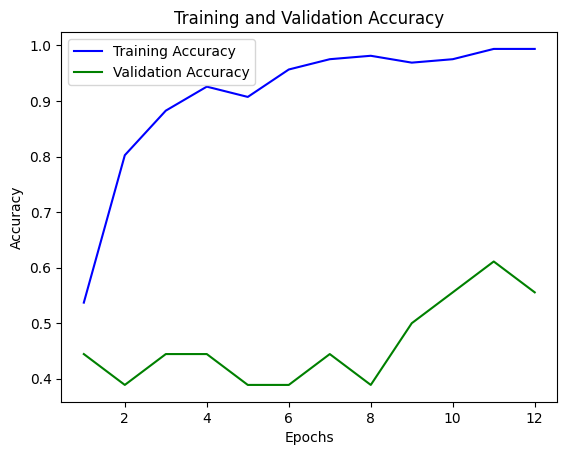


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.4428 - accuracy: 0.8500
Score for fold 1: loss of 0.4427965581417084; accuracy of 85.00000238418579%
1/1 [==============================] - 0s 107ms/step
AUC Accuracy Score Per Fold: 0.90625
F1 Score Per Fold:  0.8399999999999999
Accuracy Per Fold:  0.85
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.443
>          - Accuracy: 85.000%
>          - AUC 90.625%
>          - F1: 84.000%
------------------------------------------------------------------------
Average scores for all folds:
> Loss: 0.4427965581417084
> Accuracy: 85.00000238418579 (+- 0.0)
> AUC: 0.90625
> F1: 0.8399999999999999
------------------------------------------------------------------------
Event Pair: hand vs sub
Highest AUC Score: 1.0
Highest F1 Score: 1.0
Highest Accuracy Score: 1.0
Best kl value

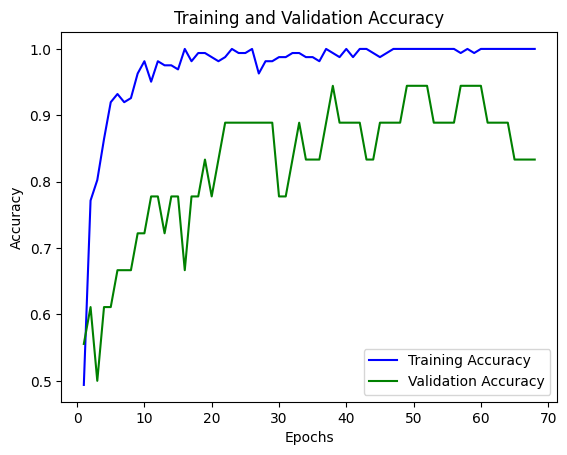


# Evaluate on test data
20/20 [==============================] - 0s 5ms/step - loss: 0.0536 - accuracy: 1.0000
Score for fold 2: loss of 0.053622908890247345; accuracy of 100.0%
1/1 [==============================] - 0s 107ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.443
>          - Accuracy: 85.000%
>          - AUC 90.625%
>          - F1: 84.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.054
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
Average scores for all folds:
> Loss: 0.24820973351597786
> Accuracy: 92.5000011920929 (+- 7.4999988079071045)
> AUC: 0.953125
> F1: 0.9199999999999999
-----------------

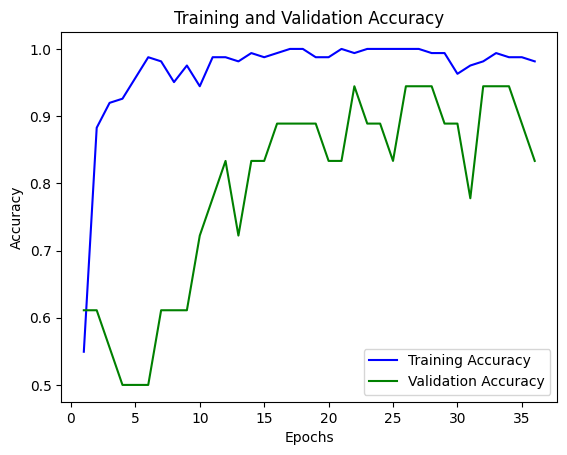


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.7456 - accuracy: 0.6500
Score for fold 3: loss of 0.7456251382827759; accuracy of 64.99999761581421%
1/1 [==============================] - 0s 109ms/step
AUC Accuracy Score Per Fold: 0.8901098901098901
F1 Score Per Fold:  0.6491228070175439
Accuracy Per Fold:  0.65
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.443
>          - Accuracy: 85.000%
>          - AUC 90.625%
>          - F1: 84.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.054
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.746
>          - Accuracy: 65.000%
>          - AUC 89.011%
>          - F1: 64.912%
------------------------

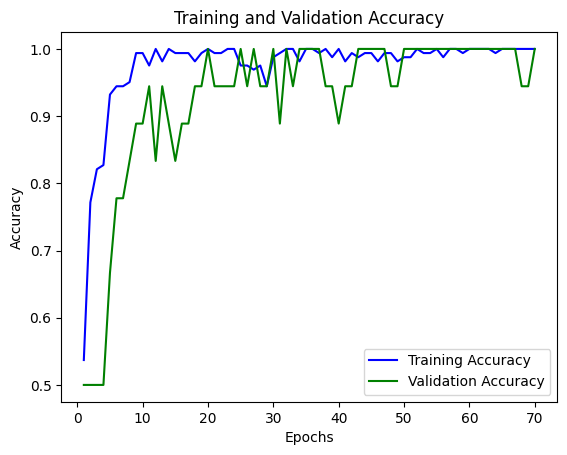


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0270 - accuracy: 1.0000
Score for fold 4: loss of 0.026992356404662132; accuracy of 100.0%
1/1 [==============================] - 0s 102ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.443
>          - Accuracy: 85.000%
>          - AUC 90.625%
>          - F1: 84.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.054
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.746
>          - Accuracy: 65.000%
>          - AUC 89.011%
>          - F1: 64.912%
-----------------------------------------------------------------

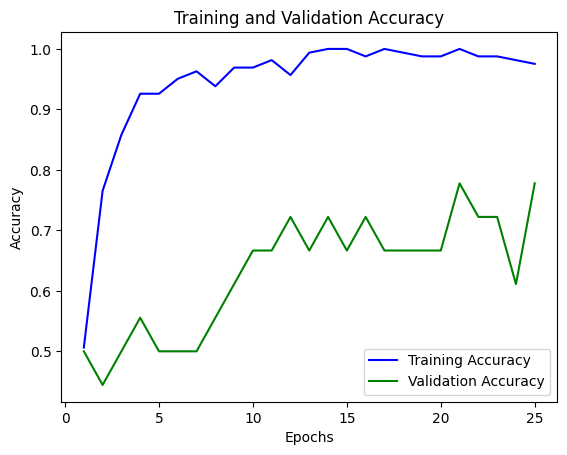


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.4145 - accuracy: 0.8500
Score for fold 5: loss of 0.41449373960494995; accuracy of 85.00000238418579%
1/1 [==============================] - 0s 133ms/step
AUC Accuracy Score Per Fold: 0.9560439560439561
F1 Score Per Fold:  0.8465473145780051
Accuracy Per Fold:  0.85
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.443
>          - Accuracy: 85.000%
>          - AUC 90.625%
>          - F1: 84.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.054
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.746
>          - Accuracy: 65.000%
>          - AUC 89.011%
>          - F1: 64.912%
-----------------------

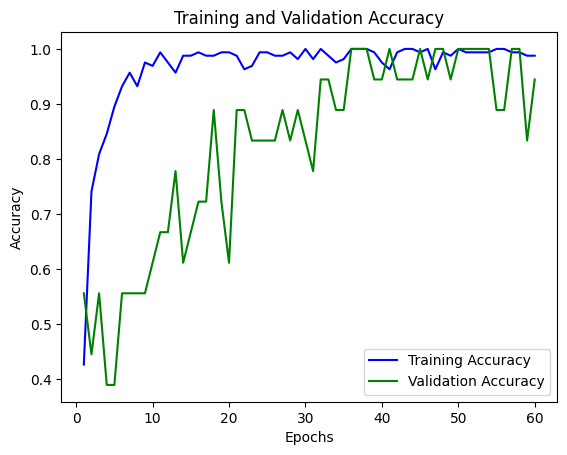


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.2084 - accuracy: 0.9000
Score for fold 6: loss of 0.2084367722272873; accuracy of 89.99999761581421%
1/1 [==============================] - 0s 115ms/step
AUC Accuracy Score Per Fold: 0.9780219780219781
F1 Score Per Fold:  0.8958333333333334
Accuracy Per Fold:  0.9
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.443
>          - Accuracy: 85.000%
>          - AUC 90.625%
>          - F1: 84.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.054
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.746
>          - Accuracy: 65.000%
>          - AUC 89.011%
>          - F1: 64.912%
-------------------------

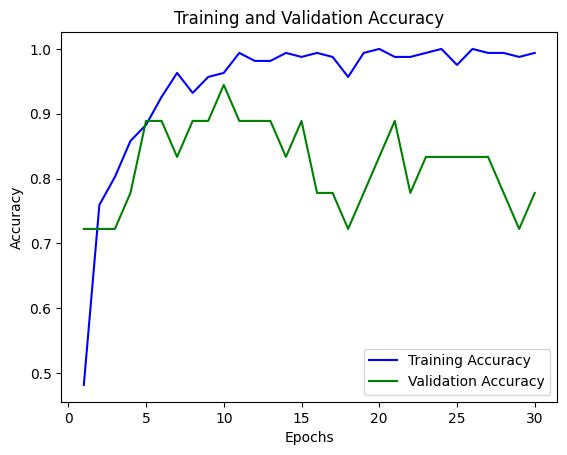


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.2026 - accuracy: 0.9500
Score for fold 7: loss of 0.20258596539497375; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 107ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.9430199430199431
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.443
>          - Accuracy: 85.000%
>          - AUC 90.625%
>          - F1: 84.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.054
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.746
>          - Accuracy: 65.000%
>          - AUC 89.011%
>          - F1: 64.912%
---------------------------------------

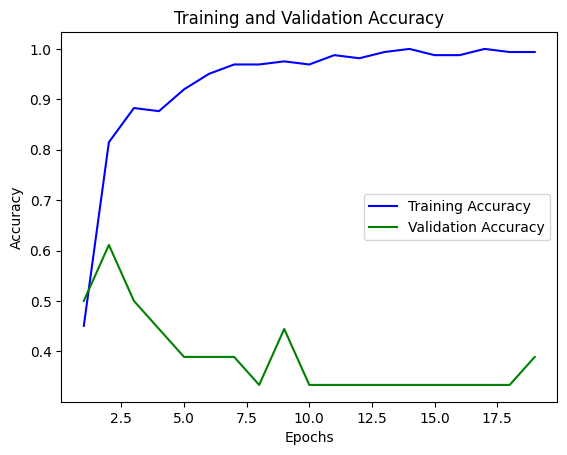


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.7895 - accuracy: 0.6000
Score for fold 8: loss of 0.7895426750183105; accuracy of 60.00000238418579%
1/1 [==============================] - 0s 130ms/step
AUC Accuracy Score Per Fold: 0.797979797979798
F1 Score Per Fold:  0.4666666666666667
Accuracy Per Fold:  0.6
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.443
>          - Accuracy: 85.000%
>          - AUC 90.625%
>          - F1: 84.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.054
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.746
>          - Accuracy: 65.000%
>          - AUC 89.011%
>          - F1: 64.912%
--------------------------

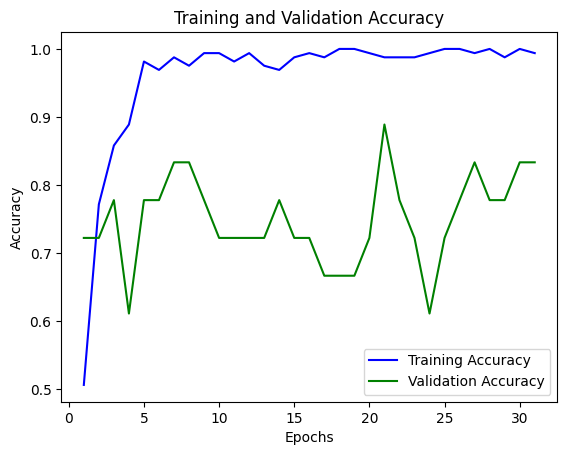


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.4881 - accuracy: 0.8000
Score for fold 9: loss of 0.4881133437156677; accuracy of 80.0000011920929%
1/1 [==============================] - 0s 106ms/step
AUC Accuracy Score Per Fold: 0.9761904761904763
F1 Score Per Fold:  0.7916666666666665
Accuracy Per Fold:  0.8
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.443
>          - Accuracy: 85.000%
>          - AUC 90.625%
>          - F1: 84.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.054
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.746
>          - Accuracy: 65.000%
>          - AUC 89.011%
>          - F1: 64.912%
--------------------------

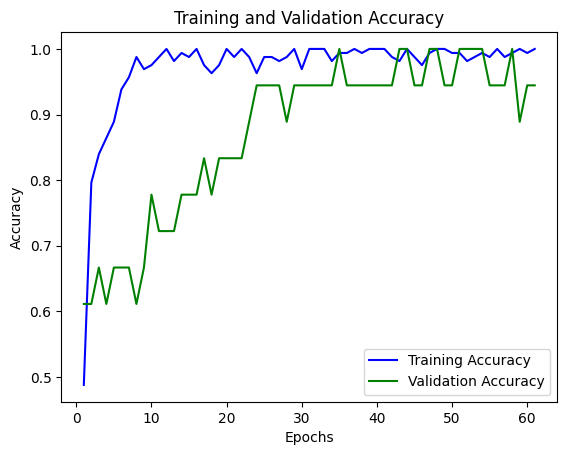


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0499 - accuracy: 1.0000
Score for fold 10: loss of 0.04987253621220589; accuracy of 100.0%
1/1 [==============================] - 0s 106ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.443
>          - Accuracy: 85.000%
>          - AUC 90.625%
>          - F1: 84.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.054
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.746
>          - Accuracy: 65.000%
>          - AUC 89.011%
>          - F1: 64.912%
-----------------------------------------------------------------

<ipython-input-15-56b6b828fbcc>:250: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'Fold Number': list(range(1, fold_counter)),


    Event Pair  Highest AUC Score  Highest Accuracy  Highest F1 Score  \
0  hand vs sub                1.0              0.95          0.948849   
1  hand vs sub                1.0              1.00          1.000000   
2  hand vs sub                1.0              1.00          1.000000   
3  hand vs sub                1.0              1.00          1.000000   
4  hand vs sub                1.0              1.00          1.000000   
5  hand vs sub                1.0              1.00          1.000000   
6  hand vs sub                1.0              1.00          1.000000   

  Average ROC AUC Average Accuracy Average F1 Score kl    d  \
0             NaN              NaN              NaN  8  0.1   
1             NaN              NaN              NaN  8  0.1   
2             NaN              NaN              NaN  8  0.1   
3             NaN              NaN              NaN  8  0.1   
4             NaN              NaN              NaN  8  0.1   
5             NaN              NaN   

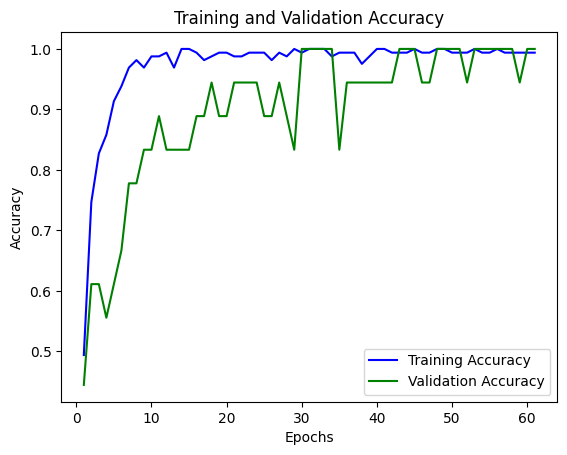


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0380 - accuracy: 1.0000
Score for fold 1: loss of 0.03795252740383148; accuracy of 100.0%
1/1 [==============================] - 0s 103ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.038
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
Average scores for all folds:
> Loss: 0.03795252740383148
> Accuracy: 100.0 (+- 0.0)
> AUC: 1.0
> F1: 1.0
------------------------------------------------------------------------
Event Pair: hand vs sub
Highest AUC Score: 1.0
Highest F1 Score: 1.0
Highest Accuracy Score: 1.0
Best kl value: 8
Best d value: 0.1
>Train: 0=180, 1=180, Test: 0=20, 1=

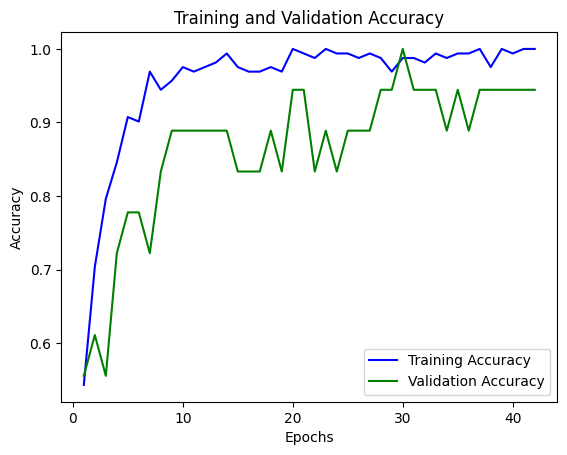


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0852 - accuracy: 1.0000
Score for fold 2: loss of 0.08522620052099228; accuracy of 100.0%
1/1 [==============================] - 0s 103ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.038
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.085
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
Average scores for all folds:
> Loss: 0.06158936396241188
> Accuracy: 100.0 (+- 0.0)
> AUC: 1.0
> F1: 1.0
-------------------------------------------------------------

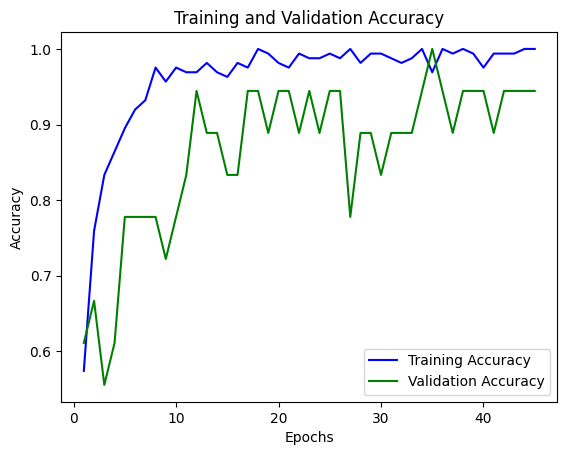


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.3248 - accuracy: 0.8000
Score for fold 3: loss of 0.32484087347984314; accuracy of 80.0000011920929%
1/1 [==============================] - 0s 133ms/step
AUC Accuracy Score Per Fold: 0.945054945054945
F1 Score Per Fold:  0.7916666666666666
Accuracy Per Fold:  0.8
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.038
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.085
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.325
>          - Accuracy: 80.000%
>          - AUC 94.505%
>          - F1: 79.167%
-----------------------

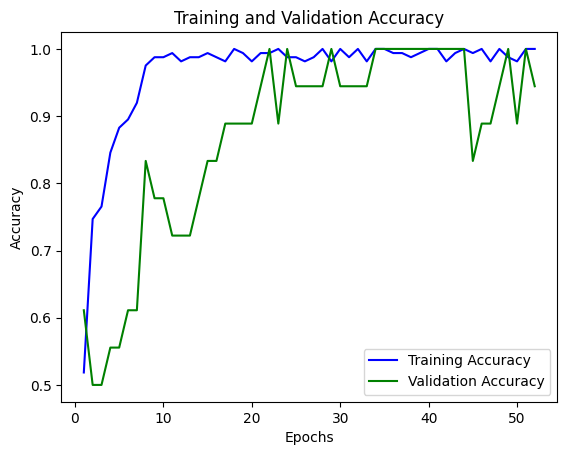


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0637 - accuracy: 1.0000
Score for fold 4: loss of 0.06367313116788864; accuracy of 100.0%
1/1 [==============================] - 0s 114ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.038
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.085
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.325
>          - Accuracy: 80.000%
>          - AUC 94.505%
>          - F1: 79.167%
---------------------------------------------------------------

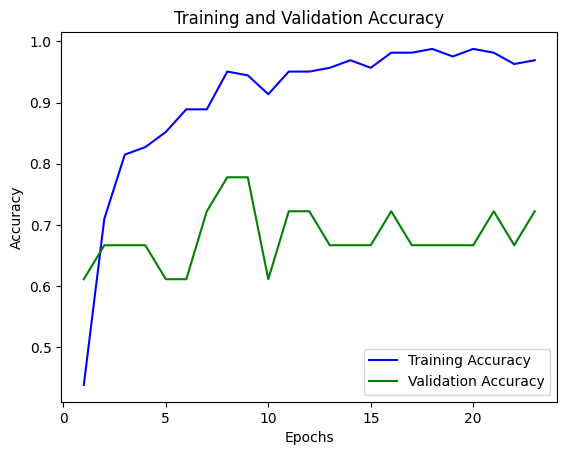


# Evaluate on test data
20/20 [==============================] - 0s 3ms/step - loss: 0.3757 - accuracy: 0.9500
Score for fold 5: loss of 0.3756551146507263; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 117ms/step
AUC Accuracy Score Per Fold: 0.9560439560439561
F1 Score Per Fold:  0.9466666666666668
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.038
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.085
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.325
>          - Accuracy: 80.000%
>          - AUC 94.505%
>          - F1: 79.167%
----------------------

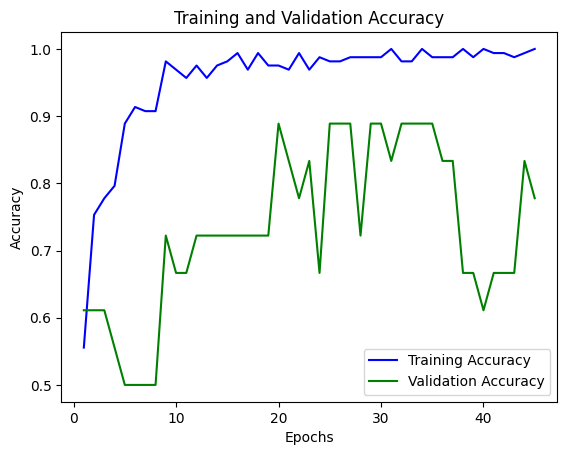


# Evaluate on test data
20/20 [==============================] - 0s 5ms/step - loss: 0.2028 - accuracy: 0.9500
Score for fold 6: loss of 0.20283623039722443; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 111ms/step
AUC Accuracy Score Per Fold: 0.9670329670329669
F1 Score Per Fold:  0.9466666666666668
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.038
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.085
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.325
>          - Accuracy: 80.000%
>          - AUC 94.505%
>          - F1: 79.167%
---------------------

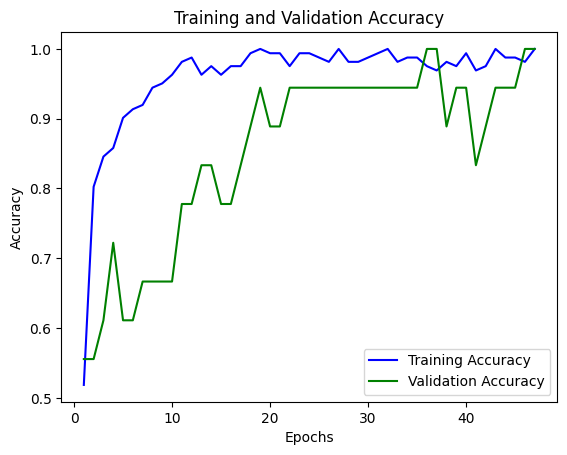


# Evaluate on test data
20/20 [==============================] - 0s 5ms/step - loss: 0.0908 - accuracy: 0.9500
Score for fold 7: loss of 0.09078657627105713; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 109ms/step
AUC Accuracy Score Per Fold: 0.989010989010989
F1 Score Per Fold:  0.9466666666666668
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.038
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.085
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.325
>          - Accuracy: 80.000%
>          - AUC 94.505%
>          - F1: 79.167%
----------------------

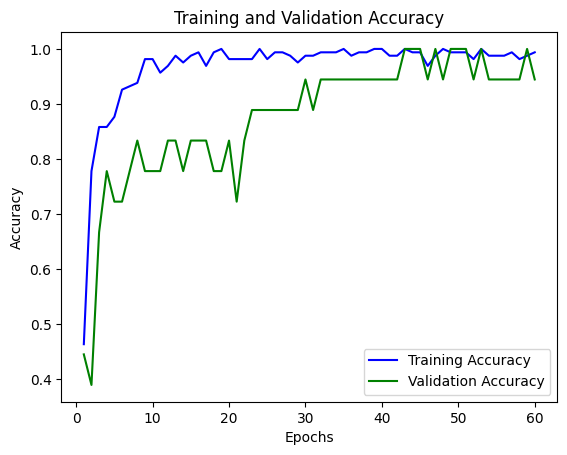


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.2562 - accuracy: 0.8500
Score for fold 8: loss of 0.25617867708206177; accuracy of 85.00000238418579%
1/1 [==============================] - 0s 108ms/step
AUC Accuracy Score Per Fold: 0.9595959595959596
F1 Score Per Fold:  0.8465473145780051
Accuracy Per Fold:  0.85
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.038
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.085
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.325
>          - Accuracy: 80.000%
>          - AUC 94.505%
>          - F1: 79.167%
--------------------

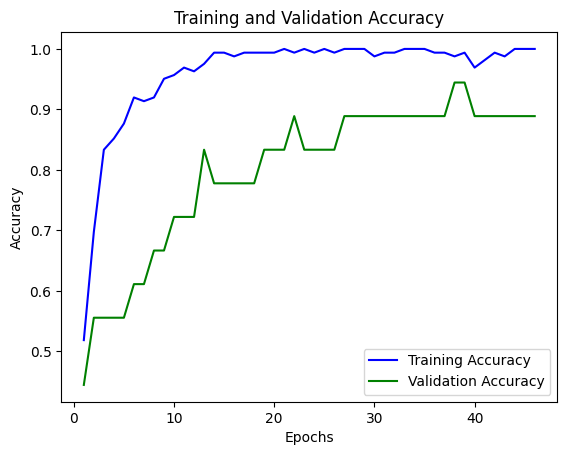


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1412 - accuracy: 0.9500
Score for fold 9: loss of 0.14115753769874573; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 104ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.9430199430199431
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.038
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.085
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.325
>          - Accuracy: 80.000%
>          - AUC 94.505%
>          - F1: 79.167%
------------------------------------

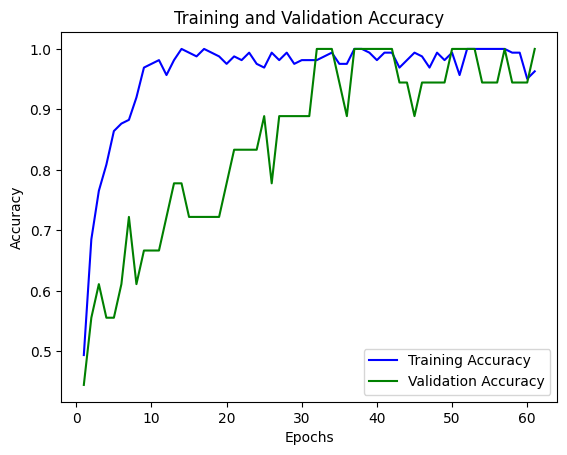


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0677 - accuracy: 1.0000
Score for fold 10: loss of 0.06766059249639511; accuracy of 100.0%
1/1 [==============================] - 0s 107ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.038
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.085
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.325
>          - Accuracy: 80.000%
>          - AUC 94.505%
>          - F1: 79.167%
--------------------------------------------------------------

<ipython-input-15-56b6b828fbcc>:250: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'Fold Number': list(range(1, fold_counter)),


    Event Pair  Highest AUC Score  Highest Accuracy  Highest F1 Score  \
0  hand vs sub                1.0              0.95          0.948849   
1  hand vs sub                1.0              1.00          1.000000   
2  hand vs sub                1.0              1.00          1.000000   
3  hand vs sub                1.0              1.00          1.000000   
4  hand vs sub                1.0              1.00          1.000000   
5  hand vs sub                1.0              1.00          1.000000   
6  hand vs sub                1.0              1.00          1.000000   
7  hand vs sub                1.0              1.00          1.000000   

  Average ROC AUC Average Accuracy Average F1 Score kl    d  \
0             NaN              NaN              NaN  8  0.1   
1             NaN              NaN              NaN  8  0.1   
2             NaN              NaN              NaN  8  0.1   
3             NaN              NaN              NaN  8  0.1   
4             NaN          

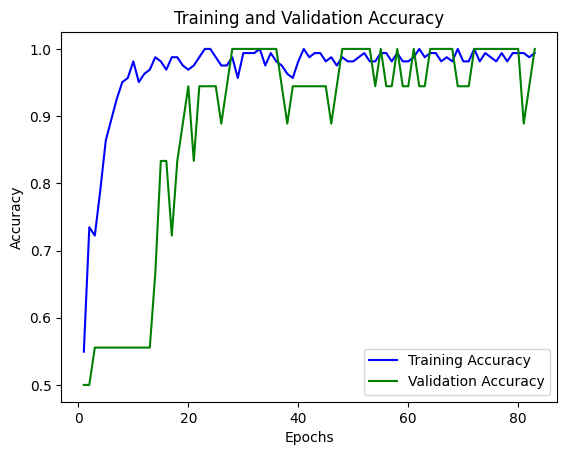


# Evaluate on test data
20/20 [==============================] - 0s 3ms/step - loss: 0.1225 - accuracy: 0.9000
Score for fold 1: loss of 0.12252940982580185; accuracy of 89.99999761581421%
1/1 [==============================] - 0s 125ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.898989898989899
Accuracy Per Fold:  0.9
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.123
>          - Accuracy: 90.000%
>          - AUC 100.000%
>          - F1: 89.899%
------------------------------------------------------------------------
Average scores for all folds:
> Loss: 0.12252940982580185
> Accuracy: 89.99999761581421 (+- 0.0)
> AUC: 1.0
> F1: 0.898989898989899
------------------------------------------------------------------------
Event Pair: hand vs sub
Highest AUC Score: 1.0
Highest F1 Score: 1.0
Highest Accuracy Score: 1.0
Best kl value: 8
Best

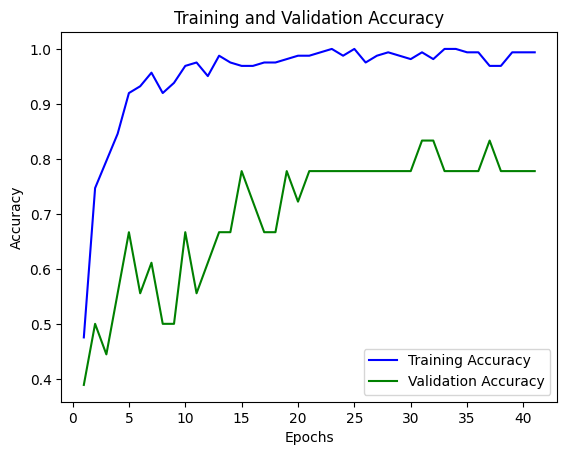


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.2563 - accuracy: 0.8500
Score for fold 2: loss of 0.25625935196876526; accuracy of 85.00000238418579%
1/1 [==============================] - 0s 131ms/step
AUC Accuracy Score Per Fold: 0.9642857142857143
F1 Score Per Fold:  0.829059829059829
Accuracy Per Fold:  0.85
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.123
>          - Accuracy: 90.000%
>          - AUC 100.000%
>          - F1: 89.899%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.256
>          - Accuracy: 85.000%
>          - AUC 96.429%
>          - F1: 82.906%
------------------------------------------------------------------------
Average scores for all folds:
> Loss: 0.18939438089728355
> Accuracy: 87.5 (+- 2.499997615814209)
> AUC: 0.9821428571428572
> F1: 

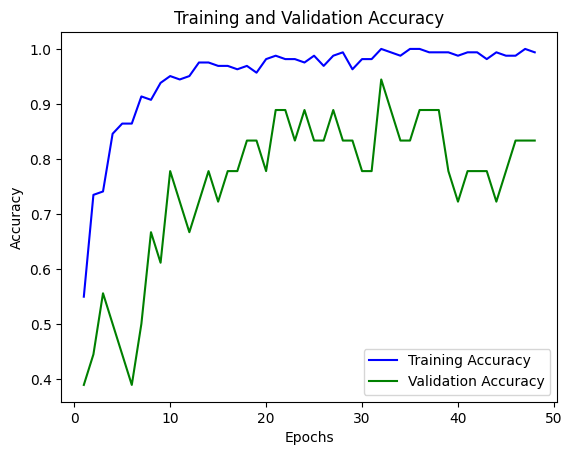


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.4082 - accuracy: 0.7000
Score for fold 3: loss of 0.4082234501838684; accuracy of 69.9999988079071%
1/1 [==============================] - 0s 119ms/step
AUC Accuracy Score Per Fold: 0.9120879120879121
F1 Score Per Fold:  0.6875000000000001
Accuracy Per Fold:  0.7
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.123
>          - Accuracy: 90.000%
>          - AUC 100.000%
>          - F1: 89.899%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.256
>          - Accuracy: 85.000%
>          - AUC 96.429%
>          - F1: 82.906%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.408
>          - Accuracy: 70.000%
>          - AUC 91.209%
>          - F1: 68.750%
----------------------------

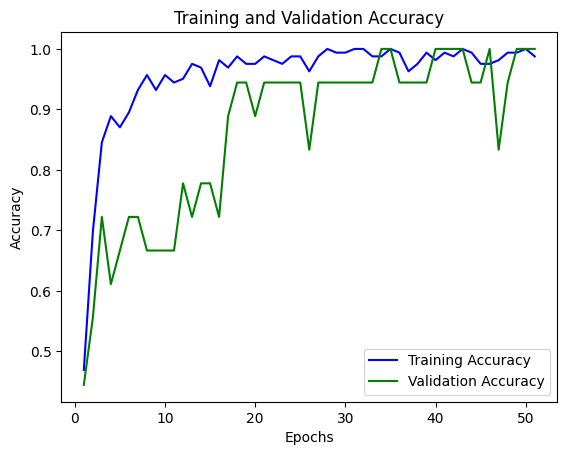


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1149 - accuracy: 0.9500
Score for fold 4: loss of 0.11488739401102066; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 112ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.9430199430199431
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.123
>          - Accuracy: 90.000%
>          - AUC 100.000%
>          - F1: 89.899%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.256
>          - Accuracy: 85.000%
>          - AUC 96.429%
>          - F1: 82.906%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.408
>          - Accuracy: 70.000%
>          - AUC 91.209%
>          - F1: 68.750%
-----------------------------------------

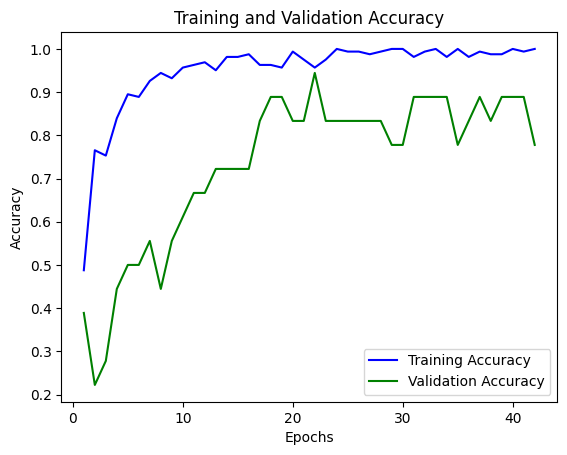


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1916 - accuracy: 0.9500
Score for fold 5: loss of 0.19164490699768066; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 122ms/step
AUC Accuracy Score Per Fold: 0.989010989010989
F1 Score Per Fold:  0.9466666666666668
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.123
>          - Accuracy: 90.000%
>          - AUC 100.000%
>          - F1: 89.899%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.256
>          - Accuracy: 85.000%
>          - AUC 96.429%
>          - F1: 82.906%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.408
>          - Accuracy: 70.000%
>          - AUC 91.209%
>          - F1: 68.750%
---------------------------

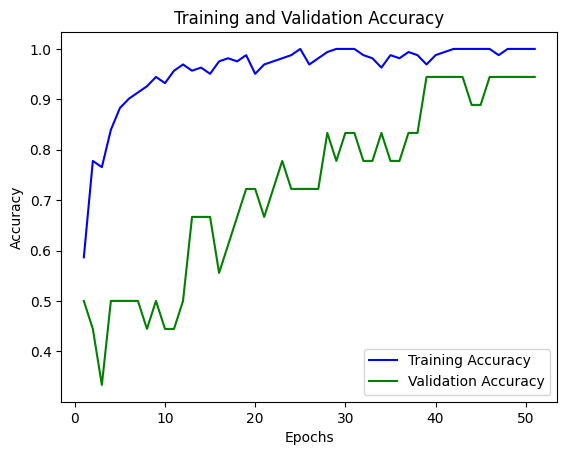


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1666 - accuracy: 0.9500
Score for fold 6: loss of 0.16655822098255157; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 110ms/step
AUC Accuracy Score Per Fold: 0.9780219780219781
F1 Score Per Fold:  0.9466666666666668
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.123
>          - Accuracy: 90.000%
>          - AUC 100.000%
>          - F1: 89.899%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.256
>          - Accuracy: 85.000%
>          - AUC 96.429%
>          - F1: 82.906%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.408
>          - Accuracy: 70.000%
>          - AUC 91.209%
>          - F1: 68.750%
--------------------------

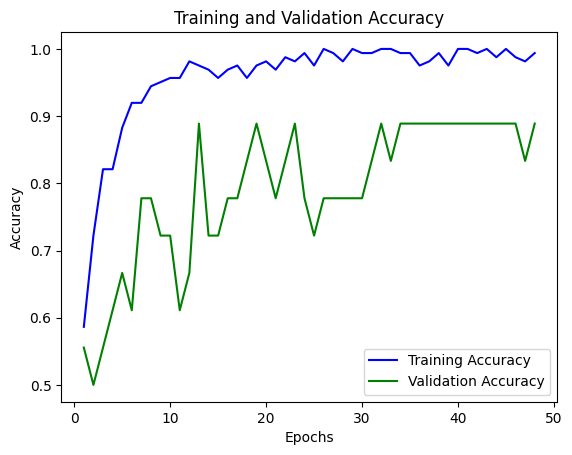


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1915 - accuracy: 0.9500
Score for fold 7: loss of 0.19146819412708282; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 117ms/step
AUC Accuracy Score Per Fold: 0.989010989010989
F1 Score Per Fold:  0.9430199430199431
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.123
>          - Accuracy: 90.000%
>          - AUC 100.000%
>          - F1: 89.899%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.256
>          - Accuracy: 85.000%
>          - AUC 96.429%
>          - F1: 82.906%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.408
>          - Accuracy: 70.000%
>          - AUC 91.209%
>          - F1: 68.750%
---------------------------

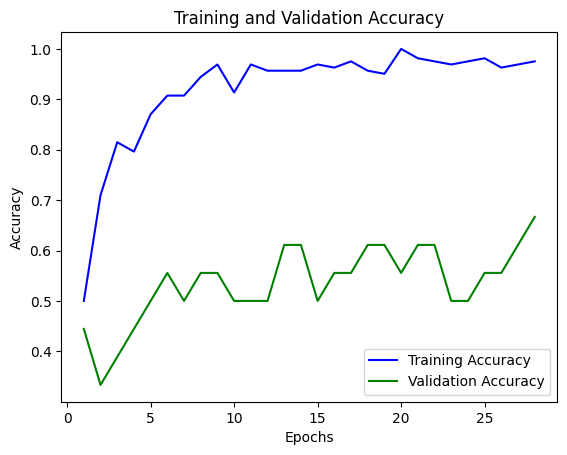


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.8426 - accuracy: 0.7000
Score for fold 8: loss of 0.8426022529602051; accuracy of 69.9999988079071%
1/1 [==============================] - 0s 105ms/step
AUC Accuracy Score Per Fold: 0.797979797979798
F1 Score Per Fold:  0.6428571428571429
Accuracy Per Fold:  0.7
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.123
>          - Accuracy: 90.000%
>          - AUC 100.000%
>          - F1: 89.899%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.256
>          - Accuracy: 85.000%
>          - AUC 96.429%
>          - F1: 82.906%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.408
>          - Accuracy: 70.000%
>          - AUC 91.209%
>          - F1: 68.750%
-----------------------------

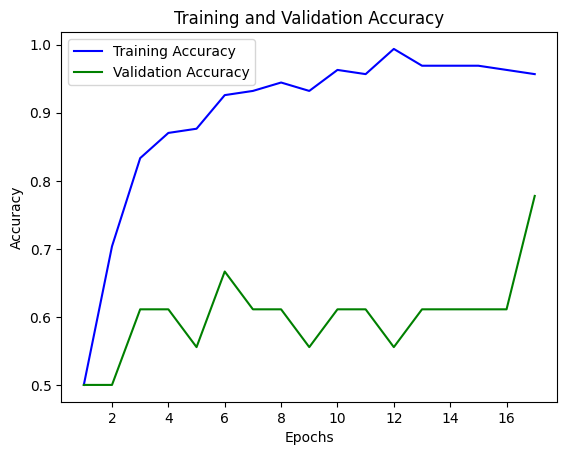


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.3951 - accuracy: 0.7500
Score for fold 9: loss of 0.39514660835266113; accuracy of 75.0%
1/1 [==============================] - 0s 121ms/step
AUC Accuracy Score Per Fold: 0.9761904761904763
F1 Score Per Fold:  0.7442455242966752
Accuracy Per Fold:  0.75
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.123
>          - Accuracy: 90.000%
>          - AUC 100.000%
>          - F1: 89.899%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.256
>          - Accuracy: 85.000%
>          - AUC 96.429%
>          - F1: 82.906%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.408
>          - Accuracy: 70.000%
>          - AUC 91.209%
>          - F1: 68.750%
--------------------------------------

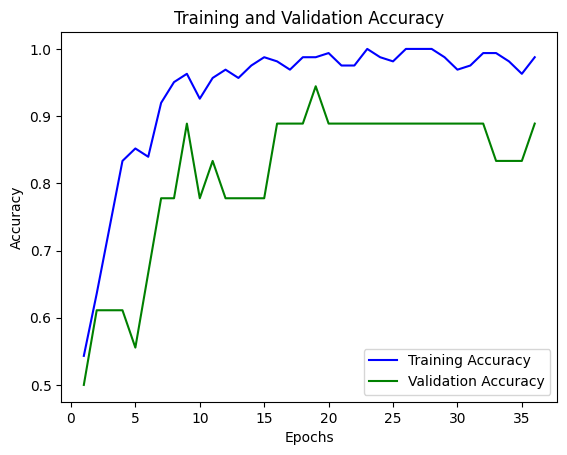


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.2405 - accuracy: 0.9000
Score for fold 10: loss of 0.24045050144195557; accuracy of 89.99999761581421%
1/1 [==============================] - 0s 114ms/step
AUC Accuracy Score Per Fold: 0.9780219780219781
F1 Score Per Fold:  0.8958333333333334
Accuracy Per Fold:  0.9
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.123
>          - Accuracy: 90.000%
>          - AUC 100.000%
>          - F1: 89.899%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.256
>          - Accuracy: 85.000%
>          - AUC 96.429%
>          - F1: 82.906%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.408
>          - Accuracy: 70.000%
>          - AUC 91.209%
>          - F1: 68.750%
-------------------------

<ipython-input-15-56b6b828fbcc>:250: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'Fold Number': list(range(1, fold_counter)),


    Event Pair  Highest AUC Score  Highest Accuracy  Highest F1 Score  \
0  hand vs sub                1.0              0.95          0.948849   
1  hand vs sub                1.0              1.00          1.000000   
2  hand vs sub                1.0              1.00          1.000000   
3  hand vs sub                1.0              1.00          1.000000   
4  hand vs sub                1.0              1.00          1.000000   
5  hand vs sub                1.0              1.00          1.000000   
6  hand vs sub                1.0              1.00          1.000000   
7  hand vs sub                1.0              1.00          1.000000   
8  hand vs sub                1.0              1.00          1.000000   

  Average ROC AUC Average Accuracy Average F1 Score kl    d  \
0             NaN              NaN              NaN  8  0.1   
1             NaN              NaN              NaN  8  0.1   
2             NaN              NaN              NaN  8  0.1   
3             NaN

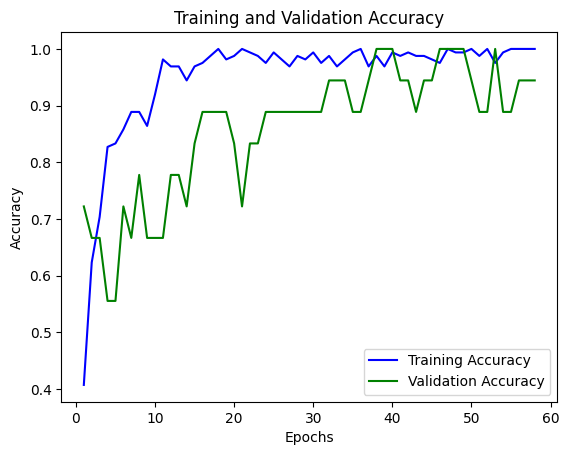


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.2112 - accuracy: 0.9500
Score for fold 1: loss of 0.2112419158220291; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 118ms/step
AUC Accuracy Score Per Fold: 0.9895833333333333
F1 Score Per Fold:  0.948849104859335
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.211
>          - Accuracy: 95.000%
>          - AUC 98.958%
>          - F1: 94.885%
------------------------------------------------------------------------
Average scores for all folds:
> Loss: 0.2112419158220291
> Accuracy: 94.9999988079071 (+- 0.0)
> AUC: 0.9895833333333333
> F1: 0.948849104859335
------------------------------------------------------------------------
Event Pair: hand vs sub
Highest AUC Score: 1.0
Highest F1 Score: 1.0
Highest Accuracy Score:

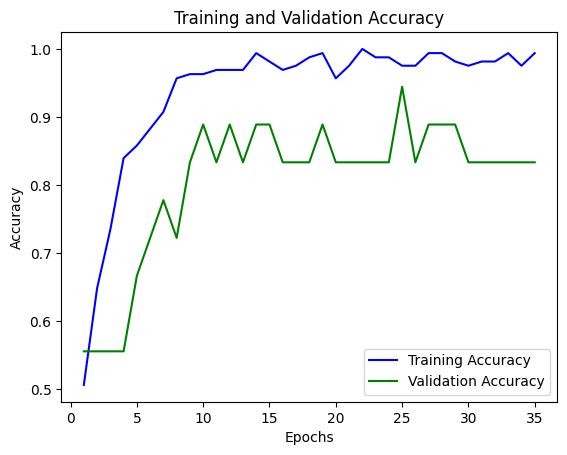


# Evaluate on test data
20/20 [==============================] - 0s 5ms/step - loss: 0.1643 - accuracy: 0.9000
Score for fold 2: loss of 0.16425113379955292; accuracy of 89.99999761581421%
1/1 [==============================] - 0s 110ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.8901098901098901
Accuracy Per Fold:  0.9
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.211
>          - Accuracy: 95.000%
>          - AUC 98.958%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.164
>          - Accuracy: 90.000%
>          - AUC 100.000%
>          - F1: 89.011%
------------------------------------------------------------------------
Average scores for all folds:
> Loss: 0.18774652481079102
> Accuracy: 92.49999821186066 (+- 2.5000005960464478)
> AUC: 0.9947916666666666
> F1: 0

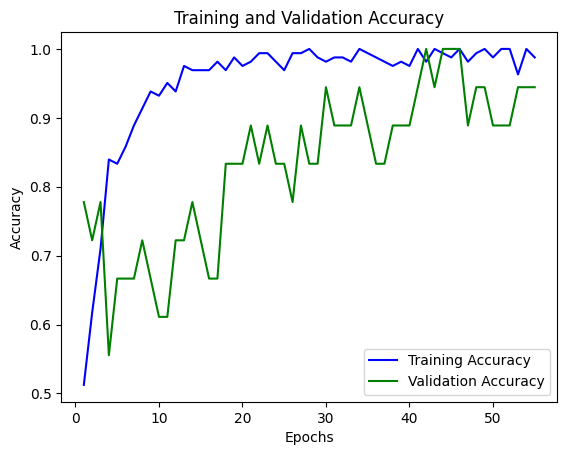


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.2673 - accuracy: 0.9000
Score for fold 3: loss of 0.26731473207473755; accuracy of 89.99999761581421%
1/1 [==============================] - 0s 111ms/step
AUC Accuracy Score Per Fold: 0.945054945054945
F1 Score Per Fold:  0.8901098901098901
Accuracy Per Fold:  0.9
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.211
>          - Accuracy: 95.000%
>          - AUC 98.958%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.164
>          - Accuracy: 90.000%
>          - AUC 100.000%
>          - F1: 89.011%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.267
>          - Accuracy: 90.000%
>          - AUC 94.505%
>          - F1: 89.011%
---------------------------

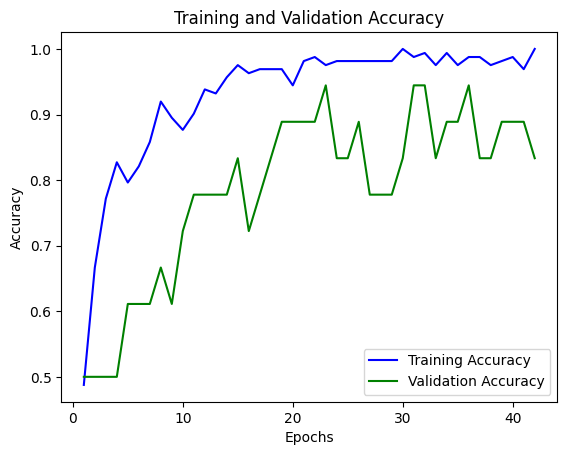


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0989 - accuracy: 1.0000
Score for fold 4: loss of 0.09891004115343094; accuracy of 100.0%
1/1 [==============================] - 0s 135ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.211
>          - Accuracy: 95.000%
>          - AUC 98.958%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.164
>          - Accuracy: 90.000%
>          - AUC 100.000%
>          - F1: 89.011%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.267
>          - Accuracy: 90.000%
>          - AUC 94.505%
>          - F1: 89.011%
--------------------------------------------------------------------

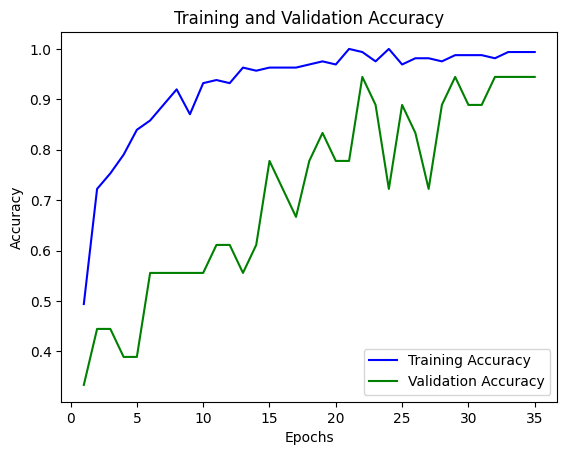


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.3556 - accuracy: 0.8000
Score for fold 5: loss of 0.35558030009269714; accuracy of 80.0000011920929%
1/1 [==============================] - 0s 110ms/step
AUC Accuracy Score Per Fold: 0.9780219780219781
F1 Score Per Fold:  0.797979797979798
Accuracy Per Fold:  0.8
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.211
>          - Accuracy: 95.000%
>          - AUC 98.958%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.164
>          - Accuracy: 90.000%
>          - AUC 100.000%
>          - F1: 89.011%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.267
>          - Accuracy: 90.000%
>          - AUC 94.505%
>          - F1: 89.011%
----------------------------

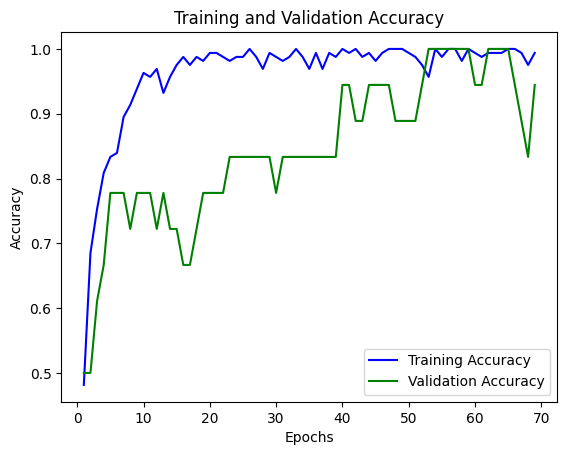


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1895 - accuracy: 0.9000
Score for fold 6: loss of 0.18949928879737854; accuracy of 89.99999761581421%
1/1 [==============================] - 0s 102ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.8958333333333334
Accuracy Per Fold:  0.9
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.211
>          - Accuracy: 95.000%
>          - AUC 98.958%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.164
>          - Accuracy: 90.000%
>          - AUC 100.000%
>          - F1: 89.011%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.267
>          - Accuracy: 90.000%
>          - AUC 94.505%
>          - F1: 89.011%
-----------------------------------------

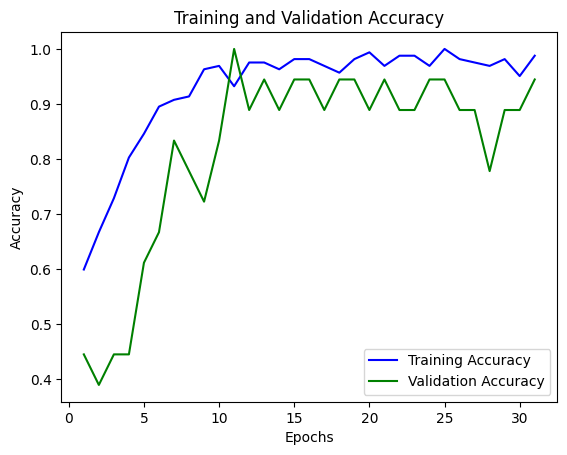


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.2067 - accuracy: 0.9500
Score for fold 7: loss of 0.20669659972190857; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 118ms/step
AUC Accuracy Score Per Fold: 0.9780219780219781
F1 Score Per Fold:  0.9430199430199431
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.211
>          - Accuracy: 95.000%
>          - AUC 98.958%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.164
>          - Accuracy: 90.000%
>          - AUC 100.000%
>          - F1: 89.011%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.267
>          - Accuracy: 90.000%
>          - AUC 94.505%
>          - F1: 89.011%
--------------------------

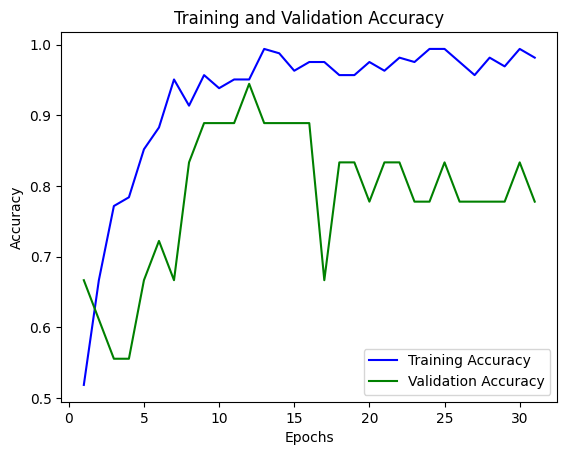


# Evaluate on test data
20/20 [==============================] - 0s 5ms/step - loss: 0.5441 - accuracy: 0.7500
Score for fold 8: loss of 0.544055700302124; accuracy of 75.0%
1/1 [==============================] - 0s 127ms/step
AUC Accuracy Score Per Fold: 0.8181818181818181
F1 Score Per Fold:  0.715099715099715
Accuracy Per Fold:  0.75
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.211
>          - Accuracy: 95.000%
>          - AUC 98.958%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.164
>          - Accuracy: 90.000%
>          - AUC 100.000%
>          - F1: 89.011%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.267
>          - Accuracy: 90.000%
>          - AUC 94.505%
>          - F1: 89.011%
-----------------------------------------

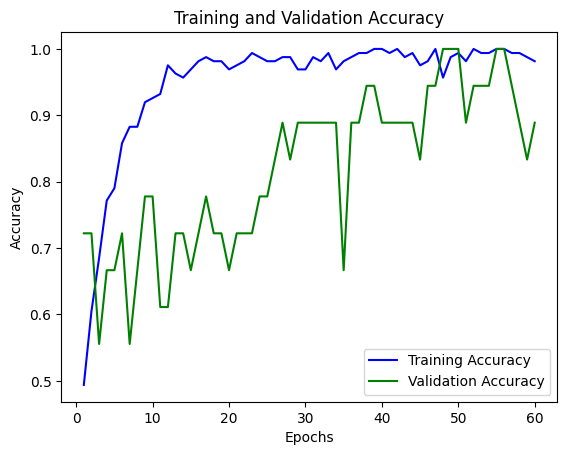


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1556 - accuracy: 0.9500
Score for fold 9: loss of 0.1555911749601364; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 119ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.9430199430199431
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.211
>          - Accuracy: 95.000%
>          - AUC 98.958%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.164
>          - Accuracy: 90.000%
>          - AUC 100.000%
>          - F1: 89.011%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.267
>          - Accuracy: 90.000%
>          - AUC 94.505%
>          - F1: 89.011%
------------------------------------------

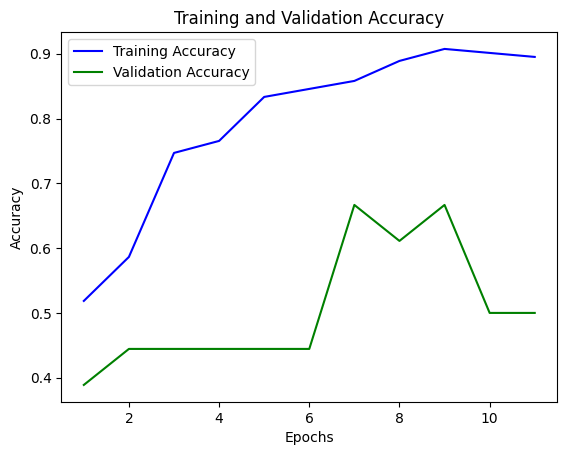


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.6711 - accuracy: 0.6500
Score for fold 10: loss of 0.6710923910140991; accuracy of 64.99999761581421%
1/1 [==============================] - 0s 109ms/step
AUC Accuracy Score Per Fold: 0.6263736263736264
F1 Score Per Fold:  0.6419437340153452
Accuracy Per Fold:  0.65
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.211
>          - Accuracy: 95.000%
>          - AUC 98.958%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.164
>          - Accuracy: 90.000%
>          - AUC 100.000%
>          - F1: 89.011%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.267
>          - Accuracy: 90.000%
>          - AUC 94.505%
>          - F1: 89.011%
-------------------------

<ipython-input-15-56b6b828fbcc>:250: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'Fold Number': list(range(1, fold_counter)),


    Event Pair  Highest AUC Score  Highest Accuracy  Highest F1 Score  \
0  hand vs sub                1.0              0.95          0.948849   
1  hand vs sub                1.0              1.00          1.000000   
2  hand vs sub                1.0              1.00          1.000000   
3  hand vs sub                1.0              1.00          1.000000   
4  hand vs sub                1.0              1.00          1.000000   
5  hand vs sub                1.0              1.00          1.000000   
6  hand vs sub                1.0              1.00          1.000000   
7  hand vs sub                1.0              1.00          1.000000   
8  hand vs sub                1.0              1.00          1.000000   
9  hand vs sub                1.0              1.00          1.000000   

  Average ROC AUC Average Accuracy Average F1 Score kl    d  \
0             NaN              NaN              NaN  8  0.1   
1             NaN              NaN              NaN  8  0.1   
2      

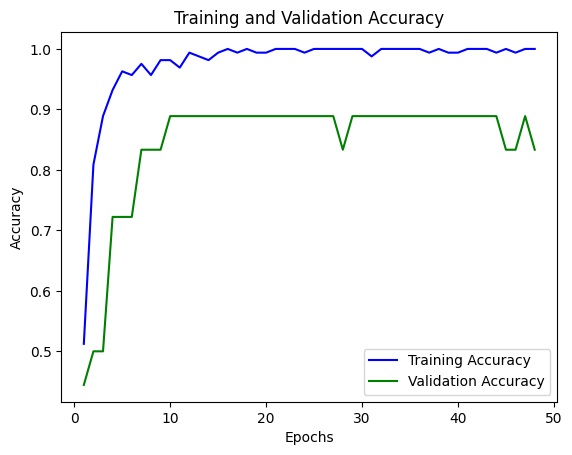


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0469 - accuracy: 1.0000
Score for fold 1: loss of 0.046857405453920364; accuracy of 100.0%
1/1 [==============================] - 0s 283ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.047
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
Average scores for all folds:
> Loss: 0.046857405453920364
> Accuracy: 100.0 (+- 0.0)
> AUC: 1.0
> F1: 1.0
------------------------------------------------------------------------
Event Pair: hand vs sub
Highest AUC Score: 1.0
Highest F1 Score: 1.0
Highest Accuracy Score: 1.0
Best kl value: 8
Best d value: 0.1
>Train: 0=180, 1=180, Test: 0=20, 

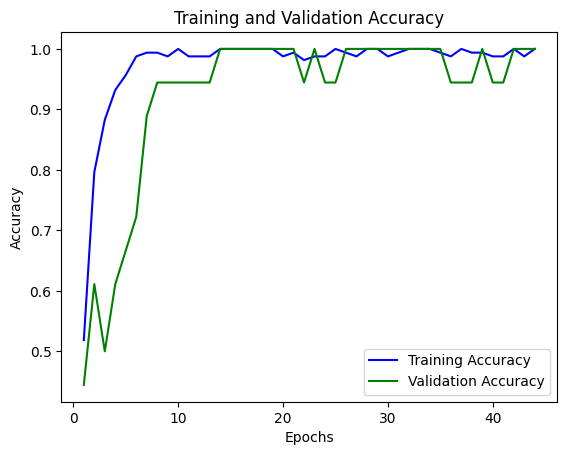


# Evaluate on test data
20/20 [==============================] - 0s 3ms/step - loss: 0.0370 - accuracy: 1.0000
Score for fold 2: loss of 0.03700081631541252; accuracy of 100.0%
1/1 [==============================] - 0s 103ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.047
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.037
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
Average scores for all folds:
> Loss: 0.04192911088466644
> Accuracy: 100.0 (+- 0.0)
> AUC: 1.0
> F1: 1.0
-------------------------------------------------------------

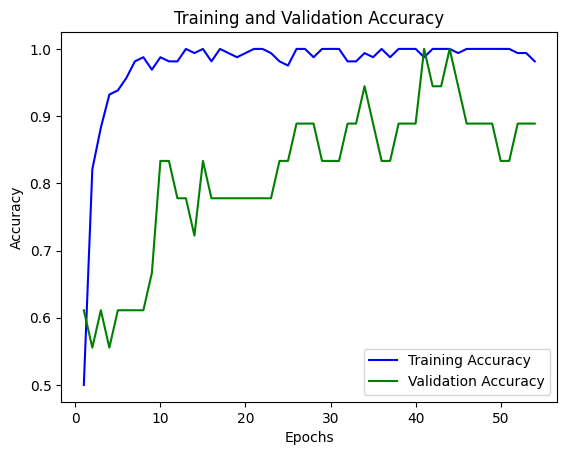


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.2528 - accuracy: 0.8500
Score for fold 3: loss of 0.25279390811920166; accuracy of 85.00000238418579%
1/1 [==============================] - 0s 119ms/step
AUC Accuracy Score Per Fold: 0.967032967032967
F1 Score Per Fold:  0.8399999999999999
Accuracy Per Fold:  0.85
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.047
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.037
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.253
>          - Accuracy: 85.000%
>          - AUC 96.703%
>          - F1: 84.000%
---------------------

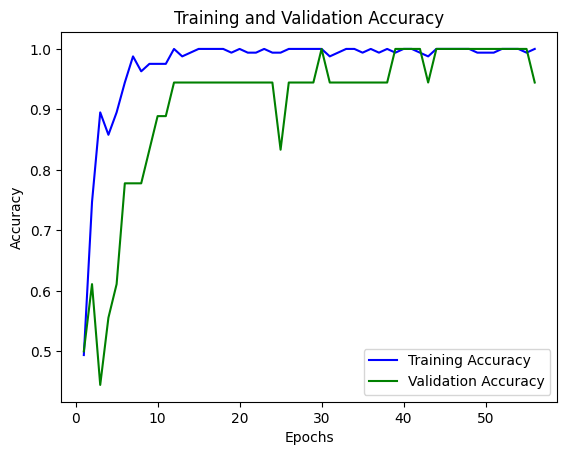


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0580 - accuracy: 1.0000
Score for fold 4: loss of 0.05803670734167099; accuracy of 100.0%
1/1 [==============================] - 0s 114ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.047
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.037
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.253
>          - Accuracy: 85.000%
>          - AUC 96.703%
>          - F1: 84.000%
---------------------------------------------------------------

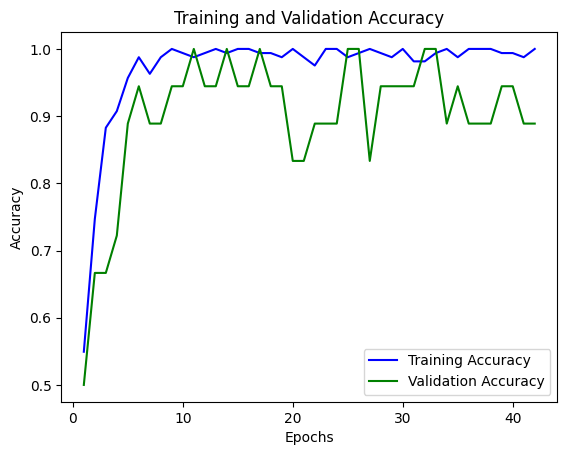


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0881 - accuracy: 0.9500
Score for fold 5: loss of 0.08810790628194809; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 130ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.9466666666666668
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.047
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.037
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.253
>          - Accuracy: 85.000%
>          - AUC 96.703%
>          - F1: 84.000%
------------------------------------

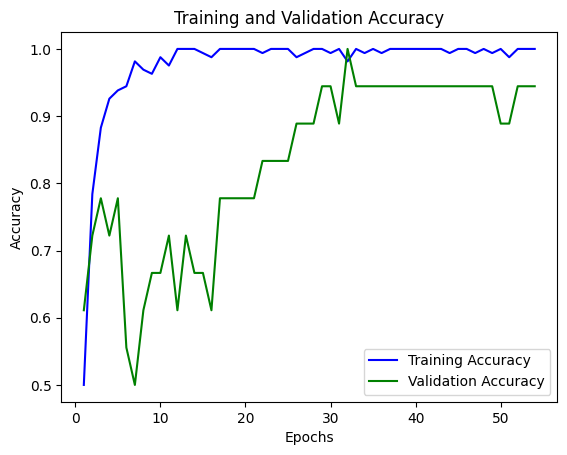


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1117 - accuracy: 0.9500
Score for fold 6: loss of 0.11168758571147919; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 136ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.9466666666666668
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.047
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.037
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.253
>          - Accuracy: 85.000%
>          - AUC 96.703%
>          - F1: 84.000%
------------------------------------

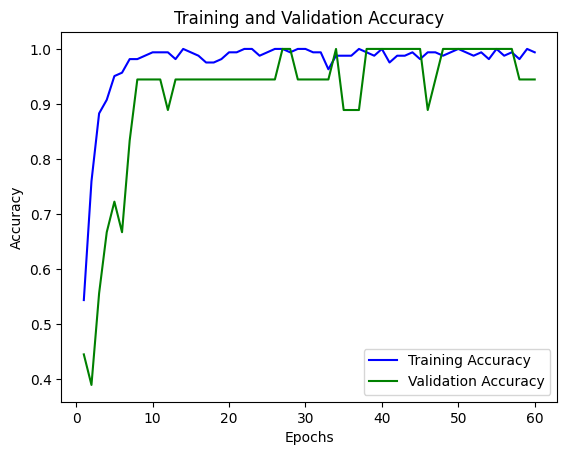


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1721 - accuracy: 0.9000
Score for fold 7: loss of 0.17214417457580566; accuracy of 89.99999761581421%
1/1 [==============================] - 0s 110ms/step
AUC Accuracy Score Per Fold: 0.9780219780219781
F1 Score Per Fold:  0.8958333333333334
Accuracy Per Fold:  0.9
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.047
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.037
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.253
>          - Accuracy: 85.000%
>          - AUC 96.703%
>          - F1: 84.000%
---------------------

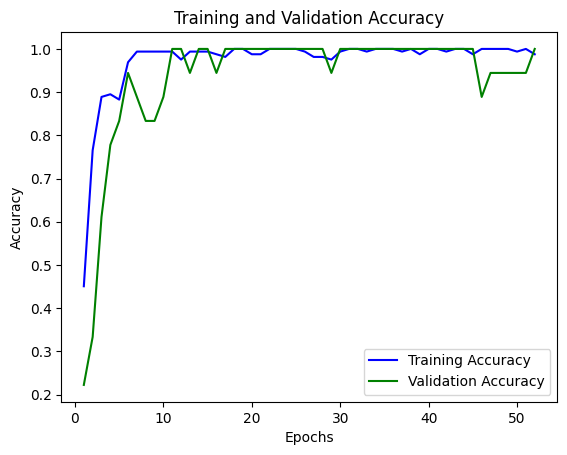


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.2154 - accuracy: 0.9000
Score for fold 8: loss of 0.21542687714099884; accuracy of 89.99999761581421%
1/1 [==============================] - 0s 119ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.8958333333333334
Accuracy Per Fold:  0.9
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.047
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.037
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.253
>          - Accuracy: 85.000%
>          - AUC 96.703%
>          - F1: 84.000%
------------------------------------

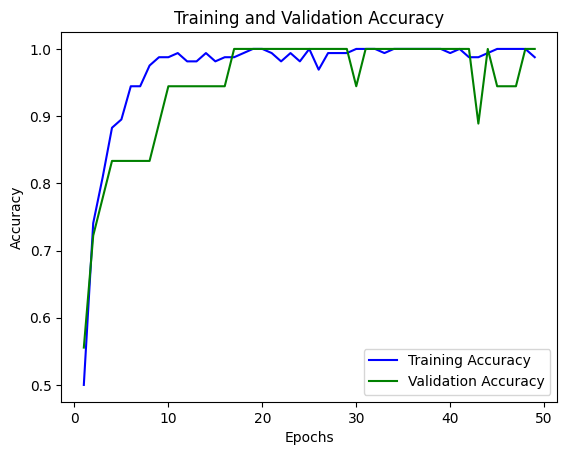


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.2110 - accuracy: 0.9500
Score for fold 9: loss of 0.21100597083568573; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 113ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.9430199430199431
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.047
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.037
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.253
>          - Accuracy: 85.000%
>          - AUC 96.703%
>          - F1: 84.000%
------------------------------------

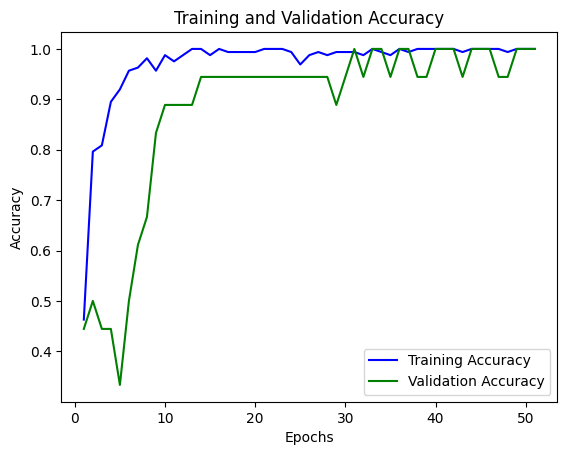


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0769 - accuracy: 1.0000
Score for fold 10: loss of 0.07694533467292786; accuracy of 100.0%
1/1 [==============================] - 0s 115ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.047
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.037
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.253
>          - Accuracy: 85.000%
>          - AUC 96.703%
>          - F1: 84.000%
--------------------------------------------------------------

<ipython-input-15-56b6b828fbcc>:250: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'Fold Number': list(range(1, fold_counter)),


     Event Pair  Highest AUC Score  Highest Accuracy  Highest F1 Score  \
0   hand vs sub                1.0              0.95          0.948849   
1   hand vs sub                1.0              1.00          1.000000   
2   hand vs sub                1.0              1.00          1.000000   
3   hand vs sub                1.0              1.00          1.000000   
4   hand vs sub                1.0              1.00          1.000000   
5   hand vs sub                1.0              1.00          1.000000   
6   hand vs sub                1.0              1.00          1.000000   
7   hand vs sub                1.0              1.00          1.000000   
8   hand vs sub                1.0              1.00          1.000000   
9   hand vs sub                1.0              1.00          1.000000   
10  hand vs sub                1.0              1.00          1.000000   

   Average ROC AUC Average Accuracy Average F1 Score kl    d  \
0              NaN              NaN            

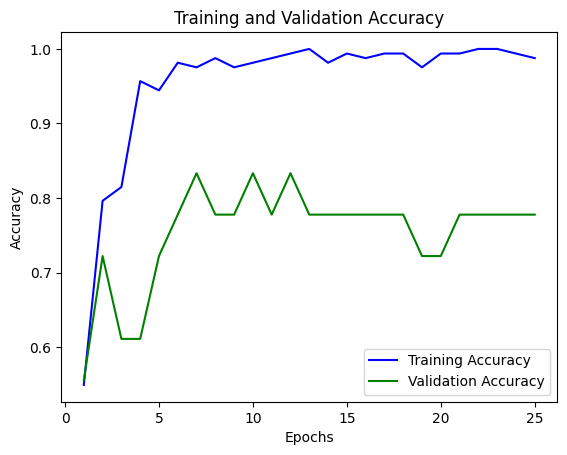


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1120 - accuracy: 1.0000
Score for fold 1: loss of 0.11195170879364014; accuracy of 100.0%
1/1 [==============================] - 0s 105ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.112
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
Average scores for all folds:
> Loss: 0.11195170879364014
> Accuracy: 100.0 (+- 0.0)
> AUC: 1.0
> F1: 1.0
------------------------------------------------------------------------
Event Pair: hand vs sub
Highest AUC Score: 1.0
Highest F1 Score: 1.0
Highest Accuracy Score: 1.0
Best kl value: 8
Best d value: 0.1
>Train: 0=180, 1=180, Test: 0=20, 1=

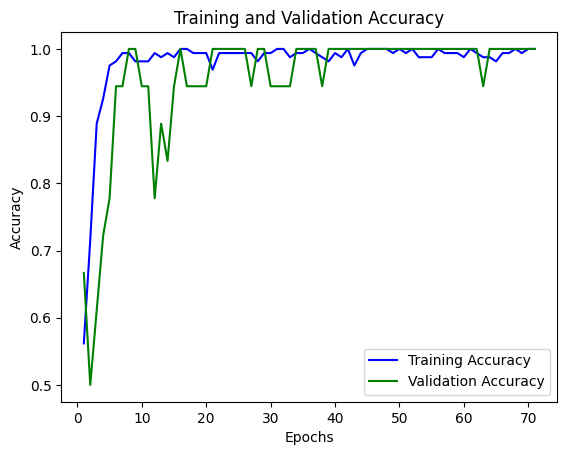


# Evaluate on test data
20/20 [==============================] - 0s 5ms/step - loss: 0.0279 - accuracy: 1.0000
Score for fold 2: loss of 0.027920925989747047; accuracy of 100.0%
1/1 [==============================] - 0s 105ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.112
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.028
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
Average scores for all folds:
> Loss: 0.06993631739169359
> Accuracy: 100.0 (+- 0.0)
> AUC: 1.0
> F1: 1.0
------------------------------------------------------------

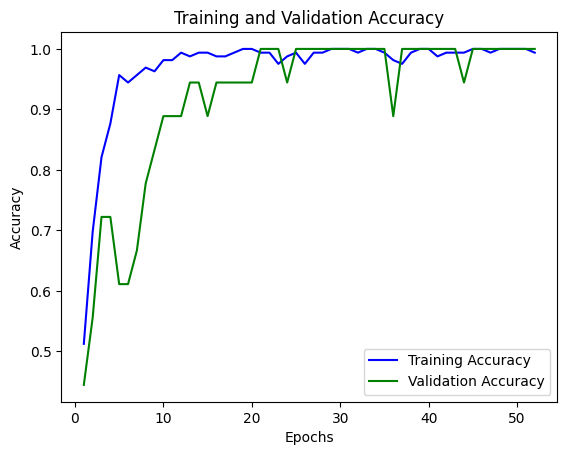


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0720 - accuracy: 1.0000
Score for fold 3: loss of 0.07196816056966782; accuracy of 100.0%
1/1 [==============================] - 0s 118ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.112
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.028
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.072
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------

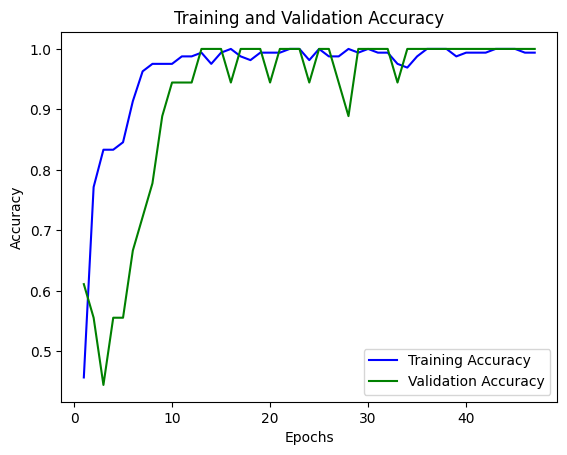


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0354 - accuracy: 1.0000
Score for fold 4: loss of 0.035409536212682724; accuracy of 100.0%
1/1 [==============================] - 0s 114ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.112
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.028
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.072
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
-----------------------------------------------------------

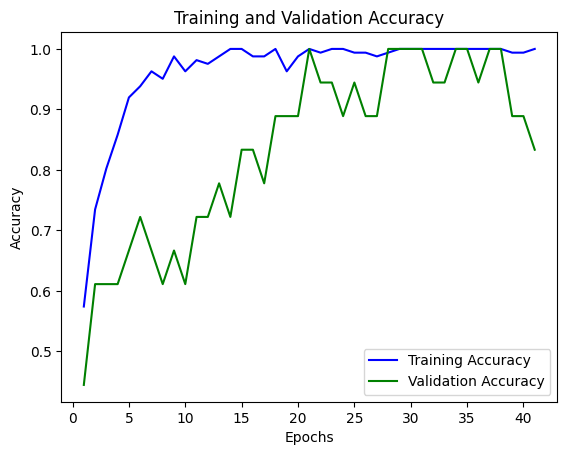


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.3240 - accuracy: 0.9000
Score for fold 5: loss of 0.3239578902721405; accuracy of 89.99999761581421%
1/1 [==============================] - 0s 149ms/step
AUC Accuracy Score Per Fold: 0.945054945054945
F1 Score Per Fold:  0.8958333333333334
Accuracy Per Fold:  0.9
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.112
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.028
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.072
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
--------------------

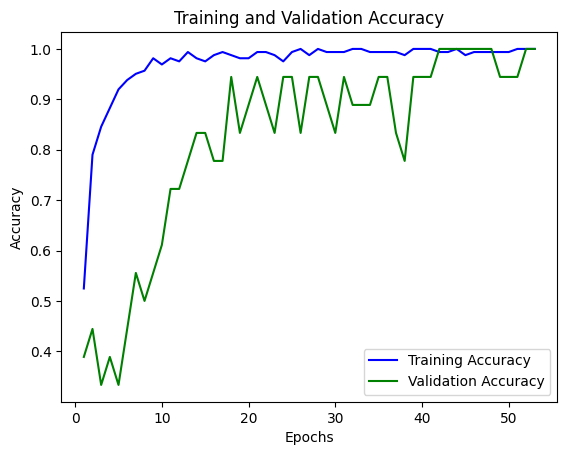


# Evaluate on test data
20/20 [==============================] - 0s 5ms/step - loss: 0.2098 - accuracy: 0.9000
Score for fold 6: loss of 0.2098098248243332; accuracy of 89.99999761581421%
1/1 [==============================] - 0s 115ms/step
AUC Accuracy Score Per Fold: 0.967032967032967
F1 Score Per Fold:  0.8958333333333334
Accuracy Per Fold:  0.9
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.112
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.028
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.072
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
--------------------

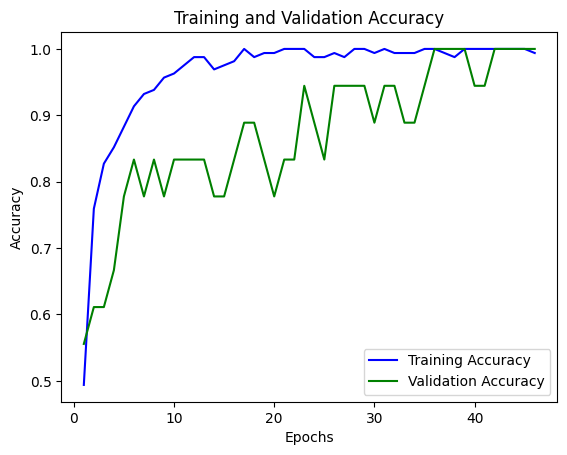


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1042 - accuracy: 0.9500
Score for fold 7: loss of 0.10424121469259262; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 137ms/step
AUC Accuracy Score Per Fold: 0.989010989010989
F1 Score Per Fold:  0.9430199430199431
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.112
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.028
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.072
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
-------------------

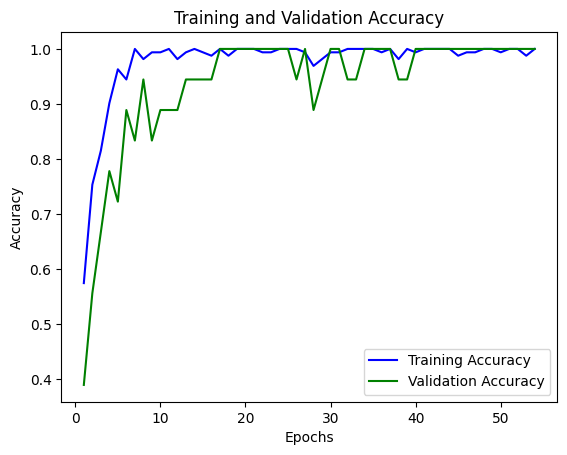


# Evaluate on test data
20/20 [==============================] - 0s 5ms/step - loss: 0.1431 - accuracy: 0.9500
Score for fold 8: loss of 0.14314284920692444; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 120ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.948849104859335
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.112
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.028
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.072
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
----------------------------------

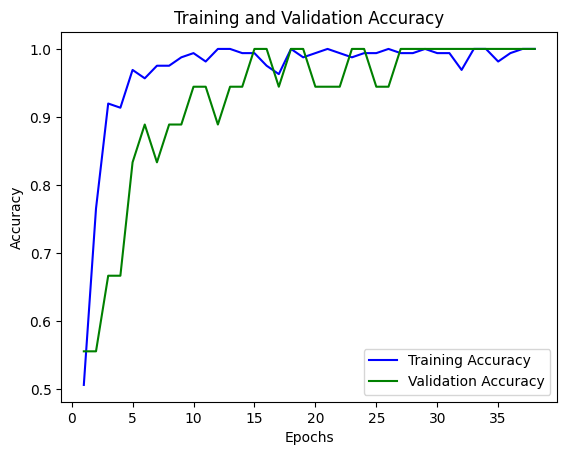


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0342 - accuracy: 1.0000
Score for fold 9: loss of 0.03417789191007614; accuracy of 100.0%
1/1 [==============================] - 0s 115ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.112
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.028
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.072
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------

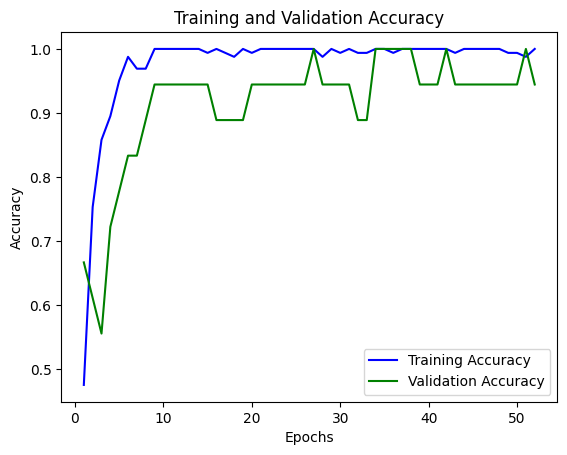


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0431 - accuracy: 1.0000
Score for fold 10: loss of 0.0431106761097908; accuracy of 100.0%
1/1 [==============================] - 0s 115ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.112
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.028
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.072
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------

<ipython-input-15-56b6b828fbcc>:250: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'Fold Number': list(range(1, fold_counter)),


     Event Pair  Highest AUC Score  Highest Accuracy  Highest F1 Score  \
0   hand vs sub                1.0              0.95          0.948849   
1   hand vs sub                1.0              1.00          1.000000   
2   hand vs sub                1.0              1.00          1.000000   
3   hand vs sub                1.0              1.00          1.000000   
4   hand vs sub                1.0              1.00          1.000000   
5   hand vs sub                1.0              1.00          1.000000   
6   hand vs sub                1.0              1.00          1.000000   
7   hand vs sub                1.0              1.00          1.000000   
8   hand vs sub                1.0              1.00          1.000000   
9   hand vs sub                1.0              1.00          1.000000   
10  hand vs sub                1.0              1.00          1.000000   
11  hand vs sub                1.0              1.00          1.000000   

   Average ROC AUC Average Accuracy A

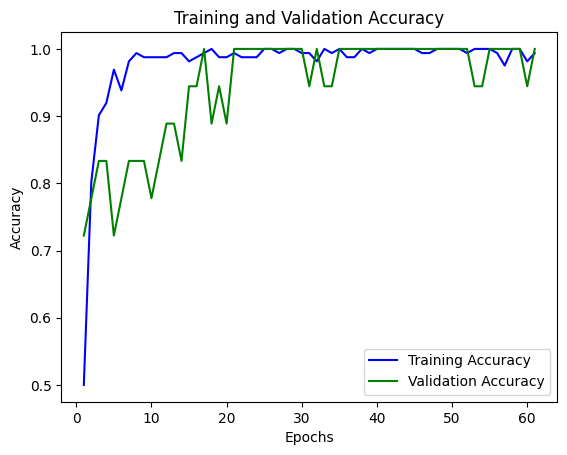


# Evaluate on test data
20/20 [==============================] - 0s 5ms/step - loss: 0.0429 - accuracy: 1.0000
Score for fold 1: loss of 0.04289182275533676; accuracy of 100.0%
1/1 [==============================] - 0s 120ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.043
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
Average scores for all folds:
> Loss: 0.04289182275533676
> Accuracy: 100.0 (+- 0.0)
> AUC: 1.0
> F1: 1.0
------------------------------------------------------------------------
Event Pair: hand vs sub
Highest AUC Score: 1.0
Highest F1 Score: 1.0
Highest Accuracy Score: 1.0
Best kl value: 8
Best d value: 0.1
>Train: 0=180, 1=180, Test: 0=20, 1=

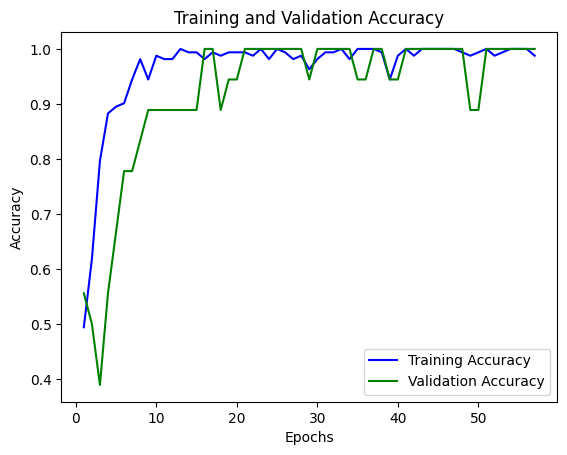


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0222 - accuracy: 1.0000
Score for fold 2: loss of 0.022233517840504646; accuracy of 100.0%
1/1 [==============================] - 0s 120ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.043
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.022
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
Average scores for all folds:
> Loss: 0.032562670297920704
> Accuracy: 100.0 (+- 0.0)
> AUC: 1.0
> F1: 1.0
-----------------------------------------------------------

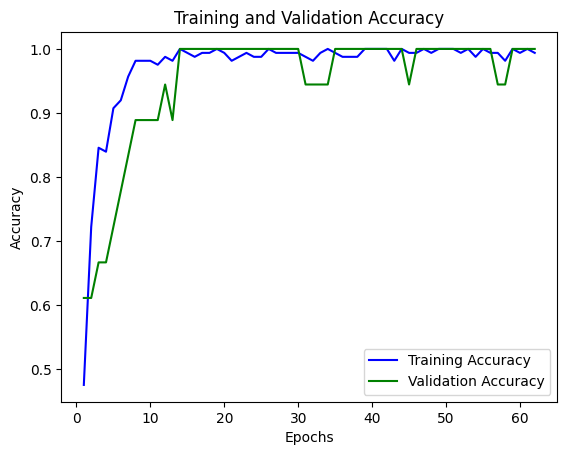


# Evaluate on test data
20/20 [==============================] - 0s 5ms/step - loss: 0.2149 - accuracy: 0.8500
Score for fold 3: loss of 0.21494503319263458; accuracy of 85.00000238418579%
1/1 [==============================] - 0s 123ms/step
AUC Accuracy Score Per Fold: 0.967032967032967
F1 Score Per Fold:  0.8399999999999999
Accuracy Per Fold:  0.85
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.043
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.022
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.215
>          - Accuracy: 85.000%
>          - AUC 96.703%
>          - F1: 84.000%
---------------------

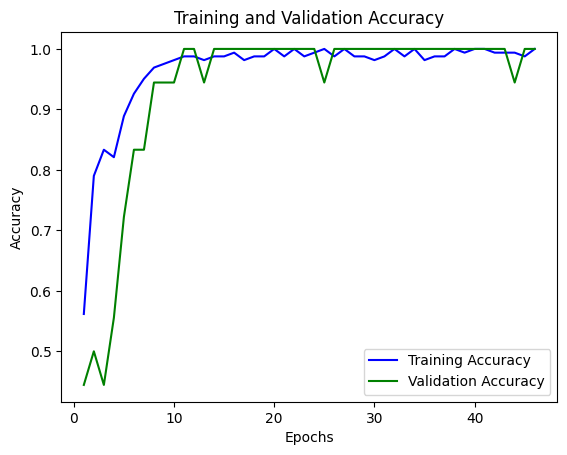


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0295 - accuracy: 1.0000
Score for fold 4: loss of 0.02948121726512909; accuracy of 100.0%
1/1 [==============================] - 0s 108ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.043
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.022
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.215
>          - Accuracy: 85.000%
>          - AUC 96.703%
>          - F1: 84.000%
---------------------------------------------------------------

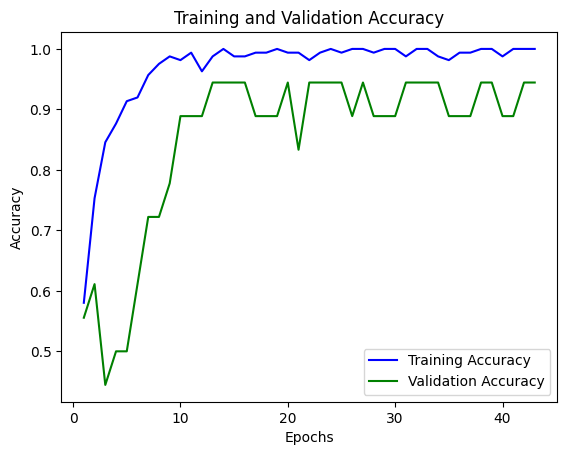


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1198 - accuracy: 0.9500
Score for fold 5: loss of 0.11977609246969223; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 112ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.9466666666666668
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.043
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.022
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.215
>          - Accuracy: 85.000%
>          - AUC 96.703%
>          - F1: 84.000%
------------------------------------

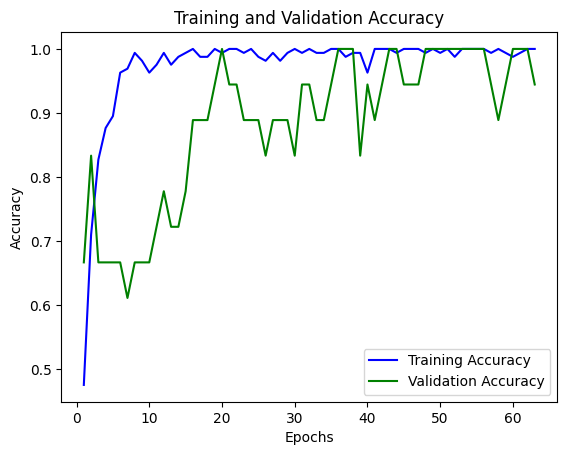


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1074 - accuracy: 0.9500
Score for fold 6: loss of 0.10740981996059418; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 107ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.9466666666666668
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.043
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.022
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.215
>          - Accuracy: 85.000%
>          - AUC 96.703%
>          - F1: 84.000%
------------------------------------

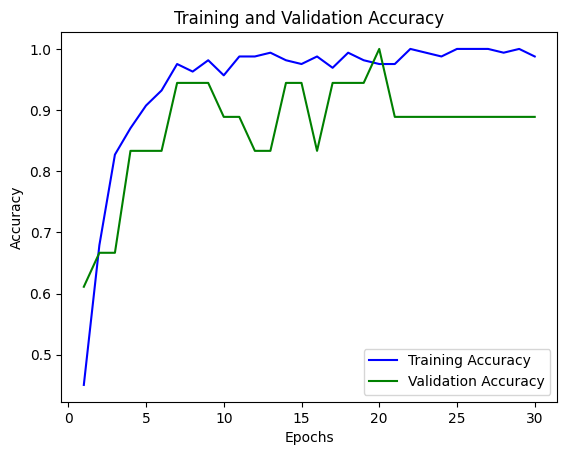


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1783 - accuracy: 0.9500
Score for fold 7: loss of 0.17829547822475433; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 117ms/step
AUC Accuracy Score Per Fold: 0.989010989010989
F1 Score Per Fold:  0.9430199430199431
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.043
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.022
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.215
>          - Accuracy: 85.000%
>          - AUC 96.703%
>          - F1: 84.000%
----------------------

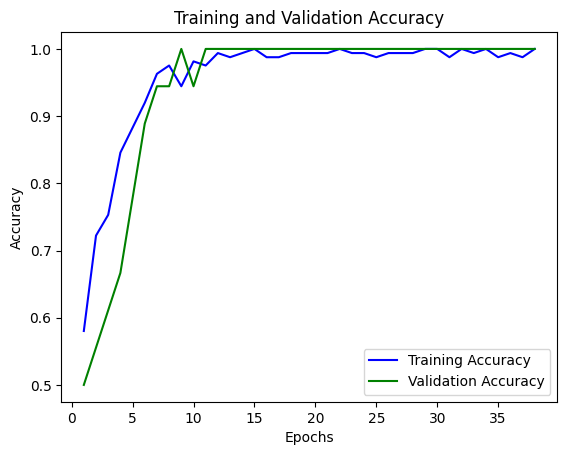


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.2275 - accuracy: 0.9000
Score for fold 8: loss of 0.22745314240455627; accuracy of 89.99999761581421%
1/1 [==============================] - 0s 145ms/step
AUC Accuracy Score Per Fold: 0.9898989898989898
F1 Score Per Fold:  0.8958333333333334
Accuracy Per Fold:  0.9
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.043
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.022
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.215
>          - Accuracy: 85.000%
>          - AUC 96.703%
>          - F1: 84.000%
---------------------

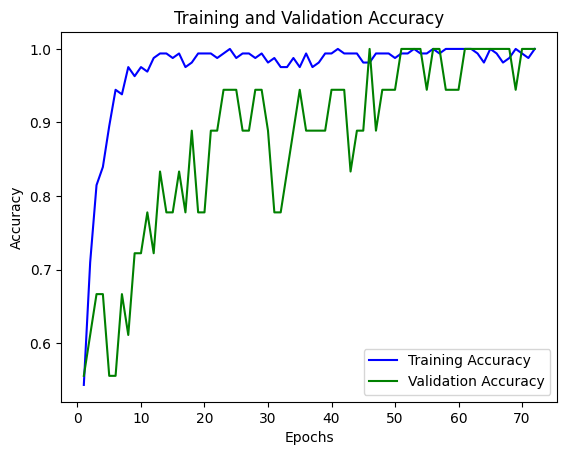


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1225 - accuracy: 0.9500
Score for fold 9: loss of 0.1224576011300087; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 122ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.9373040752351097
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.043
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.022
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.215
>          - Accuracy: 85.000%
>          - AUC 96.703%
>          - F1: 84.000%
-------------------------------------

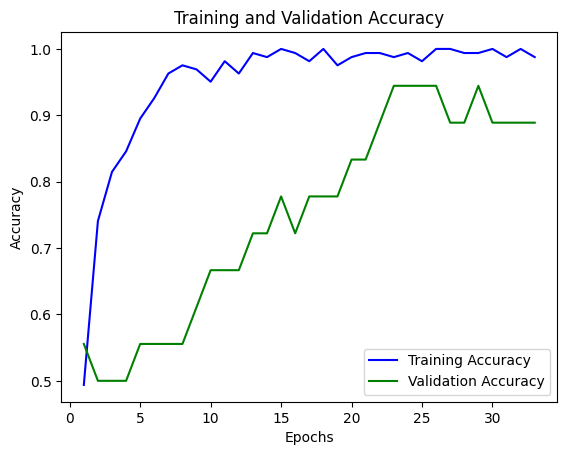


# Evaluate on test data
20/20 [==============================] - 0s 5ms/step - loss: 0.1027 - accuracy: 0.9500
Score for fold 10: loss of 0.10265103727579117; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 157ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.9466666666666668
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.043
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.022
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.215
>          - Accuracy: 85.000%
>          - AUC 96.703%
>          - F1: 84.000%
-----------------------------------

<ipython-input-15-56b6b828fbcc>:250: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'Fold Number': list(range(1, fold_counter)),


     Event Pair  Highest AUC Score  Highest Accuracy  Highest F1 Score  \
0   hand vs sub                1.0              0.95          0.948849   
1   hand vs sub                1.0              1.00          1.000000   
2   hand vs sub                1.0              1.00          1.000000   
3   hand vs sub                1.0              1.00          1.000000   
4   hand vs sub                1.0              1.00          1.000000   
5   hand vs sub                1.0              1.00          1.000000   
6   hand vs sub                1.0              1.00          1.000000   
7   hand vs sub                1.0              1.00          1.000000   
8   hand vs sub                1.0              1.00          1.000000   
9   hand vs sub                1.0              1.00          1.000000   
10  hand vs sub                1.0              1.00          1.000000   
11  hand vs sub                1.0              1.00          1.000000   
12  hand vs sub                1.0    

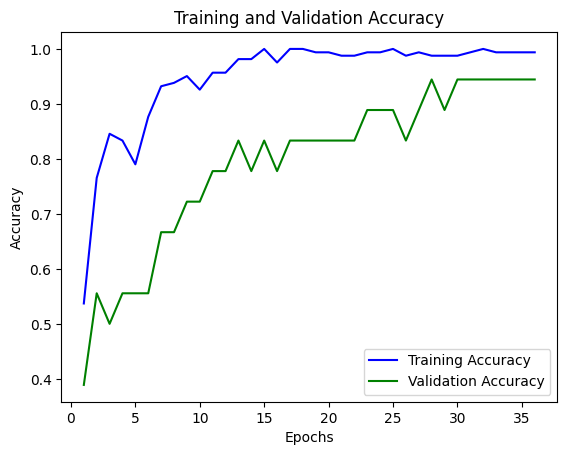


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0477 - accuracy: 1.0000
Score for fold 1: loss of 0.04766910895705223; accuracy of 100.0%
1/1 [==============================] - 0s 131ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.048
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
Average scores for all folds:
> Loss: 0.04766910895705223
> Accuracy: 100.0 (+- 0.0)
> AUC: 1.0
> F1: 1.0
------------------------------------------------------------------------
Event Pair: hand vs sub
Highest AUC Score: 1.0
Highest F1 Score: 1.0
Highest Accuracy Score: 1.0
Best kl value: 8
Best d value: 0.1
>Train: 0=180, 1=180, Test: 0=20, 1=

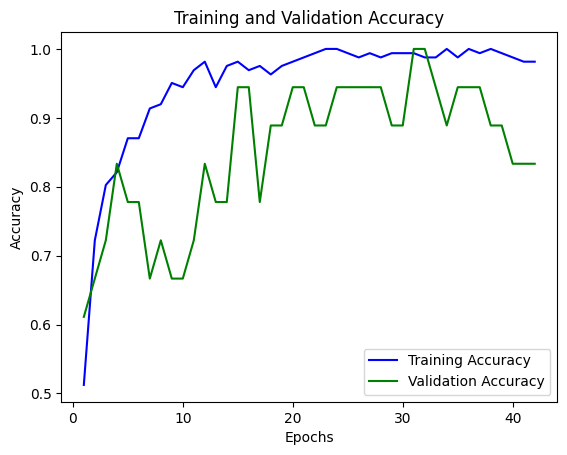


# Evaluate on test data
20/20 [==============================] - 0s 5ms/step - loss: 0.0850 - accuracy: 0.9500
Score for fold 2: loss of 0.08498291671276093; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 114ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.9430199430199431
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.048
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.085
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.302%
------------------------------------------------------------------------
Average scores for all folds:
> Loss: 0.06632601283490658
> Accuracy: 97.49999940395355 (+- 2.5000005960464478)
> AUC: 1.0
> F1: 0.97150997150

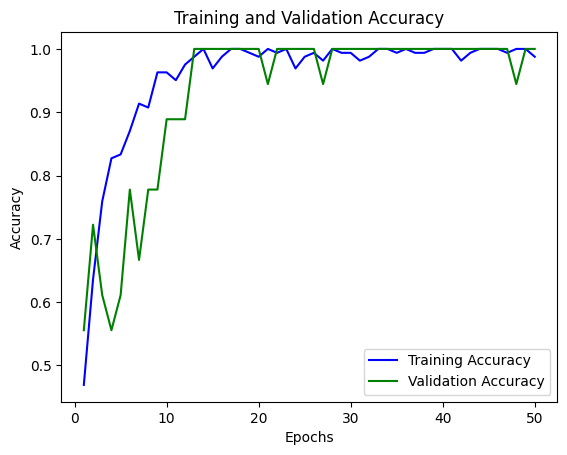


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0819 - accuracy: 1.0000
Score for fold 3: loss of 0.08186275511980057; accuracy of 100.0%
1/1 [==============================] - 0s 111ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.048
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.085
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.302%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.082
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
--------------------------------------------------------------

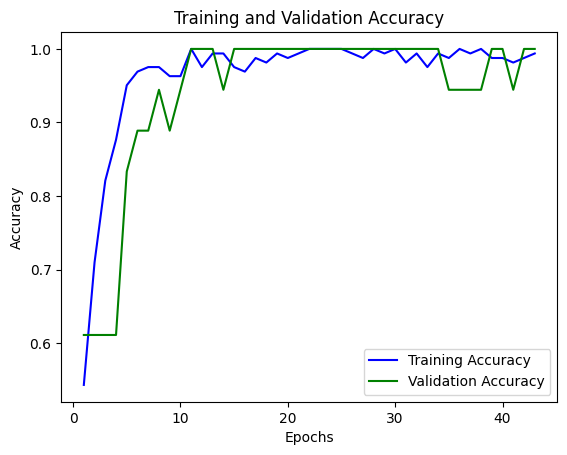


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0386 - accuracy: 1.0000
Score for fold 4: loss of 0.03861838951706886; accuracy of 100.0%
1/1 [==============================] - 0s 106ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.048
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.085
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.302%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.082
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
--------------------------------------------------------------

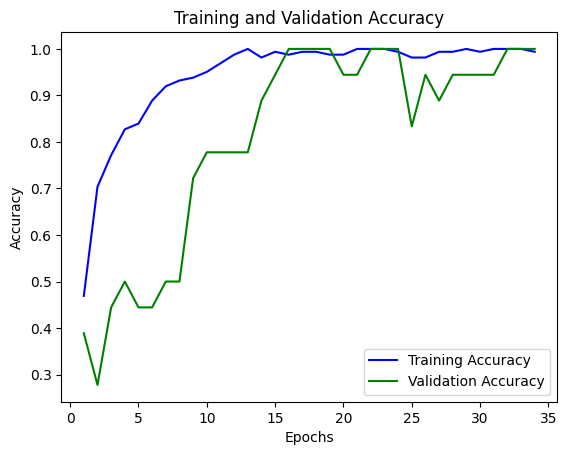


# Evaluate on test data
20/20 [==============================] - 0s 5ms/step - loss: 0.0963 - accuracy: 0.9000
Score for fold 5: loss of 0.09629642963409424; accuracy of 89.99999761581421%
1/1 [==============================] - 0s 110ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.8958333333333334
Accuracy Per Fold:  0.9
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.048
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.085
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.302%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.082
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
-----------------------------------

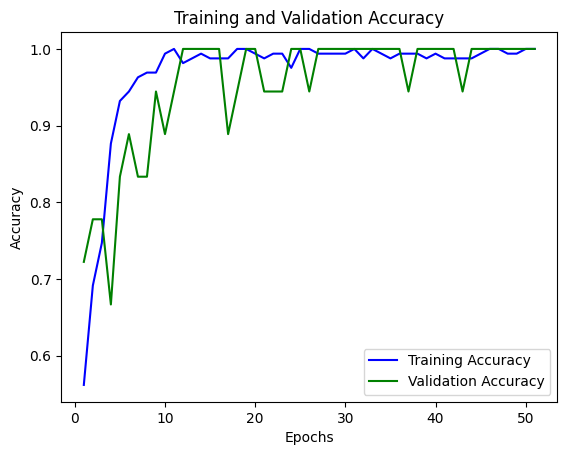


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1921 - accuracy: 0.9000
Score for fold 6: loss of 0.1921328753232956; accuracy of 89.99999761581421%
1/1 [==============================] - 0s 134ms/step
AUC Accuracy Score Per Fold: 0.989010989010989
F1 Score Per Fold:  0.8901098901098901
Accuracy Per Fold:  0.9
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.048
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.085
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.302%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.082
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
----------------------

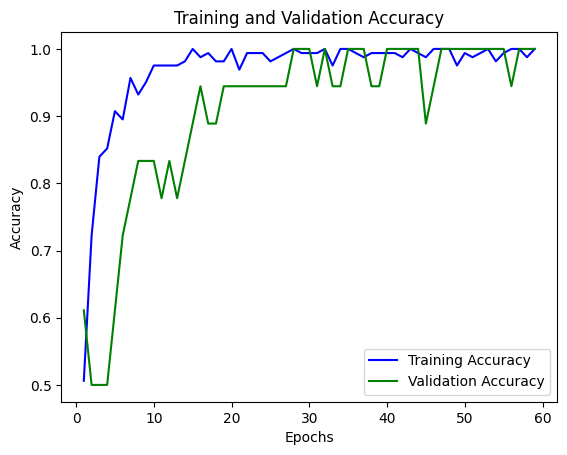


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1212 - accuracy: 0.9500
Score for fold 7: loss of 0.12123759090900421; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 127ms/step
AUC Accuracy Score Per Fold: 0.989010989010989
F1 Score Per Fold:  0.9466666666666668
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.048
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.085
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.302%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.082
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
---------------------

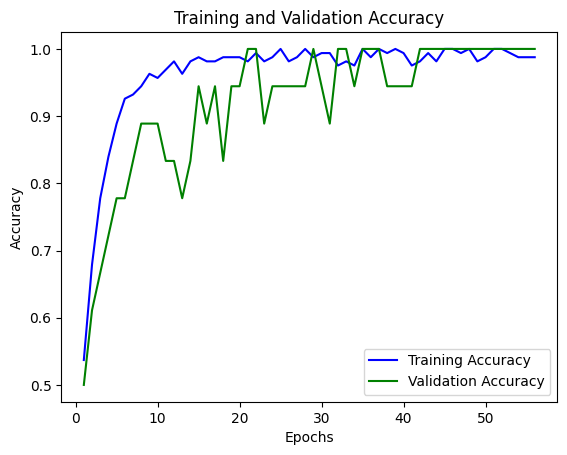


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.2002 - accuracy: 0.9500
Score for fold 8: loss of 0.20021149516105652; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 152ms/step
AUC Accuracy Score Per Fold: 0.9797979797979797
F1 Score Per Fold:  0.948849104859335
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.048
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.085
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.302%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.082
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
---------------------

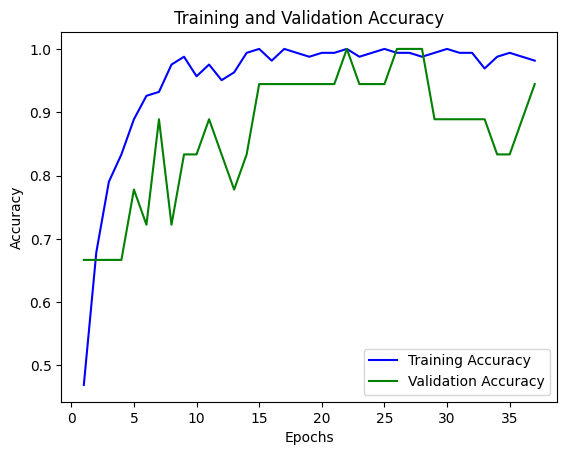


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1828 - accuracy: 0.9000
Score for fold 9: loss of 0.18279100954532623; accuracy of 89.99999761581421%
1/1 [==============================] - 0s 122ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.8901098901098901
Accuracy Per Fold:  0.9
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.048
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.085
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.302%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.082
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
-----------------------------------

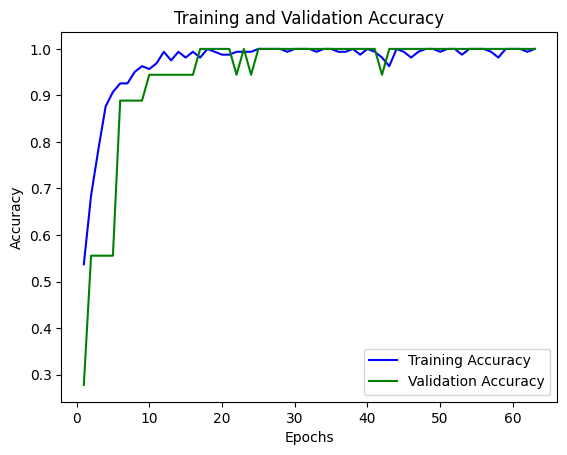


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1097 - accuracy: 1.0000
Score for fold 10: loss of 0.10974321514368057; accuracy of 100.0%
1/1 [==============================] - 0s 119ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.048
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.085
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.302%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.082
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
-------------------------------------------------------------

<ipython-input-15-56b6b828fbcc>:250: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'Fold Number': list(range(1, fold_counter)),


     Event Pair  Highest AUC Score  Highest Accuracy  Highest F1 Score  \
0   hand vs sub                1.0              0.95          0.948849   
1   hand vs sub                1.0              1.00          1.000000   
2   hand vs sub                1.0              1.00          1.000000   
3   hand vs sub                1.0              1.00          1.000000   
4   hand vs sub                1.0              1.00          1.000000   
5   hand vs sub                1.0              1.00          1.000000   
6   hand vs sub                1.0              1.00          1.000000   
7   hand vs sub                1.0              1.00          1.000000   
8   hand vs sub                1.0              1.00          1.000000   
9   hand vs sub                1.0              1.00          1.000000   
10  hand vs sub                1.0              1.00          1.000000   
11  hand vs sub                1.0              1.00          1.000000   
12  hand vs sub                1.0    

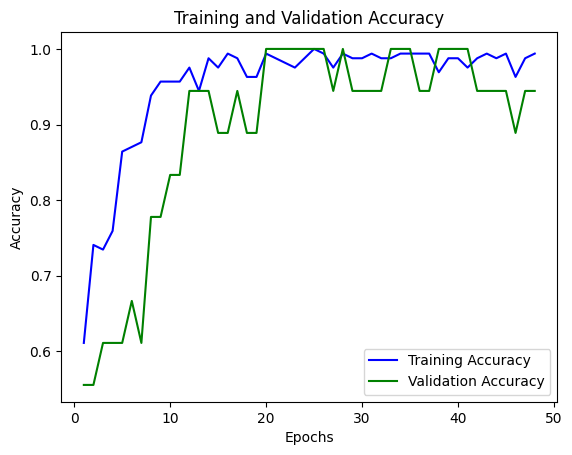


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0530 - accuracy: 1.0000
Score for fold 1: loss of 0.05295008420944214; accuracy of 100.0%
1/1 [==============================] - 0s 113ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.053
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
Average scores for all folds:
> Loss: 0.05295008420944214
> Accuracy: 100.0 (+- 0.0)
> AUC: 1.0
> F1: 1.0
------------------------------------------------------------------------
Event Pair: hand vs sub
Highest AUC Score: 1.0
Highest F1 Score: 1.0
Highest Accuracy Score: 1.0
Best kl value: 8
Best d value: 0.1
>Train: 0=180, 1=180, Test: 0=20, 1=

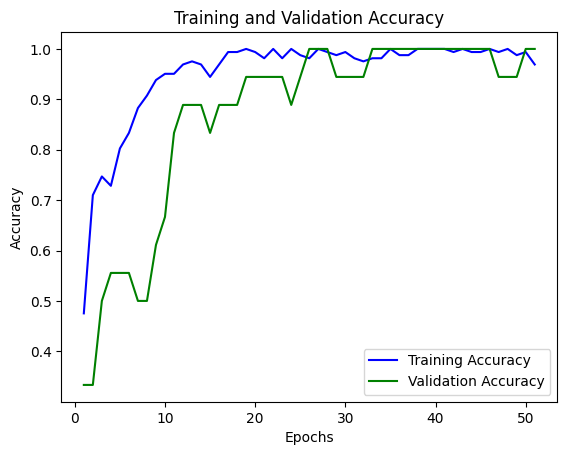


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0201 - accuracy: 1.0000
Score for fold 2: loss of 0.020125020295381546; accuracy of 100.0%
1/1 [==============================] - 0s 117ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.053
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.020
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
Average scores for all folds:
> Loss: 0.03653755225241184
> Accuracy: 100.0 (+- 0.0)
> AUC: 1.0
> F1: 1.0
------------------------------------------------------------

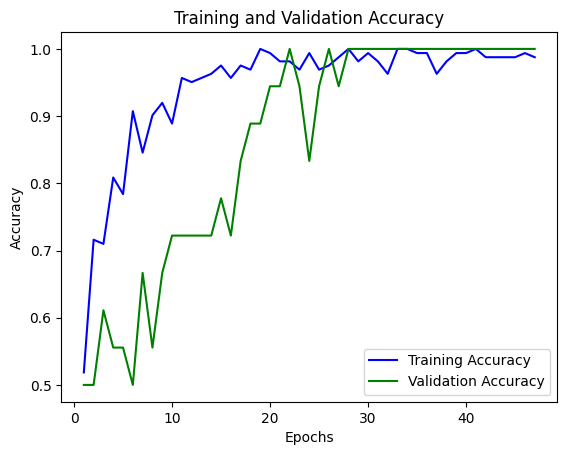


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.2041 - accuracy: 0.9000
Score for fold 3: loss of 0.2041323184967041; accuracy of 89.99999761581421%
1/1 [==============================] - 0s 116ms/step
AUC Accuracy Score Per Fold: 0.9780219780219781
F1 Score Per Fold:  0.8901098901098901
Accuracy Per Fold:  0.9
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.053
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.020
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.204
>          - Accuracy: 90.000%
>          - AUC 97.802%
>          - F1: 89.011%
----------------------

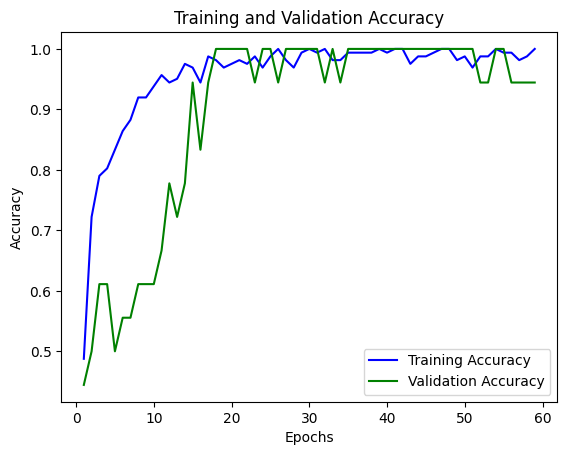


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0464 - accuracy: 1.0000
Score for fold 4: loss of 0.046405401080846786; accuracy of 100.0%
1/1 [==============================] - 0s 159ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.053
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.020
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.204
>          - Accuracy: 90.000%
>          - AUC 97.802%
>          - F1: 89.011%
--------------------------------------------------------------

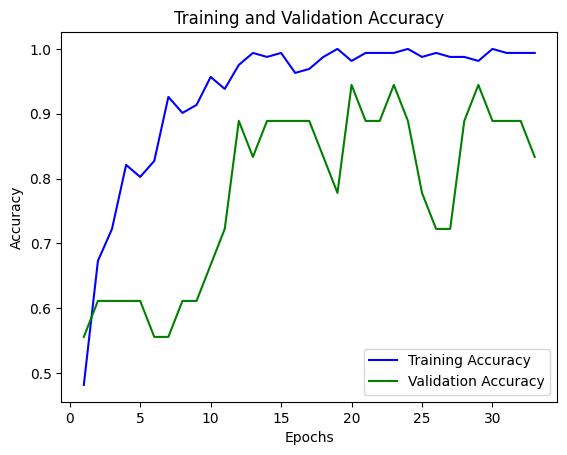


# Evaluate on test data
20/20 [==============================] - 0s 5ms/step - loss: 0.2467 - accuracy: 0.9000
Score for fold 5: loss of 0.24672698974609375; accuracy of 89.99999761581421%
1/1 [==============================] - 0s 146ms/step
AUC Accuracy Score Per Fold: 0.9780219780219781
F1 Score Per Fold:  0.8958333333333334
Accuracy Per Fold:  0.9
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.053
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.020
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.204
>          - Accuracy: 90.000%
>          - AUC 97.802%
>          - F1: 89.011%
---------------------

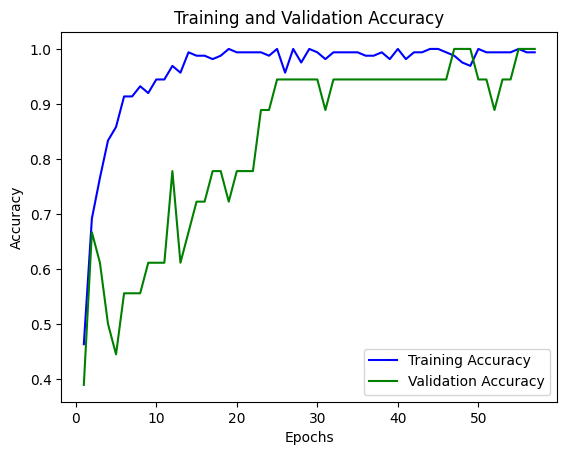


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1460 - accuracy: 0.9500
Score for fold 6: loss of 0.1459735929965973; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 118ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.9466666666666668
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.053
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.020
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.204
>          - Accuracy: 90.000%
>          - AUC 97.802%
>          - F1: 89.011%
-------------------------------------

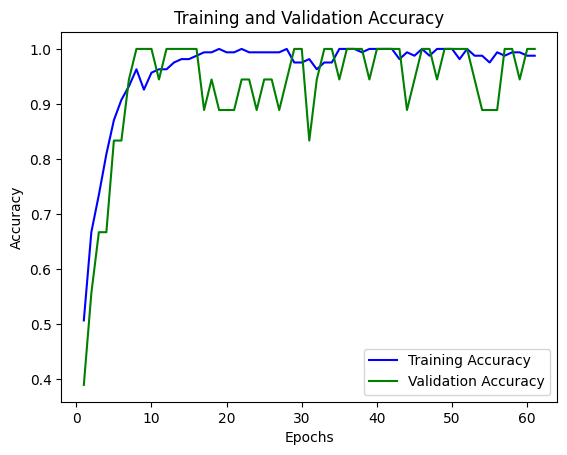


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1092 - accuracy: 0.9000
Score for fold 7: loss of 0.1092355027794838; accuracy of 89.99999761581421%
1/1 [==============================] - 0s 112ms/step
AUC Accuracy Score Per Fold: 0.989010989010989
F1 Score Per Fold:  0.8901098901098901
Accuracy Per Fold:  0.9
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.053
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.020
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.204
>          - Accuracy: 90.000%
>          - AUC 97.802%
>          - F1: 89.011%
-----------------------

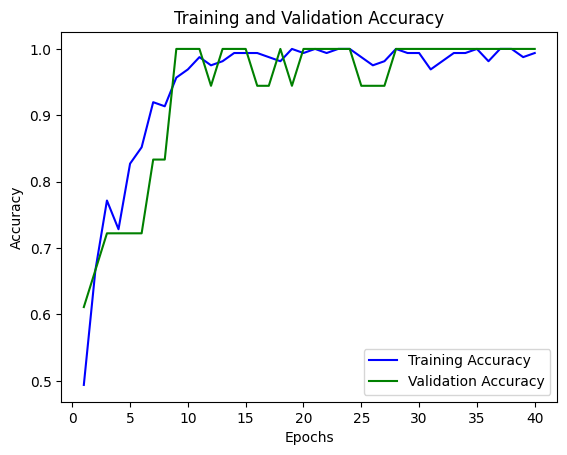


# Evaluate on test data
20/20 [==============================] - 0s 5ms/step - loss: 0.3547 - accuracy: 0.9000
Score for fold 8: loss of 0.35468438267707825; accuracy of 89.99999761581421%
1/1 [==============================] - 0s 108ms/step
AUC Accuracy Score Per Fold: 0.9494949494949495
F1 Score Per Fold:  0.8958333333333334
Accuracy Per Fold:  0.9
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.053
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.020
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.204
>          - Accuracy: 90.000%
>          - AUC 97.802%
>          - F1: 89.011%
---------------------

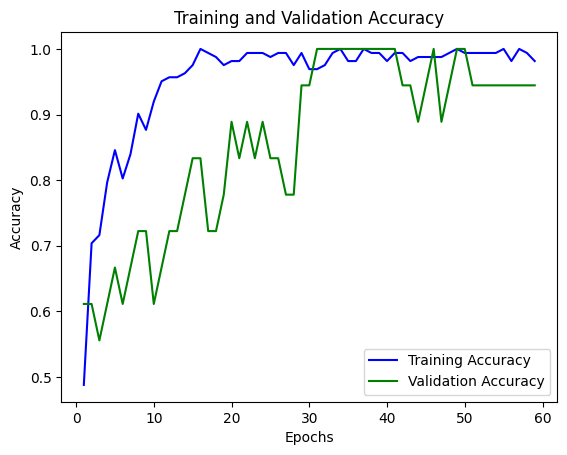


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0827 - accuracy: 0.9500
Score for fold 9: loss of 0.08268411457538605; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 148ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.9430199430199431
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.053
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.020
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.204
>          - Accuracy: 90.000%
>          - AUC 97.802%
>          - F1: 89.011%
------------------------------------

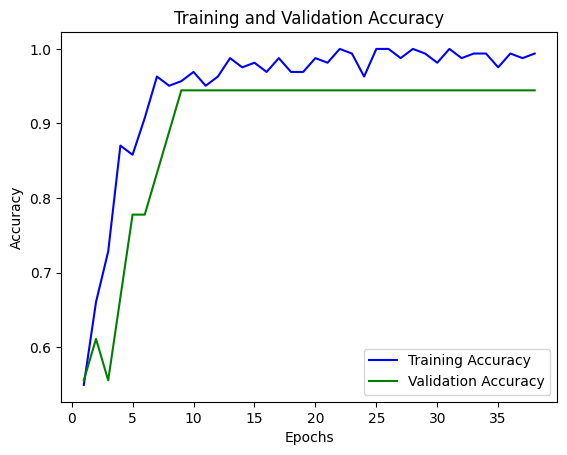


# Evaluate on test data
20/20 [==============================] - 0s 5ms/step - loss: 0.1041 - accuracy: 1.0000
Score for fold 10: loss of 0.10406871140003204; accuracy of 100.0%
1/1 [==============================] - 0s 109ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.053
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.020
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.204
>          - Accuracy: 90.000%
>          - AUC 97.802%
>          - F1: 89.011%
--------------------------------------------------------------

<ipython-input-15-56b6b828fbcc>:250: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'Fold Number': list(range(1, fold_counter)),


     Event Pair  Highest AUC Score  Highest Accuracy  Highest F1 Score  \
0   hand vs sub                1.0              0.95          0.948849   
1   hand vs sub                1.0              1.00          1.000000   
2   hand vs sub                1.0              1.00          1.000000   
3   hand vs sub                1.0              1.00          1.000000   
4   hand vs sub                1.0              1.00          1.000000   
5   hand vs sub                1.0              1.00          1.000000   
6   hand vs sub                1.0              1.00          1.000000   
7   hand vs sub                1.0              1.00          1.000000   
8   hand vs sub                1.0              1.00          1.000000   
9   hand vs sub                1.0              1.00          1.000000   
10  hand vs sub                1.0              1.00          1.000000   
11  hand vs sub                1.0              1.00          1.000000   
12  hand vs sub                1.0    

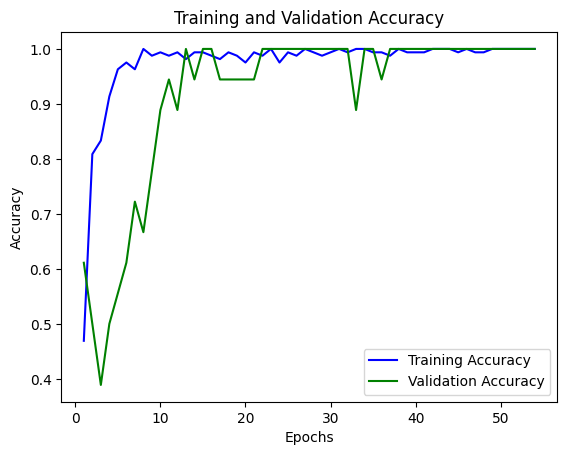


# Evaluate on test data
20/20 [==============================] - 0s 5ms/step - loss: 0.0437 - accuracy: 1.0000
Score for fold 1: loss of 0.04374043270945549; accuracy of 100.0%
1/1 [==============================] - 0s 392ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.044
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
Average scores for all folds:
> Loss: 0.04374043270945549
> Accuracy: 100.0 (+- 0.0)
> AUC: 1.0
> F1: 1.0
------------------------------------------------------------------------
Event Pair: hand vs sub
Highest AUC Score: 1.0
Highest F1 Score: 1.0
Highest Accuracy Score: 1.0
Best kl value: 8
Best d value: 0.1
>Train: 0=180, 1=180, Test: 0=20, 1=

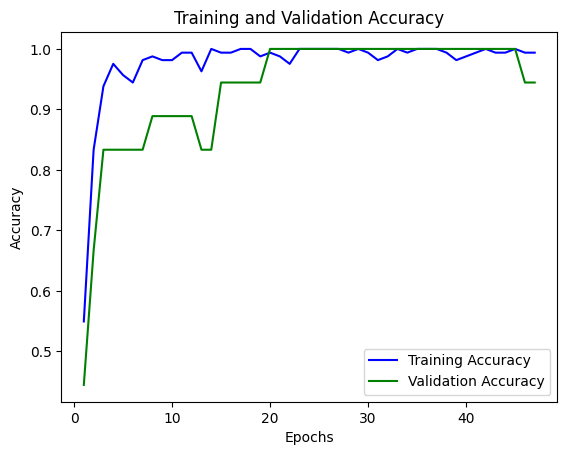


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0376 - accuracy: 1.0000
Score for fold 2: loss of 0.037634044885635376; accuracy of 100.0%
1/1 [==============================] - 0s 139ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.044
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.038
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
Average scores for all folds:
> Loss: 0.04068723879754543
> Accuracy: 100.0 (+- 0.0)
> AUC: 1.0
> F1: 1.0
------------------------------------------------------------

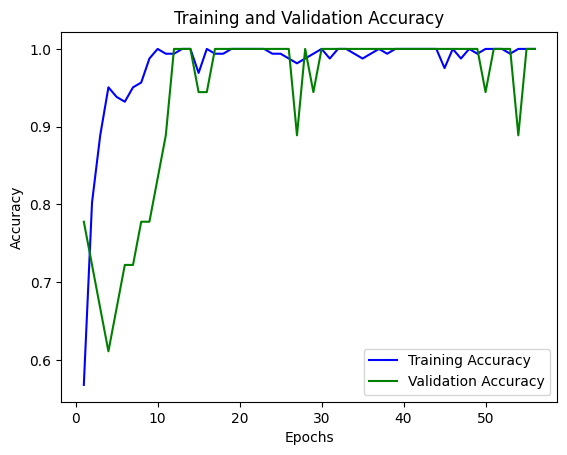


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1376 - accuracy: 0.9000
Score for fold 3: loss of 0.13756605982780457; accuracy of 89.99999761581421%
1/1 [==============================] - 0s 119ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.8958333333333334
Accuracy Per Fold:  0.9
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.044
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.038
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.138
>          - Accuracy: 90.000%
>          - AUC 100.000%
>          - F1: 89.583%
-----------------------------------

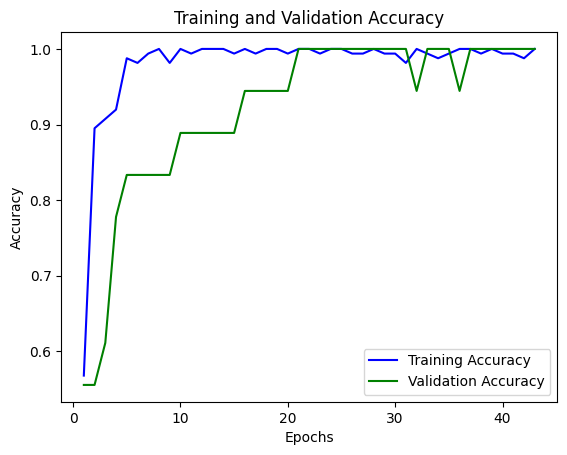


# Evaluate on test data
20/20 [==============================] - 0s 5ms/step - loss: 0.0362 - accuracy: 1.0000
Score for fold 4: loss of 0.03622453287243843; accuracy of 100.0%
1/1 [==============================] - 0s 123ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.044
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.038
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.138
>          - Accuracy: 90.000%
>          - AUC 100.000%
>          - F1: 89.583%
--------------------------------------------------------------

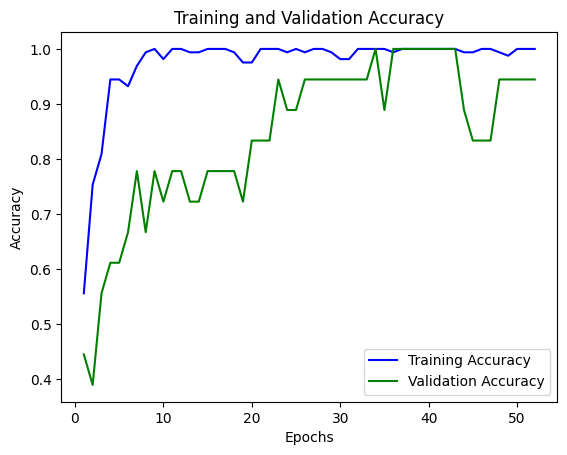


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0458 - accuracy: 1.0000
Score for fold 5: loss of 0.045753829181194305; accuracy of 100.0%
1/1 [==============================] - 0s 114ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.044
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.038
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.138
>          - Accuracy: 90.000%
>          - AUC 100.000%
>          - F1: 89.583%
-------------------------------------------------------------

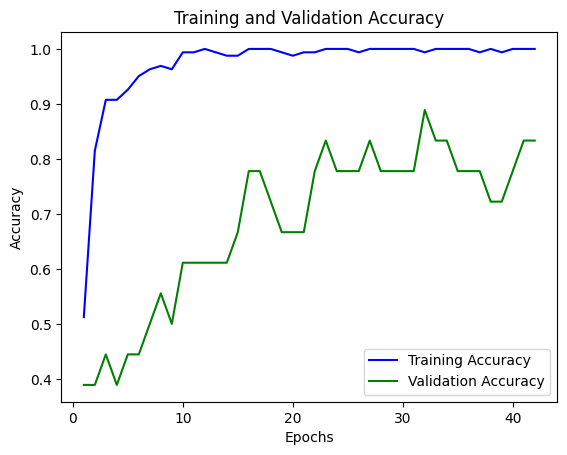


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.2334 - accuracy: 0.8500
Score for fold 6: loss of 0.23341858386993408; accuracy of 85.00000238418579%
1/1 [==============================] - 0s 112ms/step
AUC Accuracy Score Per Fold: 0.956043956043956
F1 Score Per Fold:  0.8399999999999999
Accuracy Per Fold:  0.85
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.044
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.038
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.138
>          - Accuracy: 90.000%
>          - AUC 100.000%
>          - F1: 89.583%
--------------------

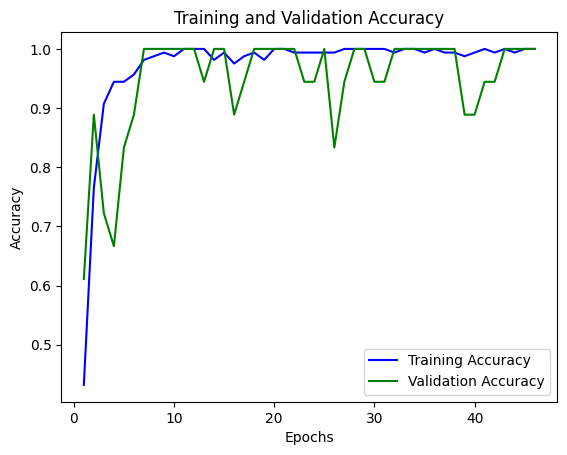


# Evaluate on test data
20/20 [==============================] - 0s 5ms/step - loss: 0.0380 - accuracy: 1.0000
Score for fold 7: loss of 0.037959080189466476; accuracy of 100.0%
1/1 [==============================] - 0s 150ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.044
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.038
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.138
>          - Accuracy: 90.000%
>          - AUC 100.000%
>          - F1: 89.583%
-------------------------------------------------------------

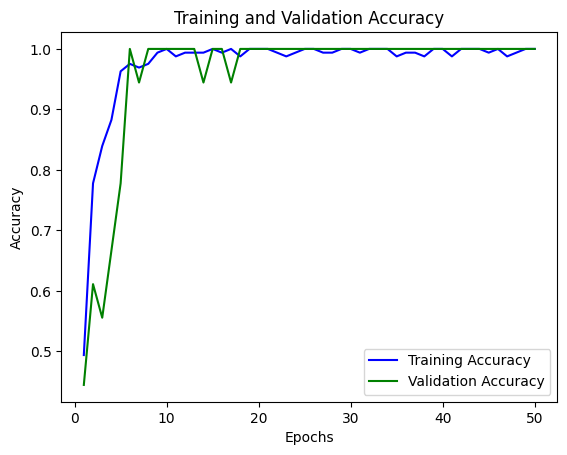


# Evaluate on test data
20/20 [==============================] - 0s 5ms/step - loss: 0.3384 - accuracy: 0.9000
Score for fold 8: loss of 0.33841007947921753; accuracy of 89.99999761581421%
1/1 [==============================] - 0s 134ms/step
AUC Accuracy Score Per Fold: 0.9898989898989898
F1 Score Per Fold:  0.8958333333333334
Accuracy Per Fold:  0.9
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.044
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.038
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.138
>          - Accuracy: 90.000%
>          - AUC 100.000%
>          - F1: 89.583%
--------------------

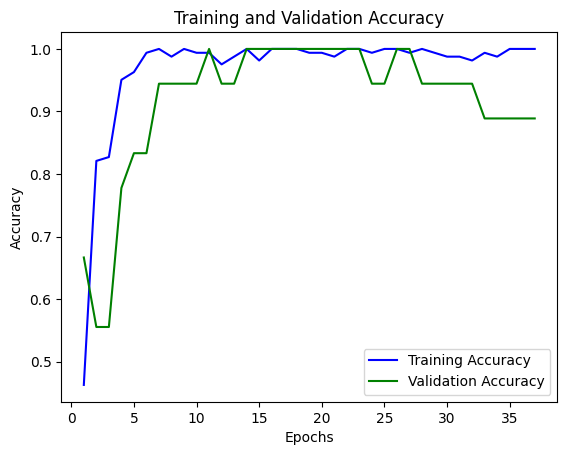


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0944 - accuracy: 0.9500
Score for fold 9: loss of 0.09435176104307175; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 110ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.9430199430199431
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.044
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.038
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.138
>          - Accuracy: 90.000%
>          - AUC 100.000%
>          - F1: 89.583%
-----------------------------------

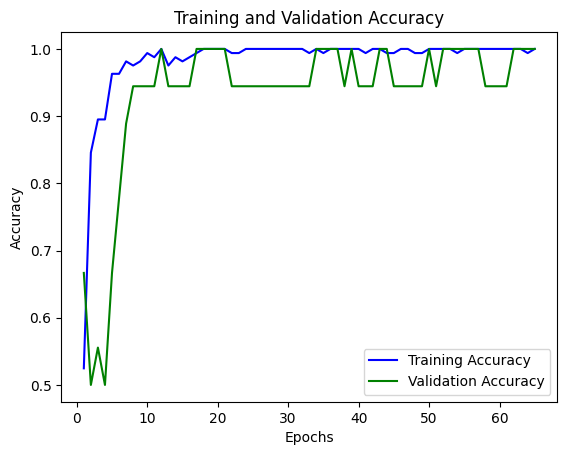


# Evaluate on test data
20/20 [==============================] - 0s 5ms/step - loss: 0.1423 - accuracy: 0.9000
Score for fold 10: loss of 0.14226439595222473; accuracy of 89.99999761581421%
1/1 [==============================] - 0s 150ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.8958333333333334
Accuracy Per Fold:  0.9
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.044
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.038
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.138
>          - Accuracy: 90.000%
>          - AUC 100.000%
>          - F1: 89.583%
----------------------------------

<ipython-input-15-56b6b828fbcc>:250: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'Fold Number': list(range(1, fold_counter)),


     Event Pair  Highest AUC Score  Highest Accuracy  Highest F1 Score  \
0   hand vs sub                1.0              0.95          0.948849   
1   hand vs sub                1.0              1.00          1.000000   
2   hand vs sub                1.0              1.00          1.000000   
3   hand vs sub                1.0              1.00          1.000000   
4   hand vs sub                1.0              1.00          1.000000   
5   hand vs sub                1.0              1.00          1.000000   
6   hand vs sub                1.0              1.00          1.000000   
7   hand vs sub                1.0              1.00          1.000000   
8   hand vs sub                1.0              1.00          1.000000   
9   hand vs sub                1.0              1.00          1.000000   
10  hand vs sub                1.0              1.00          1.000000   
11  hand vs sub                1.0              1.00          1.000000   
12  hand vs sub                1.0    

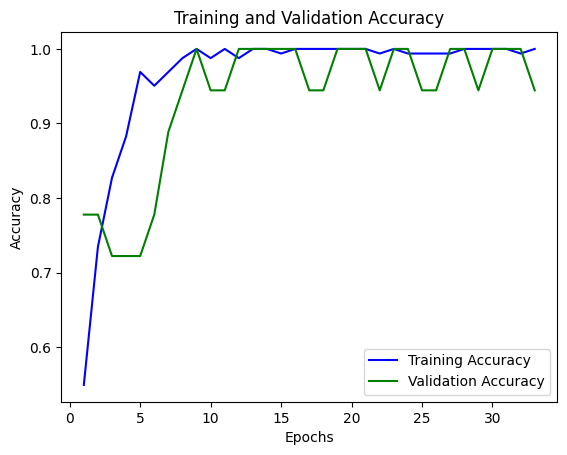


# Evaluate on test data
20/20 [==============================] - 0s 5ms/step - loss: 0.0683 - accuracy: 0.9500
Score for fold 1: loss of 0.06831483542919159; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 123ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.948849104859335
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.068
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.885%
------------------------------------------------------------------------
Average scores for all folds:
> Loss: 0.06831483542919159
> Accuracy: 94.9999988079071 (+- 0.0)
> AUC: 1.0
> F1: 0.948849104859335
------------------------------------------------------------------------
Event Pair: hand vs sub
Highest AUC Score: 1.0
Highest F1 Score: 1.0
Highest Accuracy Score: 1.0
Best kl value: 8
Best 

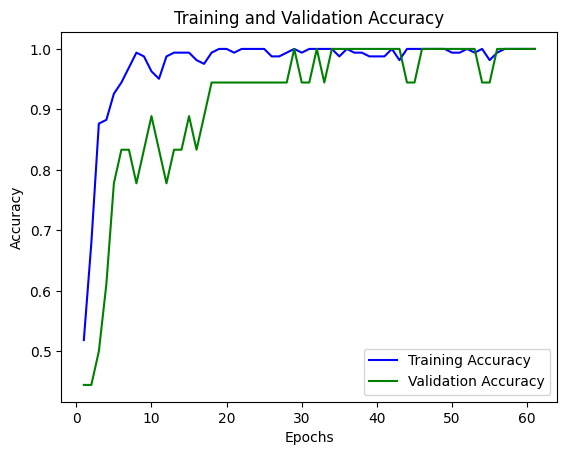


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0144 - accuracy: 1.0000
Score for fold 2: loss of 0.014413614757359028; accuracy of 100.0%
1/1 [==============================] - 0s 118ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.068
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.014
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
Average scores for all folds:
> Loss: 0.04136422509327531
> Accuracy: 97.49999940395355 (+- 2.5000005960464478)
> AUC: 1.0
> F1: 0.9744245524296675
--------------------

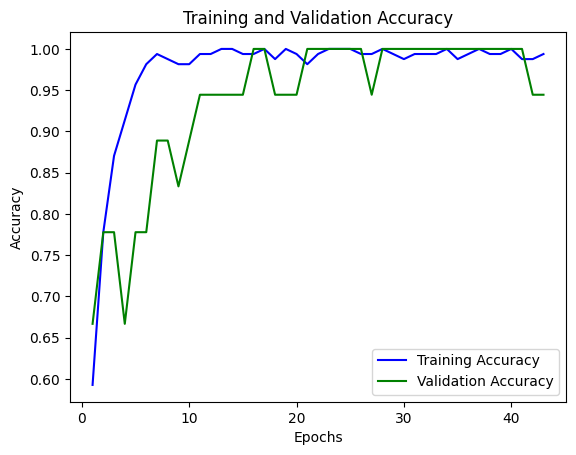


# Evaluate on test data
20/20 [==============================] - 0s 5ms/step - loss: 0.1128 - accuracy: 0.9500
Score for fold 3: loss of 0.11281124502420425; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 119ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.9430199430199431
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.068
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.014
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.113
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.302%
-------------------------------------

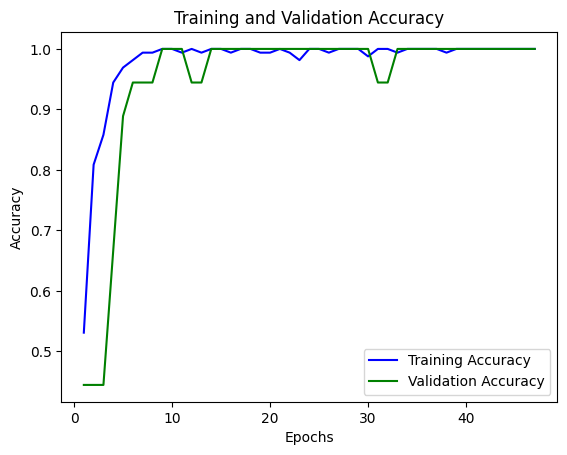


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0079 - accuracy: 1.0000
Score for fold 4: loss of 0.007926744408905506; accuracy of 100.0%
1/1 [==============================] - 0s 109ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.068
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.014
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.113
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.302%
---------------------------------------------------------------

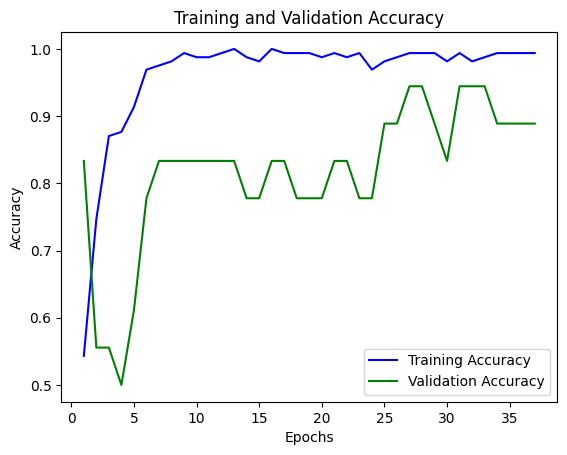


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1780 - accuracy: 0.9500
Score for fold 5: loss of 0.17800743877887726; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 138ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.9466666666666668
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.068
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.014
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.113
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.302%
-------------------------------------

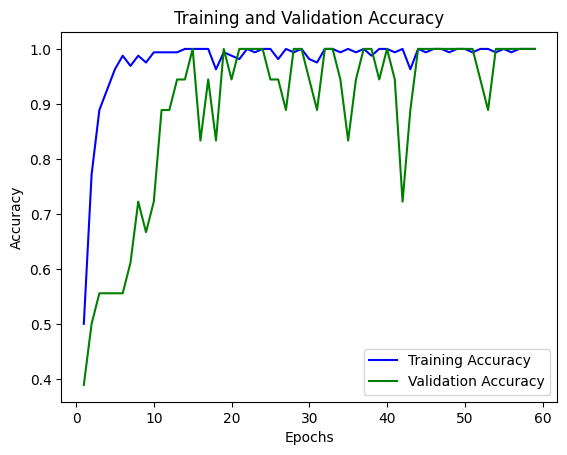


# Evaluate on test data
20/20 [==============================] - 0s 5ms/step - loss: 0.2100 - accuracy: 0.9500
Score for fold 6: loss of 0.21000997722148895; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 114ms/step
AUC Accuracy Score Per Fold: 0.989010989010989
F1 Score Per Fold:  0.9466666666666668
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.068
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.014
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.113
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.302%
-----------------------

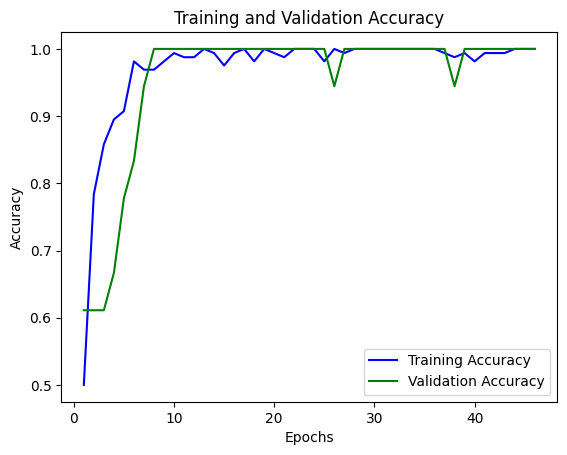


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0311 - accuracy: 1.0000
Score for fold 7: loss of 0.031141245737671852; accuracy of 100.0%
1/1 [==============================] - 0s 107ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.068
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.014
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.113
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.302%
---------------------------------------------------------------

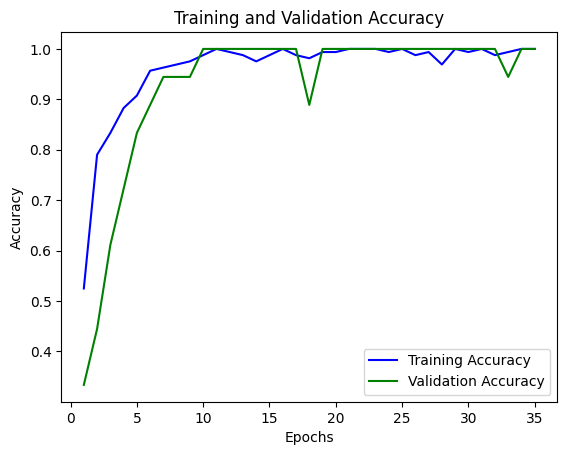


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.2238 - accuracy: 0.9000
Score for fold 8: loss of 0.2238389551639557; accuracy of 89.99999761581421%
1/1 [==============================] - 0s 142ms/step
AUC Accuracy Score Per Fold: 0.9898989898989898
F1 Score Per Fold:  0.8958333333333334
Accuracy Per Fold:  0.9
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.068
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.014
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.113
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.302%
-----------------------

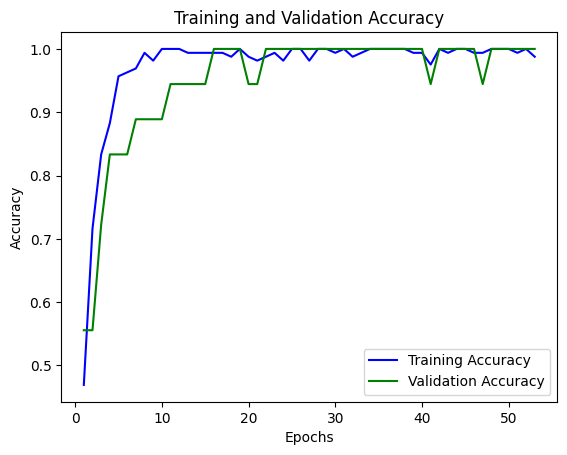


# Evaluate on test data
20/20 [==============================] - 0s 5ms/step - loss: 0.0570 - accuracy: 1.0000
Score for fold 9: loss of 0.05700218677520752; accuracy of 100.0%
1/1 [==============================] - 0s 161ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.068
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.014
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.113
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.302%
----------------------------------------------------------------

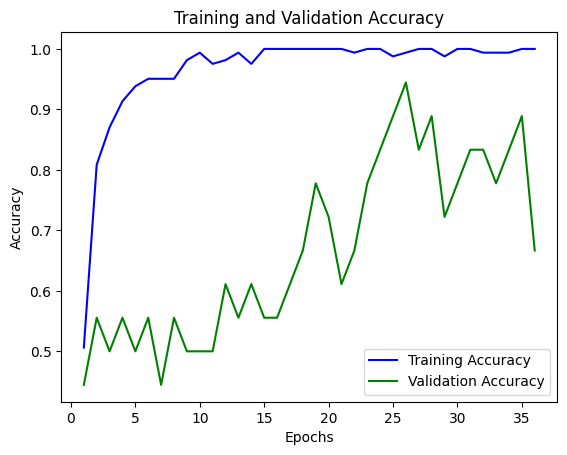


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1242 - accuracy: 0.9500
Score for fold 10: loss of 0.1242334395647049; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 160ms/step
AUC Accuracy Score Per Fold: 0.989010989010989
F1 Score Per Fold:  0.9466666666666668
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.068
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.885%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.014
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.113
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.302%
-----------------------

<ipython-input-15-56b6b828fbcc>:250: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'Fold Number': list(range(1, fold_counter)),


     Event Pair  Highest AUC Score  Highest Accuracy  Highest F1 Score  \
0   hand vs sub                1.0              0.95          0.948849   
1   hand vs sub                1.0              1.00          1.000000   
2   hand vs sub                1.0              1.00          1.000000   
3   hand vs sub                1.0              1.00          1.000000   
4   hand vs sub                1.0              1.00          1.000000   
5   hand vs sub                1.0              1.00          1.000000   
6   hand vs sub                1.0              1.00          1.000000   
7   hand vs sub                1.0              1.00          1.000000   
8   hand vs sub                1.0              1.00          1.000000   
9   hand vs sub                1.0              1.00          1.000000   
10  hand vs sub                1.0              1.00          1.000000   
11  hand vs sub                1.0              1.00          1.000000   
12  hand vs sub                1.0    

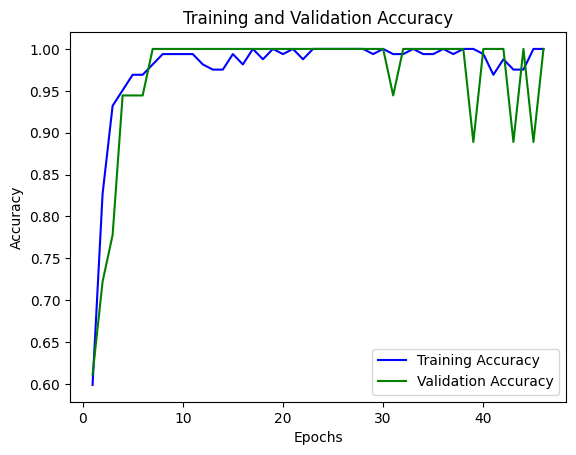


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0435 - accuracy: 1.0000
Score for fold 1: loss of 0.04349937662482262; accuracy of 100.0%
1/1 [==============================] - 0s 116ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.043
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
Average scores for all folds:
> Loss: 0.04349937662482262
> Accuracy: 100.0 (+- 0.0)
> AUC: 1.0
> F1: 1.0
------------------------------------------------------------------------
Event Pair: hand vs sub
Highest AUC Score: 1.0
Highest F1 Score: 1.0
Highest Accuracy Score: 1.0
Best kl value: 8
Best d value: 0.1
>Train: 0=180, 1=180, Test: 0=20, 1=

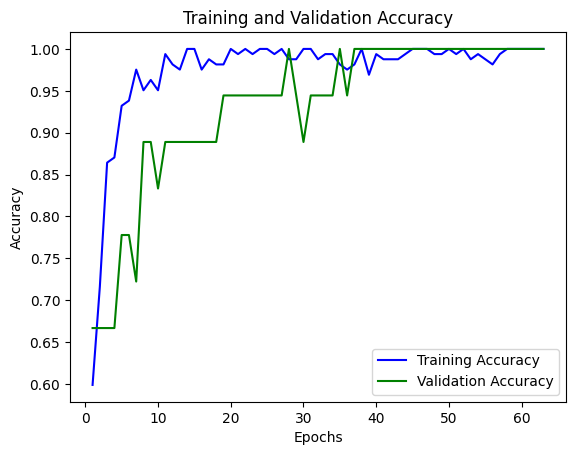


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0089 - accuracy: 1.0000
Score for fold 2: loss of 0.008883556351065636; accuracy of 100.0%
1/1 [==============================] - 0s 119ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.043
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.009
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
Average scores for all folds:
> Loss: 0.026191466487944126
> Accuracy: 100.0 (+- 0.0)
> AUC: 1.0
> F1: 1.0
-----------------------------------------------------------

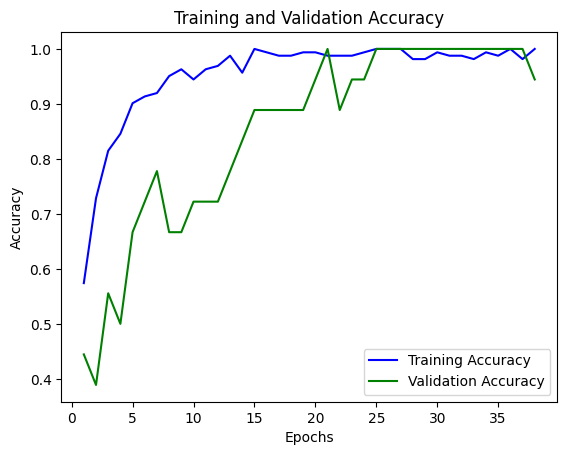


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.2588 - accuracy: 0.8500
Score for fold 3: loss of 0.25875332951545715; accuracy of 85.00000238418579%
1/1 [==============================] - 0s 124ms/step
AUC Accuracy Score Per Fold: 0.945054945054945
F1 Score Per Fold:  0.829059829059829
Accuracy Per Fold:  0.85
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.043
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.009
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.259
>          - Accuracy: 85.000%
>          - AUC 94.505%
>          - F1: 82.906%
----------------------

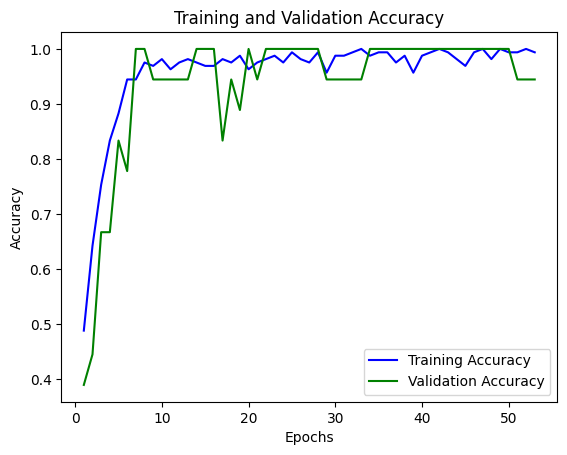


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0334 - accuracy: 1.0000
Score for fold 4: loss of 0.03342344984412193; accuracy of 100.0%
1/1 [==============================] - 0s 121ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.043
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.009
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.259
>          - Accuracy: 85.000%
>          - AUC 94.505%
>          - F1: 82.906%
---------------------------------------------------------------

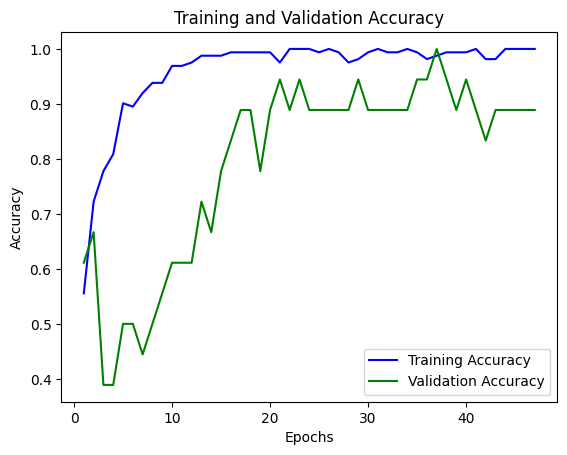


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1740 - accuracy: 0.9500
Score for fold 5: loss of 0.17403154075145721; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 122ms/step
AUC Accuracy Score Per Fold: 0.9780219780219781
F1 Score Per Fold:  0.9466666666666668
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.043
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.009
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.259
>          - Accuracy: 85.000%
>          - AUC 94.505%
>          - F1: 82.906%
---------------------

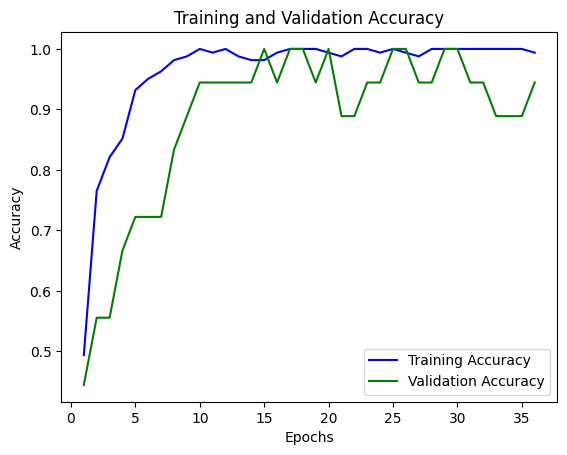


# Evaluate on test data
20/20 [==============================] - 0s 5ms/step - loss: 0.1469 - accuracy: 0.9500
Score for fold 6: loss of 0.1469043791294098; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 132ms/step
AUC Accuracy Score Per Fold: 0.989010989010989
F1 Score Per Fold:  0.9466666666666668
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.043
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.009
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.259
>          - Accuracy: 85.000%
>          - AUC 94.505%
>          - F1: 82.906%
-----------------------

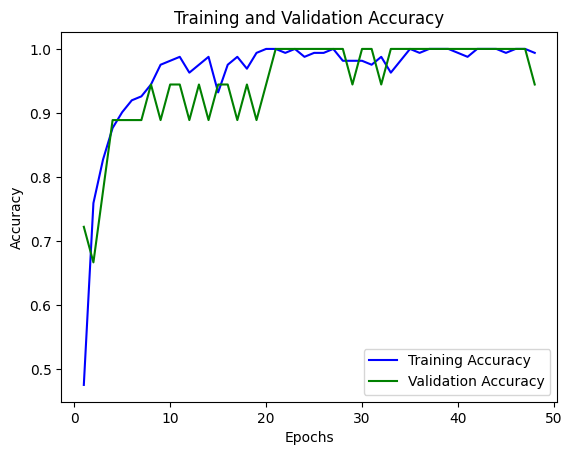


# Evaluate on test data
20/20 [==============================] - 0s 5ms/step - loss: 0.0702 - accuracy: 1.0000
Score for fold 7: loss of 0.07020958513021469; accuracy of 100.0%
1/1 [==============================] - 0s 164ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.043
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.009
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.259
>          - Accuracy: 85.000%
>          - AUC 94.505%
>          - F1: 82.906%
---------------------------------------------------------------

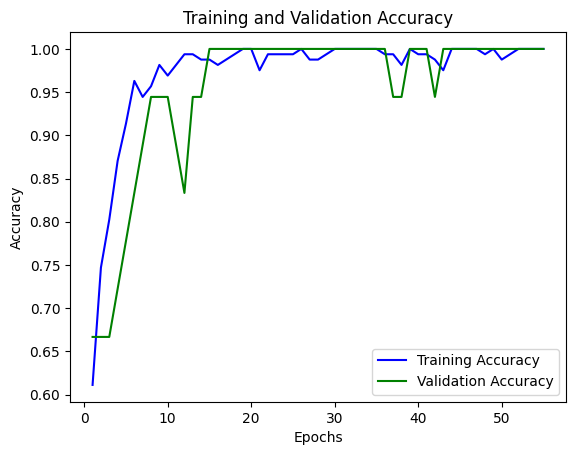


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1838 - accuracy: 0.9000
Score for fold 8: loss of 0.183794766664505; accuracy of 89.99999761581421%
1/1 [==============================] - 0s 112ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.8958333333333334
Accuracy Per Fold:  0.9
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.043
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.009
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.259
>          - Accuracy: 85.000%
>          - AUC 94.505%
>          - F1: 82.906%
--------------------------------------

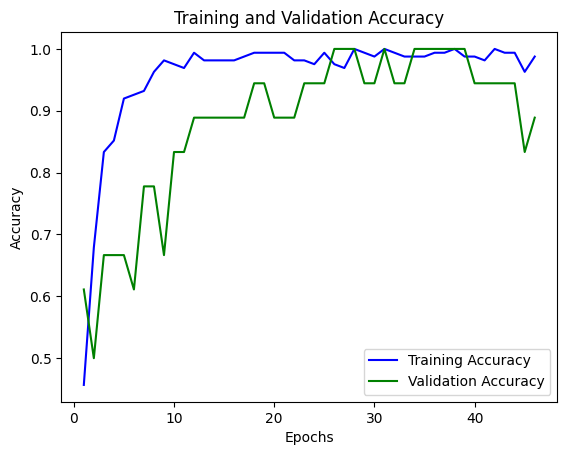


# Evaluate on test data
20/20 [==============================] - 0s 5ms/step - loss: 0.1925 - accuracy: 0.9500
Score for fold 9: loss of 0.19253423810005188; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 113ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.9430199430199431
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.043
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.009
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.259
>          - Accuracy: 85.000%
>          - AUC 94.505%
>          - F1: 82.906%
------------------------------------

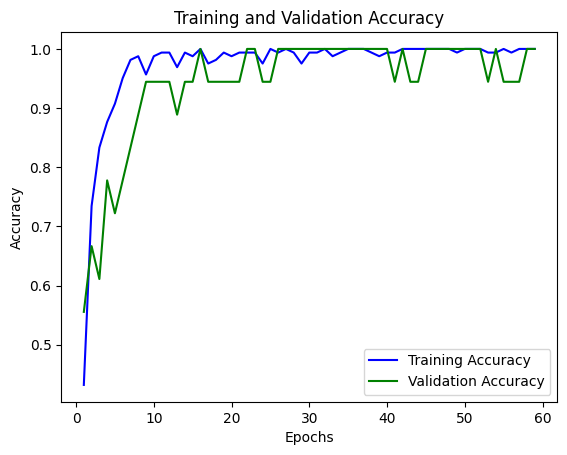


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0621 - accuracy: 1.0000
Score for fold 10: loss of 0.06210942938923836; accuracy of 100.0%
1/1 [==============================] - 0s 116ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.043
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.009
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.259
>          - Accuracy: 85.000%
>          - AUC 94.505%
>          - F1: 82.906%
--------------------------------------------------------------

<ipython-input-15-56b6b828fbcc>:250: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'Fold Number': list(range(1, fold_counter)),


     Event Pair  Highest AUC Score  Highest Accuracy  Highest F1 Score  \
0   hand vs sub                1.0              0.95          0.948849   
1   hand vs sub                1.0              1.00          1.000000   
2   hand vs sub                1.0              1.00          1.000000   
3   hand vs sub                1.0              1.00          1.000000   
4   hand vs sub                1.0              1.00          1.000000   
5   hand vs sub                1.0              1.00          1.000000   
6   hand vs sub                1.0              1.00          1.000000   
7   hand vs sub                1.0              1.00          1.000000   
8   hand vs sub                1.0              1.00          1.000000   
9   hand vs sub                1.0              1.00          1.000000   
10  hand vs sub                1.0              1.00          1.000000   
11  hand vs sub                1.0              1.00          1.000000   
12  hand vs sub                1.0    

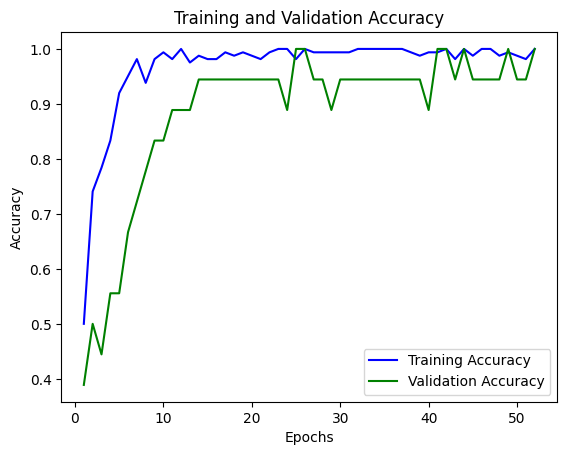


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0266 - accuracy: 1.0000
Score for fold 1: loss of 0.026587164029479027; accuracy of 100.0%
1/1 [==============================] - 0s 110ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.027
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
Average scores for all folds:
> Loss: 0.026587164029479027
> Accuracy: 100.0 (+- 0.0)
> AUC: 1.0
> F1: 1.0
------------------------------------------------------------------------
Event Pair: hand vs sub
Highest AUC Score: 1.0
Highest F1 Score: 1.0
Highest Accuracy Score: 1.0
Best kl value: 8
Best d value: 0.1
>Train: 0=180, 1=180, Test: 0=20, 

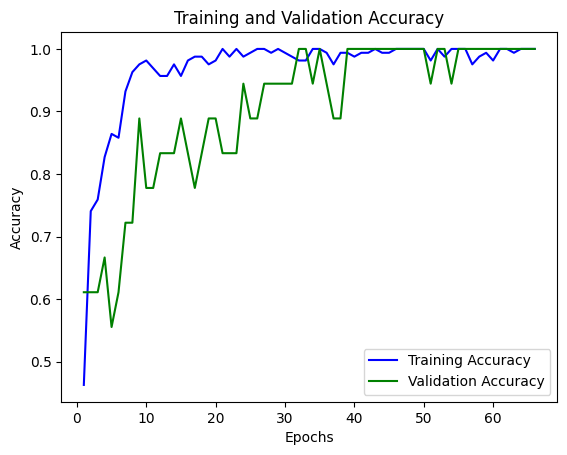


# Evaluate on test data
20/20 [==============================] - 0s 5ms/step - loss: 0.0360 - accuracy: 1.0000
Score for fold 2: loss of 0.03599677234888077; accuracy of 100.0%
1/1 [==============================] - 0s 106ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.027
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.036
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
Average scores for all folds:
> Loss: 0.0312919681891799
> Accuracy: 100.0 (+- 0.0)
> AUC: 1.0
> F1: 1.0
--------------------------------------------------------------

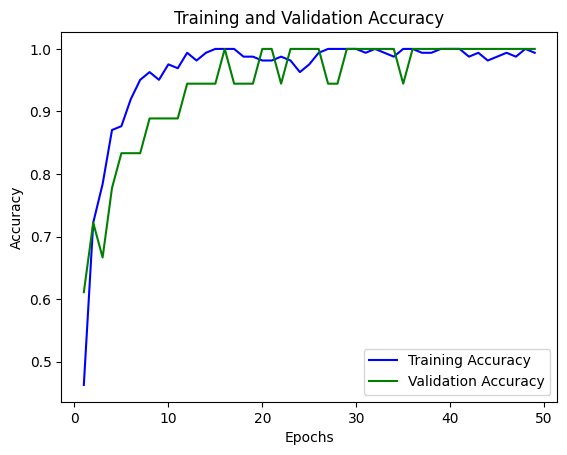


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1408 - accuracy: 0.9000
Score for fold 3: loss of 0.14078685641288757; accuracy of 89.99999761581421%
1/1 [==============================] - 0s 114ms/step
AUC Accuracy Score Per Fold: 0.989010989010989
F1 Score Per Fold:  0.8958333333333334
Accuracy Per Fold:  0.9
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.027
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.036
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.141
>          - Accuracy: 90.000%
>          - AUC 98.901%
>          - F1: 89.583%
----------------------

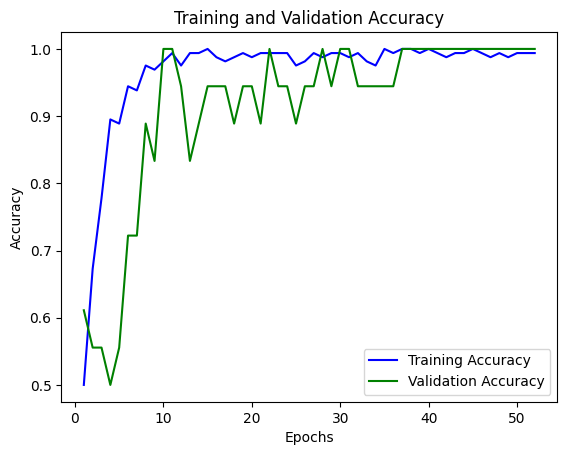


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0423 - accuracy: 1.0000
Score for fold 4: loss of 0.04225199297070503; accuracy of 100.0%
1/1 [==============================] - 0s 136ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.027
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.036
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.141
>          - Accuracy: 90.000%
>          - AUC 98.901%
>          - F1: 89.583%
---------------------------------------------------------------

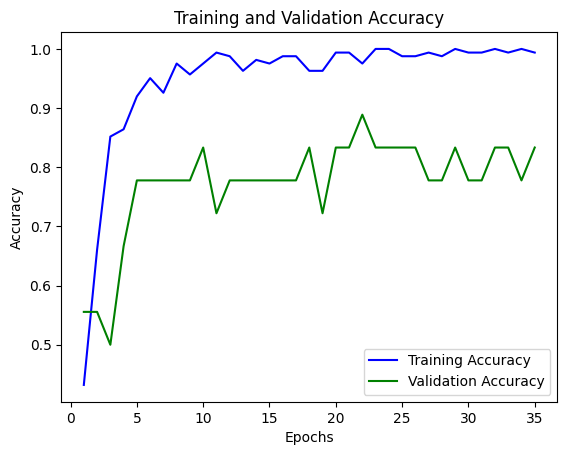


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1966 - accuracy: 0.9500
Score for fold 5: loss of 0.19660499691963196; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 134ms/step
AUC Accuracy Score Per Fold: 0.9780219780219781
F1 Score Per Fold:  0.9466666666666668
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.027
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.036
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.141
>          - Accuracy: 90.000%
>          - AUC 98.901%
>          - F1: 89.583%
---------------------

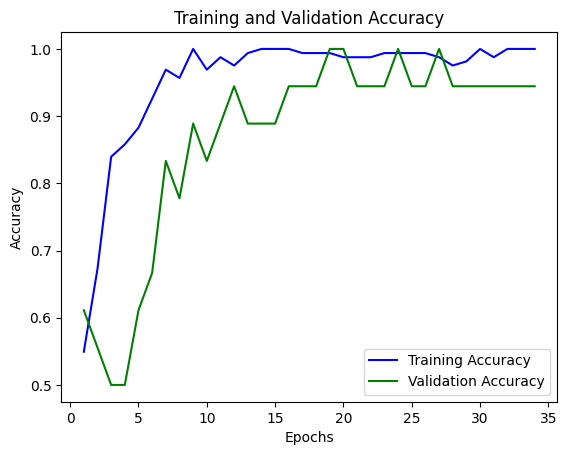


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1015 - accuracy: 0.9500
Score for fold 6: loss of 0.10150110721588135; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 129ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.9466666666666668
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.027
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.036
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.141
>          - Accuracy: 90.000%
>          - AUC 98.901%
>          - F1: 89.583%
------------------------------------

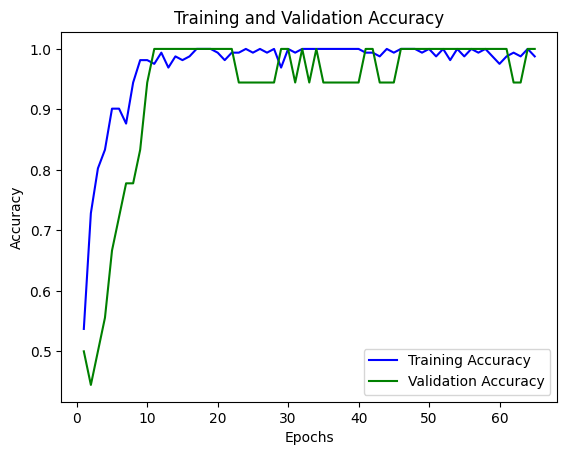


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0341 - accuracy: 1.0000
Score for fold 7: loss of 0.03414464369416237; accuracy of 100.0%
1/1 [==============================] - 0s 111ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.027
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.036
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.141
>          - Accuracy: 90.000%
>          - AUC 98.901%
>          - F1: 89.583%
---------------------------------------------------------------

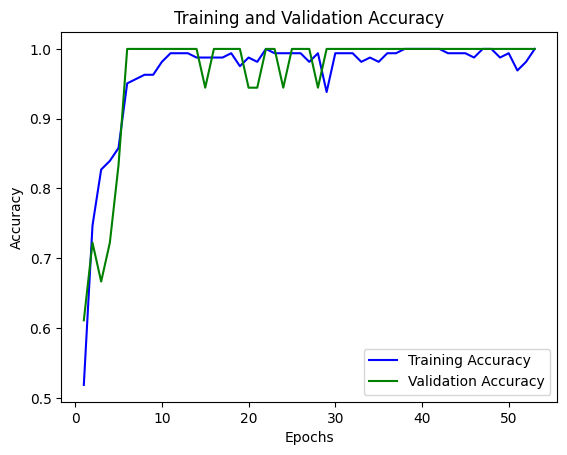


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1958 - accuracy: 0.9000
Score for fold 8: loss of 0.19578206539154053; accuracy of 89.99999761581421%
1/1 [==============================] - 0s 117ms/step
AUC Accuracy Score Per Fold: 0.9696969696969697
F1 Score Per Fold:  0.898989898989899
Accuracy Per Fold:  0.9
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.027
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.036
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.141
>          - Accuracy: 90.000%
>          - AUC 98.901%
>          - F1: 89.583%
----------------------

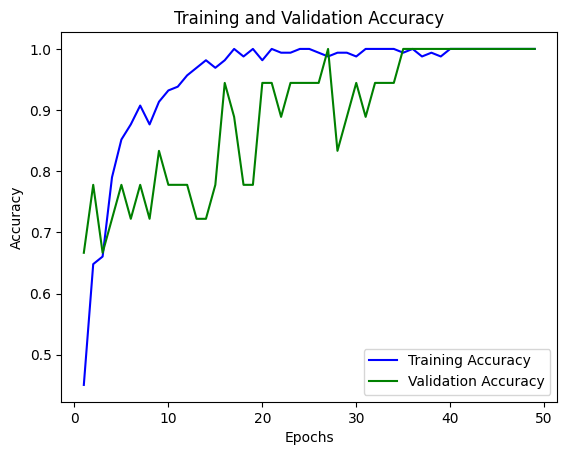


# Evaluate on test data
20/20 [==============================] - 0s 6ms/step - loss: 0.0921 - accuracy: 0.9000
Score for fold 9: loss of 0.09214090555906296; accuracy of 89.99999761581421%
1/1 [==============================] - 0s 147ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.8901098901098901
Accuracy Per Fold:  0.9
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.027
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.036
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.141
>          - Accuracy: 90.000%
>          - AUC 98.901%
>          - F1: 89.583%
------------------------------------

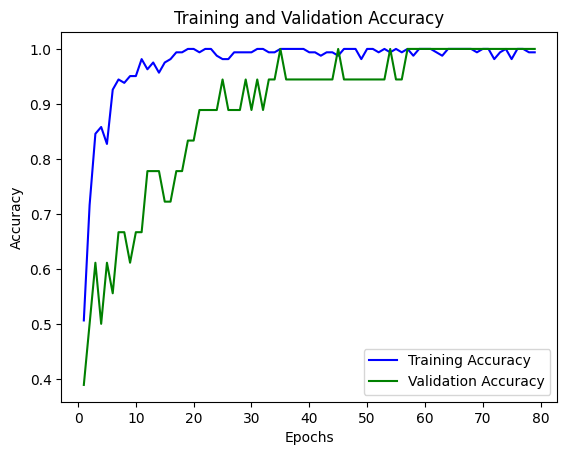


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0931 - accuracy: 0.9500
Score for fold 10: loss of 0.093075230717659; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 106ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.9430199430199431
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.027
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.036
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.141
>          - Accuracy: 90.000%
>          - AUC 98.901%
>          - F1: 89.583%
-------------------------------------

<ipython-input-15-56b6b828fbcc>:250: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'Fold Number': list(range(1, fold_counter)),


     Event Pair  Highest AUC Score  Highest Accuracy  Highest F1 Score  \
0   hand vs sub                1.0              0.95          0.948849   
1   hand vs sub                1.0              1.00          1.000000   
2   hand vs sub                1.0              1.00          1.000000   
3   hand vs sub                1.0              1.00          1.000000   
4   hand vs sub                1.0              1.00          1.000000   
5   hand vs sub                1.0              1.00          1.000000   
6   hand vs sub                1.0              1.00          1.000000   
7   hand vs sub                1.0              1.00          1.000000   
8   hand vs sub                1.0              1.00          1.000000   
9   hand vs sub                1.0              1.00          1.000000   
10  hand vs sub                1.0              1.00          1.000000   
11  hand vs sub                1.0              1.00          1.000000   
12  hand vs sub                1.0    

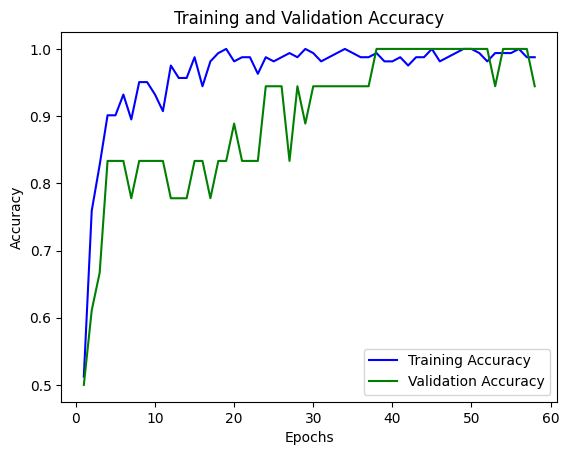


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0604 - accuracy: 1.0000
Score for fold 1: loss of 0.06037648767232895; accuracy of 100.0%
1/1 [==============================] - 0s 107ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.060
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
Average scores for all folds:
> Loss: 0.06037648767232895
> Accuracy: 100.0 (+- 0.0)
> AUC: 1.0
> F1: 1.0
------------------------------------------------------------------------
Event Pair: hand vs sub
Highest AUC Score: 1.0
Highest F1 Score: 1.0
Highest Accuracy Score: 1.0
Best kl value: 8
Best d value: 0.1
>Train: 0=180, 1=180, Test: 0=20, 1=

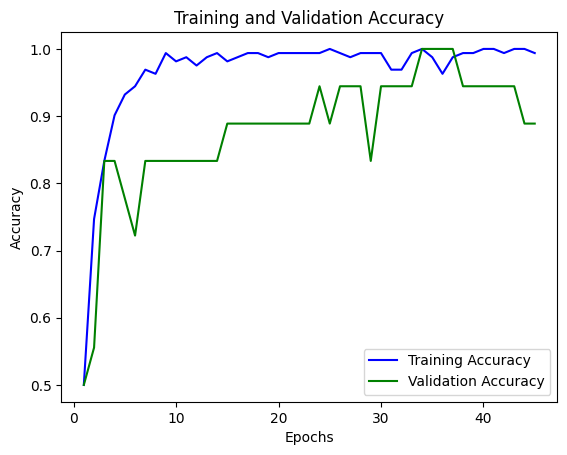


# Evaluate on test data
20/20 [==============================] - 0s 5ms/step - loss: 0.0232 - accuracy: 1.0000
Score for fold 2: loss of 0.023172879591584206; accuracy of 100.0%
1/1 [==============================] - 0s 132ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.060
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.023
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
Average scores for all folds:
> Loss: 0.04177468363195658
> Accuracy: 100.0 (+- 0.0)
> AUC: 1.0
> F1: 1.0
------------------------------------------------------------

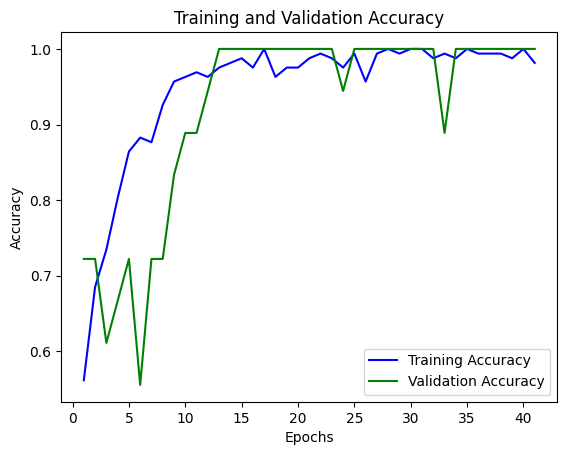


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1175 - accuracy: 0.9500
Score for fold 3: loss of 0.11745709180831909; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 121ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.9430199430199431
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.060
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.023
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.117
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.302%
-----------------------------------

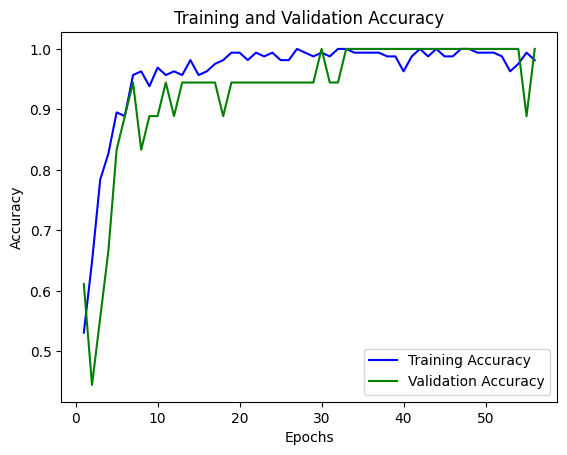


# Evaluate on test data
20/20 [==============================] - 0s 5ms/step - loss: 0.0194 - accuracy: 1.0000
Score for fold 4: loss of 0.019384723156690598; accuracy of 100.0%
1/1 [==============================] - 0s 113ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.060
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.023
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.117
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.302%
-------------------------------------------------------------

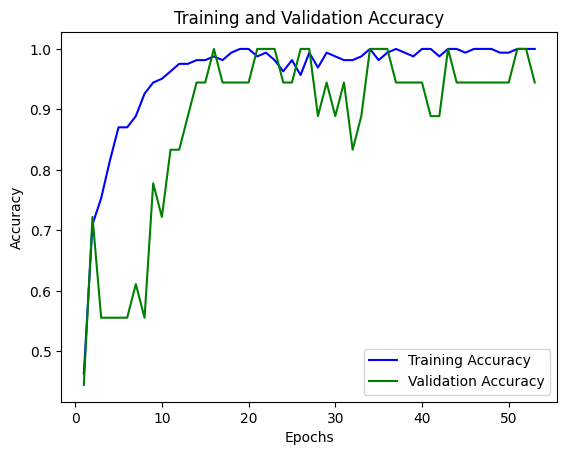


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.2425 - accuracy: 0.9000
Score for fold 5: loss of 0.24245187640190125; accuracy of 89.99999761581421%
1/1 [==============================] - 0s 110ms/step
AUC Accuracy Score Per Fold: 0.989010989010989
F1 Score Per Fold:  0.8958333333333334
Accuracy Per Fold:  0.9
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.060
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.023
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.117
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.302%
---------------------

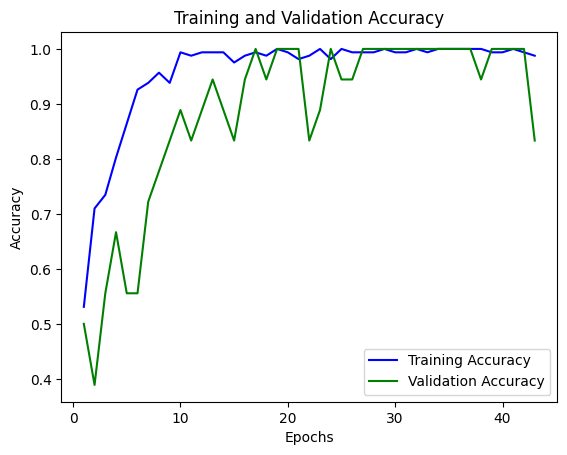


# Evaluate on test data
20/20 [==============================] - 0s 5ms/step - loss: 0.1700 - accuracy: 0.9000
Score for fold 6: loss of 0.16995473206043243; accuracy of 89.99999761581421%
1/1 [==============================] - 0s 114ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.8958333333333334
Accuracy Per Fold:  0.9
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.060
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.023
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.117
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.302%
-----------------------------------

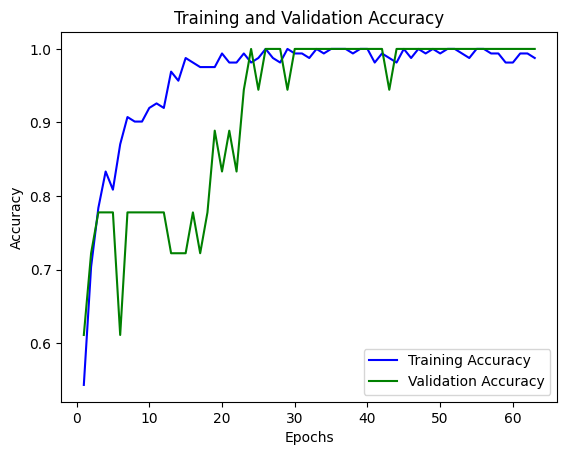


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0495 - accuracy: 1.0000
Score for fold 7: loss of 0.04948043450713158; accuracy of 100.0%
1/1 [==============================] - 0s 129ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.060
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.023
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.117
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.302%
--------------------------------------------------------------

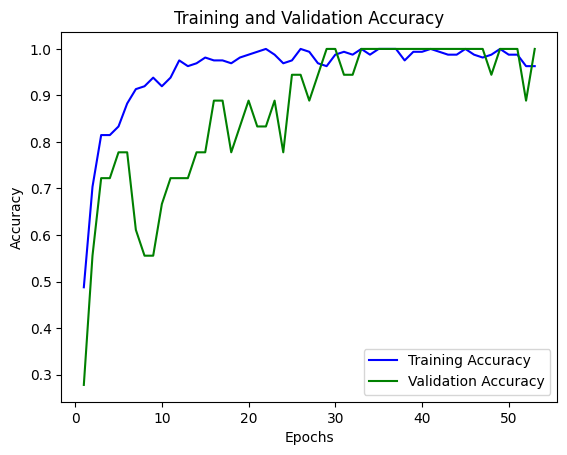


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.4014 - accuracy: 0.8500
Score for fold 8: loss of 0.4014400541782379; accuracy of 85.00000238418579%
1/1 [==============================] - 0s 109ms/step
AUC Accuracy Score Per Fold: 0.9494949494949495
F1 Score Per Fold:  0.8465473145780051
Accuracy Per Fold:  0.85
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.060
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.023
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.117
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.302%
--------------------

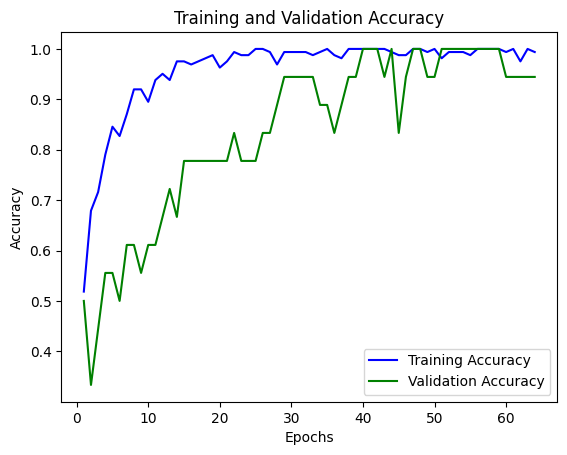


# Evaluate on test data
20/20 [==============================] - 0s 5ms/step - loss: 0.0409 - accuracy: 1.0000
Score for fold 9: loss of 0.040885016322135925; accuracy of 100.0%
1/1 [==============================] - 0s 120ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.060
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.023
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.117
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.302%
-------------------------------------------------------------

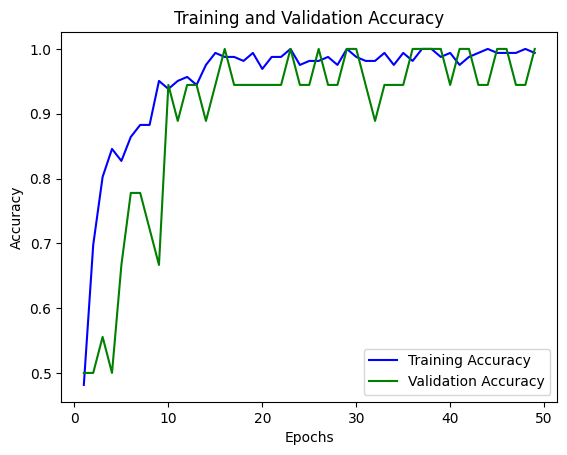


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0261 - accuracy: 1.0000
Score for fold 10: loss of 0.026140188798308372; accuracy of 100.0%
1/1 [==============================] - 0s 154ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.060
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.023
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.117
>          - Accuracy: 95.000%
>          - AUC 100.000%
>          - F1: 94.302%
------------------------------------------------------------

<ipython-input-15-56b6b828fbcc>:250: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'Fold Number': list(range(1, fold_counter)),


     Event Pair  Highest AUC Score  Highest Accuracy  Highest F1 Score  \
0   hand vs sub                1.0              0.95          0.948849   
1   hand vs sub                1.0              1.00          1.000000   
2   hand vs sub                1.0              1.00          1.000000   
3   hand vs sub                1.0              1.00          1.000000   
4   hand vs sub                1.0              1.00          1.000000   
5   hand vs sub                1.0              1.00          1.000000   
6   hand vs sub                1.0              1.00          1.000000   
7   hand vs sub                1.0              1.00          1.000000   
8   hand vs sub                1.0              1.00          1.000000   
9   hand vs sub                1.0              1.00          1.000000   
10  hand vs sub                1.0              1.00          1.000000   
11  hand vs sub                1.0              1.00          1.000000   
12  hand vs sub                1.0    

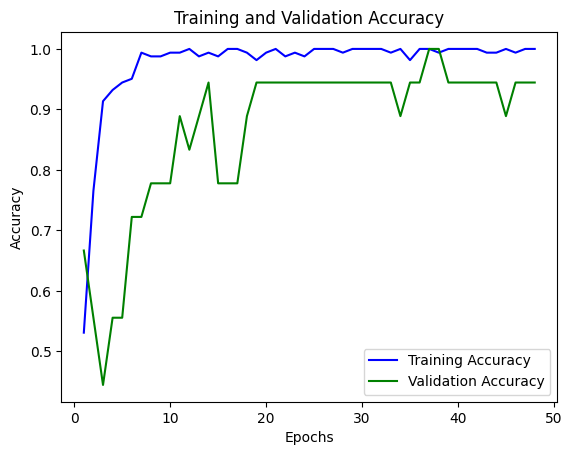


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0740 - accuracy: 1.0000
Score for fold 1: loss of 0.07401666790246964; accuracy of 100.0%
1/1 [==============================] - 1s 580ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.074
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
Average scores for all folds:
> Loss: 0.07401666790246964
> Accuracy: 100.0 (+- 0.0)
> AUC: 1.0
> F1: 1.0
------------------------------------------------------------------------
Event Pair: hand vs sub
Highest AUC Score: 1.0
Highest F1 Score: 1.0
Highest Accuracy Score: 1.0
Best kl value: 8
Best d value: 0.1
>Train: 0=180, 1=180, Test: 0=20, 1=

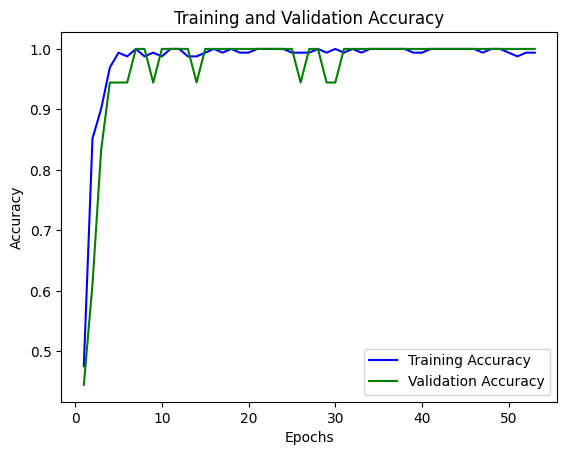


# Evaluate on test data
20/20 [==============================] - 0s 5ms/step - loss: 0.0707 - accuracy: 1.0000
Score for fold 2: loss of 0.07070998847484589; accuracy of 100.0%
1/1 [==============================] - 0s 117ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.074
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.071
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
Average scores for all folds:
> Loss: 0.07236332818865776
> Accuracy: 100.0 (+- 0.0)
> AUC: 1.0
> F1: 1.0
-------------------------------------------------------------

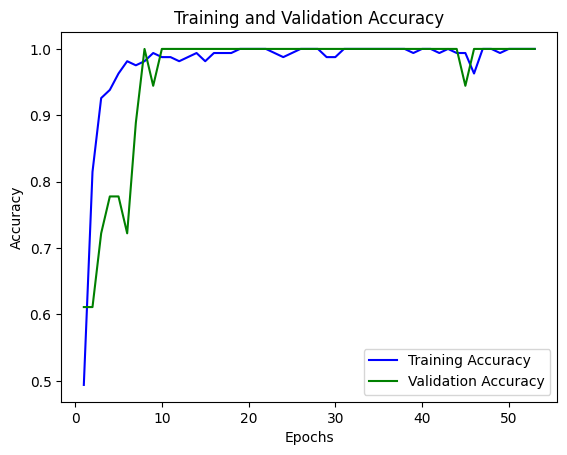


# Evaluate on test data
20/20 [==============================] - 0s 5ms/step - loss: 0.0750 - accuracy: 1.0000
Score for fold 3: loss of 0.07499491423368454; accuracy of 100.0%
1/1 [==============================] - 0s 109ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.074
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.071
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.075
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------

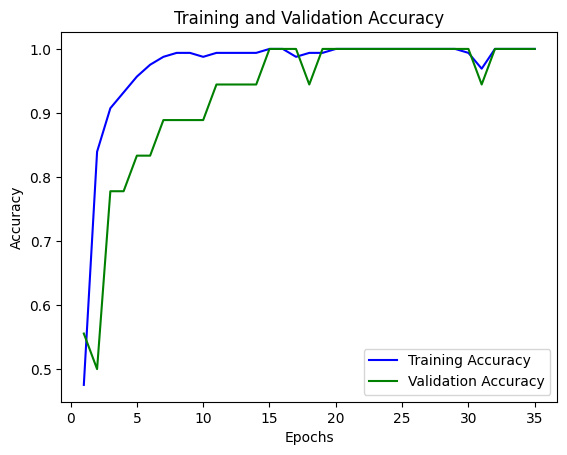


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0548 - accuracy: 1.0000
Score for fold 4: loss of 0.054844021797180176; accuracy of 100.0%
1/1 [==============================] - 0s 108ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.074
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.071
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.075
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
-----------------------------------------------------------

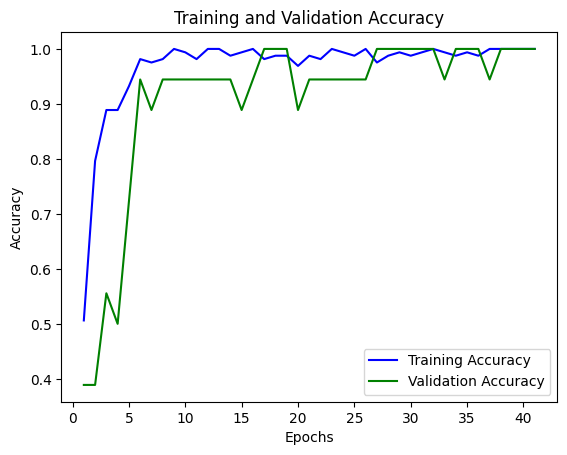


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0613 - accuracy: 1.0000
Score for fold 5: loss of 0.06126991659402847; accuracy of 100.0%
1/1 [==============================] - 0s 106ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.074
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.071
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.075
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------

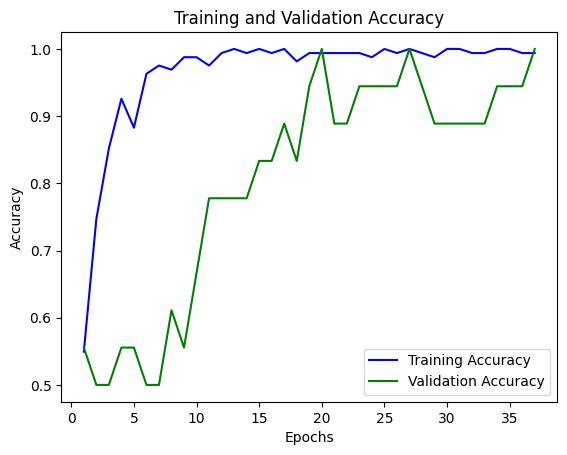


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.2171 - accuracy: 0.8500
Score for fold 6: loss of 0.2171037495136261; accuracy of 85.00000238418579%
1/1 [==============================] - 0s 105ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.8465473145780051
Accuracy Per Fold:  0.85
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.074
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.071
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.075
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
---------------------------------

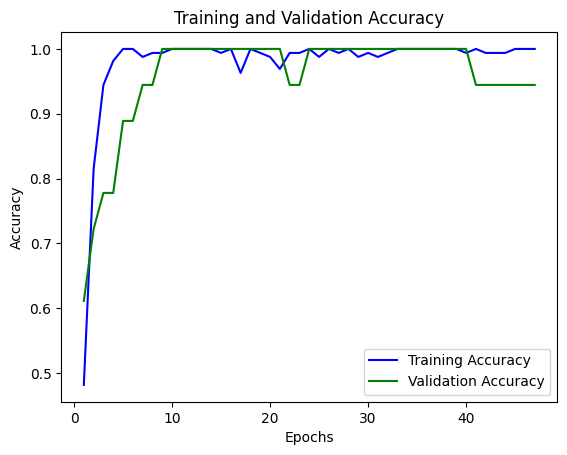


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0990 - accuracy: 0.9500
Score for fold 7: loss of 0.09903976321220398; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 113ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.9430199430199431
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.074
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.071
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.075
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
---------------------------------

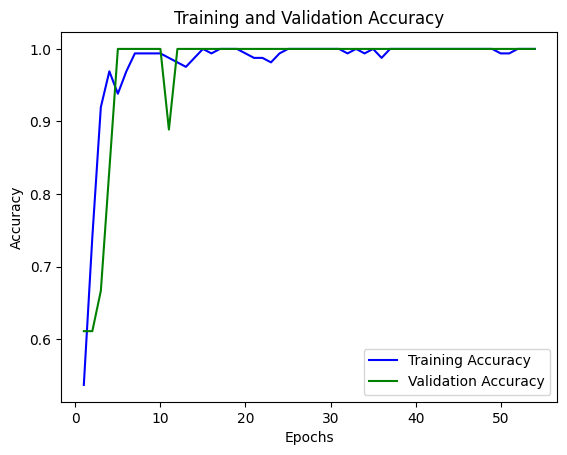


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.1671 - accuracy: 0.9500
Score for fold 8: loss of 0.16709312796592712; accuracy of 94.9999988079071%
1/1 [==============================] - 0s 135ms/step
AUC Accuracy Score Per Fold: 0.9898989898989898
F1 Score Per Fold:  0.948849104859335
Accuracy Per Fold:  0.95
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.074
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.071
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.075
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
-------------------

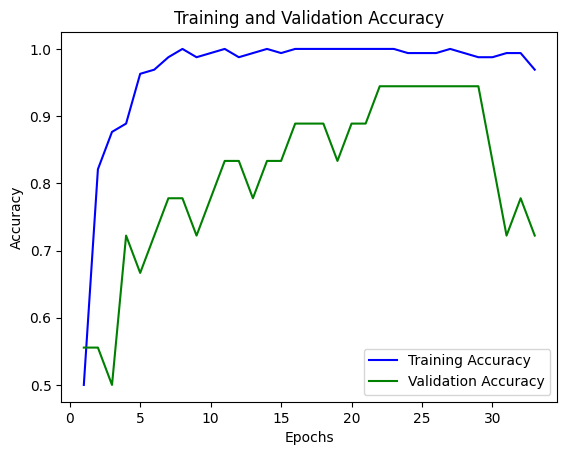


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.5893 - accuracy: 0.7000
Score for fold 9: loss of 0.5892632603645325; accuracy of 69.9999988079071%
1/1 [==============================] - 0s 122ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  0.696969696969697
Accuracy Per Fold:  0.7
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.074
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.071
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.075
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------

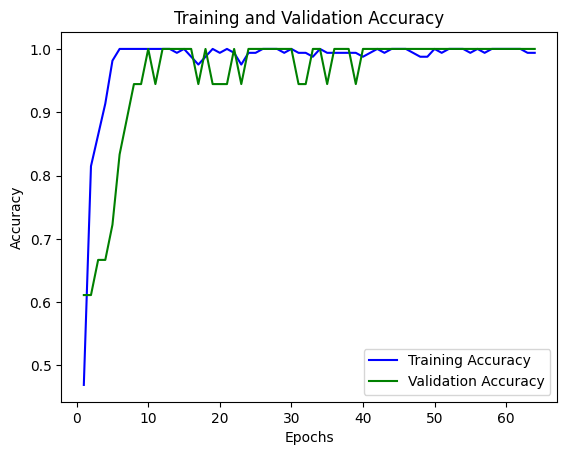


# Evaluate on test data
20/20 [==============================] - 0s 4ms/step - loss: 0.0507 - accuracy: 1.0000
Score for fold 10: loss of 0.05070573091506958; accuracy of 100.0%
1/1 [==============================] - 0s 106ms/step
AUC Accuracy Score Per Fold: 1.0
F1 Score Per Fold:  1.0
Accuracy Per Fold:  1.0
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.074
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.071
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.075
>          - Accuracy: 100.000%
>          - AUC 100.000%
>          - F1: 100.000%
-----------------------------------------------------------

<ipython-input-15-56b6b828fbcc>:250: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'Fold Number': list(range(1, fold_counter)),


     Event Pair  Highest AUC Score  Highest Accuracy  Highest F1 Score  \
0   hand vs sub                1.0              0.95          0.948849   
1   hand vs sub                1.0              1.00          1.000000   
2   hand vs sub                1.0              1.00          1.000000   
3   hand vs sub                1.0              1.00          1.000000   
4   hand vs sub                1.0              1.00          1.000000   
5   hand vs sub                1.0              1.00          1.000000   
6   hand vs sub                1.0              1.00          1.000000   
7   hand vs sub                1.0              1.00          1.000000   
8   hand vs sub                1.0              1.00          1.000000   
9   hand vs sub                1.0              1.00          1.000000   
10  hand vs sub                1.0              1.00          1.000000   
11  hand vs sub                1.0              1.00          1.000000   
12  hand vs sub                1.0    

In [ ]:
from sklearn.model_selection import KFold, StratifiedKFold, cross_val_score
from sklearn.utils import shuffle
from sklearn.preprocessing import LabelEncoder, LabelBinarizer


subject_input = os.path.splitext(os.path.basename(str(epoched_data.filename)))[0].split("s_epochs")[0] + str('_results')

# Choosing kernel length values
kl_values = [8, 16, 32, 64, 128]

# Controlling dropout values
d_values = [0.1, 0.2, 0.3, 0.4, 0.5]

# Number of selected maximum epochs to choose
n_epochs = 300

# Create a list of event pair names for the menu
event_pair_names = list(event_pairs_dict.keys())

# Display the menu to the user and prompt for selection
print("Select an event pair:")
for i, event_pair_name in enumerate(event_pair_names, 1):
    print(f"{i}. {event_pair_name}")

selected_index = int(input("Enter the number corresponding to the event pair: ")) - 1

# Check if the selected index is within the valid range
if 0 <= selected_index < len(event_pair_names):
    # Get the selected event pair name
    selected_event_pair = event_pair_names[selected_index]

    # Get the associated event pair function from the dictionary using the selected key
    event_pair_function = event_pairs_dict[selected_event_pair]

    # Preprocess data for the selected event pair using the associated function
    epochs_selected = preprocess_data(event_pair_function, epoched_data)


    results_df = pd.DataFrame(columns=['Event Pair', 'Highest AUC Score', 'Highest Accuracy', 'Highest F1 Score', 'Average ROC AUC', 'Average Accuracy', 'Average F1 Score', 'kl', 'd'])

    X = epochs_selected.get_data()
    y = epochs_selected.events[:, -1]
    y.reshape(-1, 1)


    X = min_max_scaler(X)
    X = mne_standard_scaler(X)
    encoder = OneHotEncoder(sparse_output=False)
    y = encoder.fit_transform(y.reshape(-1, 1))

    # Initialize variables to store the best parameters for each event pair
    highest_auc_score = 0
    highest_f1_score = 0
    highest_accuracy = 0

    # Initialize lists to store the average metrics for each kl and d combination

    acc_per_fold = []
    loss_per_fold = []
    auc_scores = []
    accuracy_scores = []
    f1_scores = []

    best_kl = None
    best_d = None

    # KFold CV
    kf = KFold(n_splits=10, shuffle=True, random_state=42)

    for kl in kl_values:
        for d in d_values:
            print()
            print("Current kl:", kl)
            print("Current d:", d)
            print()

            # Initialize lists to store accuracy and loss per fold
            acc_per_fold = []
            loss_per_fold = []

            auc_scores = []
            accuracy_scores = []
            f1_scores = []

            accuracies_per_fold = []
            f1_per_fold = []
            roc_auc_per_fold = []
            best_kl_per_fold = []
            best_d_per_fold = []


            #skf.get_n_splits(X, y)
            fold_counter = 1
            for fold_index, (train_index, test_index) in enumerate(kf.split(X, y)):
                # Split the data into training and validation sets for this fold
                X_train, X_test = X[train_index, :], X[test_index, :]
                y_train, y_test = y[train_index], y[test_index]
                 # summarize train and test composition
                train_0, train_1 = len(y_train[y_train==0]), len(y_train[y_train==1])
                test_0, test_1 = len(y_test[y_test==0]), len(y_test[y_test==1])
                print('>Train: 0=%d, 1=%d, Test: 0=%d, 1=%d' % (train_0, train_1, test_0, test_1))
                print("Fold:", fold_counter)

                # Shuffle training set
                X_train, y_train = shuffle(X_train, y_train, random_state=42)

                # Shuffle test set
                X_test, y_test = shuffle(X_test, y_test, random_state=42)

                # Configure the EEGNet model
                model = EEGNet(nb_classes=2, Chans=204, Samples=2001, dropoutRate=d, kernLength=kl, norm_rate=0.25,
                               F1=8, D=2, F2=16, dropoutType='Dropout')

                #model.add(Dense(1, activation='sigmoid'))

                # Compile the model
                model.compile(loss='categorical_crossentropy', optimizer="adam", metrics=['accuracy'])

                # Generate a print
                print('------------------------------------------------------------------------')
                print(f'Training for fold {fold_counter} ...')
                print()
                print("Current kl:", kl)
                print("Current d:", d)
                print()

                # Set a valid path for model checkpoints
                checkpointer = ModelCheckpoint(filepath='/tmp/checkpoint.h5', verbose=1, save_best_only=True)

                # Class weights
                class_weights = {0: 1, 1: 1}

                # Fit the model to the training data
                history = model.fit(X_train, y_train, batch_size=16, epochs=n_epochs, verbose=2,
                                    validation_split=0.1, callbacks=[checkpointer, EarlyStopping(patience=10)], class_weight=class_weights)

                # Access the accuracy values from the history object
                train_accuracy = history.history['accuracy']
                val_accuracy = history.history['val_accuracy']

                # Plot the training and validation accuracy
                epochs = range(1, len(train_accuracy) + 1)
                plt.plot(epochs, train_accuracy, 'b', label='Training Accuracy')
                plt.plot(epochs, val_accuracy, 'g', label='Validation Accuracy')
                plt.title('Training and Validation Accuracy')
                plt.xlabel('Epochs')
                plt.ylabel('Accuracy')
                plt.legend()
                plt.show()

                print('\n# Evaluate on test data')
                results = model.evaluate(X_test, y_test, batch_size=1)
                print(f'Score for fold {fold_counter}: {model.metrics_names[0]} of {results[0]}; {model.metrics_names[1]} of {results[1]*100}%')

                acc_per_fold.append(results[1] * 100)
                loss_per_fold.append(results[0])

                # Evaluate the model on the test data
                y_pred = model.predict(X_test)

                # Calculate AUC Score
                auc_score = roc_auc_score(y_test, y_pred, average='macro')
                auc_scores.append(auc_score)

                # Print the AUC accuracy score
                print('AUC Accuracy Score Per Fold:', auc_score)

                roc_auc_per_fold.append(auc_score)

                # Calculate and store F1 score per fold
                f1 = f1_score(y_test.argmax(axis=1), y_pred.argmax(axis=1), average='macro')
                f1_scores.append(f1)

                # Print Accuracy Score per Fold
                print('F1 Score Per Fold: ', f1)

                f1_per_fold.append(f1)

                # Calculate and store the accuracy score for this fold
                accuracy = accuracy_score(y_test.argmax(axis=1), y_pred.argmax(axis=1))
                accuracy_scores.append(accuracy)

                # Print Accuracy Score per fold
                print('Accuracy Per Fold: ', accuracy)

                accuracies_per_fold.append(accuracy)
                best_kl_per_fold.append(kl)
                best_d_per_fold.append(d)

                # Check if the current AUC score is higher than the highest recorded score
                if auc_score > highest_auc_score:
                    highest_auc_score = auc_score
                    best_kl = kl
                    best_d = d

                # Check if the current F1 score is higher than the highest recorded score
                if f1 > highest_f1_score:
                    highest_f1_score = f1

                # Check if the current accuracy score is higher than the highest recorded score
                if accuracy > highest_accuracy:
                    highest_accuracy = accuracy

                # Calculate the mean values across all folds for the current kl and d combination
                mean_accuracy = np.mean(acc_per_fold)
                mean_auc_score = np.mean(auc_scores)
                mean_f1_score = np.mean(f1_scores)


                # Reset the Keras session to clear the model
                K.clear_session()

                                # == Provide average scores ==
                print('------------------------------------------------------------------------')
                print('Score per fold')
                for i in range(0, len(acc_per_fold)):
                    print('------------------------------------------------------------------------')
                    print(f'> Fold {i+1} - Loss: {loss_per_fold[i]:.3f}')
                    print(f'>          - Accuracy: {acc_per_fold[i]:.3f}%')
                    print(f'>          - AUC {auc_scores[i] * 100:.3f}%')

                    print(f'>          - F1: {f1_scores[i] * 100:.3f}%')


                # Print the average accuracy and loss for the current kl and d combination
                print('------------------------------------------------------------------------')
                print('Average scores for all folds:')
                print(f'> Loss: {np.mean(loss_per_fold)}')
                print(f'> Accuracy: {np.mean(acc_per_fold)} (+- {np.std(acc_per_fold)})')
                print(f'> AUC: {np.mean(auc_scores)}')
                print(f'> F1: {np.mean(f1_scores)}')
                print('------------------------------------------------------------------------')

                # Print the event pair, highest AUC score, kl value, and d value
                print("Event Pair:", selected_event_pair)
                print("Highest AUC Score:", highest_auc_score)
                print("Highest F1 Score:", highest_f1_score)
                print("Highest Accuracy Score:", highest_accuracy)
                print("Best kl value:", best_kl)
                print("Best d value:", best_d)

                fold_counter += 1


            mean_accuracy_all_folds = np.mean(accuracies_per_fold)
            mean_f1_all_folds = np.mean(f1_per_fold)
            mean_roc_auc_all_folds = np.mean(roc_auc_per_fold)

            # Append results for current kl and d combination to dataframe
            results_df = results_df.append({'Fold Number': list(range(1, fold_counter)),
                                            'Event Pair': selected_event_pair,
                                            'Highest AUC Score': highest_auc_score,
                                            'Highest Accuracy': highest_accuracy,
                                            'Highest F1 Score': highest_f1_score,
                                            'kl': best_kl,
                                            'd': best_d,
                                            '10-Fold Accuracy': accuracies_per_fold,
                                            '10-Fold F1 Score': f1_per_fold,
                                            '10-Fold ROC AUC Score': roc_auc_per_fold,
                                            'Mean 10-Fold Accuracy': mean_accuracy_all_folds,
                                            'Mean 10-Fold F1 Score': mean_f1_all_folds,
                                            'Mean 10-Fold ROC AUC Score': mean_roc_auc_all_folds},
                                            ignore_index=True)

            # 10 Fold CV completed
            print('>>> 10-Fold Cross Validation completed for current Kernel Length and DropOut combination <<<')

            # # Check if any of the evaluation metrics achieve 100%
            # if highest_mean_auc_score == 95 or highest_mean_f1_score == 95 or highest_mean_accuracy == 0.95:
            #     print("Achieved 100% accuracy/F1/ROC AUC. Stopping the search.")

            #     # Save the results to a file
            #     out_f_name = f'/content/drive/MyDrive/Maxwell Filtered Data/Combined Run data/acc_EEGNet_epochs_300_filtered_{subject_input}_{selected_event_pair}.npy'
            #     np.save(out_f_name, results_df)

            #     # Save the model
            #     history.model.save(f'/content/drive/MyDrive/Maxwell Filtered Data/Combined Run data/acc_EEGNet_epochs_300_filtered_model_file_{subject_input}_{selected_event_pair}.h5')
            #     # Print the final results table
            #     print(results_df)
            #     out_f_name_csv = f'/content/drive/MyDrive/Maxwell Filtered Data/Combined Run data/acc_EEGNet_epochs_300_filtered_{subject_input}_{selected_event_pair}.csv'
            #     results_df.to_csv(out_f_name_csv, index=False)
            #     break  # Break out of the for loops

            # else:
            #     # Save the model
            #     history.model.save(f'/content/drive/MyDrive/Maxwell Filtered Data/Combined Run data/acc_EEGNet_epochs_300_filtered_model_file_{subject_input}_{selected_event_pair}.h5')
            #     # Print the final results table
            #     print(results_df)
            #     out_f_name_csv = f'/content/drive/MyDrive/Maxwell Filtered Data/Combined Run data/acc_EEGNet_epochs_300_filtered_{subject_input}_{selected_event_pair}.csv'
            #     results_df.to_csv(out_f_name_csv, index=False)
            #     # Save the results to a file
            #     out_f_name = f'/content/drive/MyDrive/Maxwell Filtered Data/Combined Run data/acc_EEGNet_epochs_300_filtered_{subject_input}_{selected_event_pair}.npy'
            #     np.save(out_f_name, results_df)


            # Save the results to a file
            out_f_name = f'/content/drive/MyDrive/Maxwell Filtered Data/Combined Run data/acc_EEGNet_epochs_300_filtered_{subject_input}_{selected_event_pair}.npy'
            np.save(out_f_name, results_df)

            # Print the final results table
            print(results_df)
            out_f_name_csv = f'/content/drive/MyDrive/Maxwell Filtered Data/Combined Run data/acc_EEGNet_epochs_300_filtered_{subject_input}_{selected_event_pair}.csv'
            results_df.to_csv(out_f_name_csv, index=False)

            # Save the model
            history.model.save(f'/content/drive/MyDrive/Maxwell Filtered Data/Combined Run data/acc_EEGNet_epochs_300_filtered_model_file_{subject_input}_{selected_event_pair}.h5')
            # Print the final results table
            print(results_df)

In [ ]:
out_f_name_csv = f'/content/drive/MyDrive/Maxwell Filtered Data/Combined Run data/acc_EEGNet_epochs_300_filtered_{subject_input}_{selected_event_pair}.csv'
results_df.to_csv(out_f_name_csv)

In [ ]:
print(results_df)

Empty DataFrame
Columns: [Event Pair, AUC Score, kl, d]
Index: []
